In [1]:
import pandas as pd
import numpy as np

import warnings
warnings.simplefilter("ignore")

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from datetime import datetime
import datetime as dt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from pylab import rcParams
sns.set_style("whitegrid", {'axes.grid' : True})



In [2]:
# df = pd.read_csv('MiniLink_out_all_new.csv', sep=',')
# df


In [3]:
df = pd.read_csv('https://raw.githubusercontent.com/edwan70/Datasets/main/MiniLink_out_all_new0323.csv', sep=',')
df

,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2,month,year,date
0,2019-10-07 07:21:00,-55.7,-69.1,-53.0,-46.9,-48.3,-44.0,-45.0,-45.7,10,2019,2019-10-07
1,2019-10-07 07:31:00,-57.9,-57.0,-51.9,-47.3,-45.6,-50.4,-40.6,-43.8,10,2019,2019-10-07
2,2019-10-07 07:41:00,-56.3,-62.0,-51.9,-47.3,-45.0,-51.5,-40.2,-44.4,10,2019,2019-10-07
3,2019-10-07 07:51:00,-55.6,-66.7,-51.9,-46.9,-45.3,-49.7,-40.6,-44.4,10,2019,2019-10-07
4,2019-10-07 08:01:00,-56.3,-70.4,-52.2,-45.7,-45.9,-48.8,-41.2,-44.1,10,2019,2019-10-07
...,...,...,...,...,...,...,...,...,...,...,...,...
172926,2023-03-08 13:20:00,-50.7,-54.5,-47.8,-46.8,-48.6,-44.5,-44.8,-45.6,3,2023,2023-03-08
172927,2023-03-08 13:30:00,-49.7,-58.1,-46.6,-48.2,-45.9,-43.9,-45.4,-45.4,3,2023,2023-03-08
172928,2023-03-08 13:40:00,-49.6,-52.6,-48.7,-46.6,-47.5,-44.0,-45.2,-44.9,3,2023,2023-03-08
172929,2023-03-08 13:50:00,-49.3,-55.0,-47.9,-46.9,-52.2,-39.8,-42.8,-46.2,3,2023,2023-03-08


In [4]:
df1 = df
df1["date_time"] = pd.to_datetime(df1["date_time"])
df1['date'] = pd.to_datetime(df1['date'],
format = '%Y-%m-%d')
df1 = df1.astype({'CenDoob1': float, 'CenDoob2': float})
df1 = df1.astype({'DoobCen1': float, 'DoobCen2': float})
df1 = df1.astype({'CenPenay1': float, 'CenPenay2': float})
df1 = df1.astype({'PenayCen1': float, 'PenayCen2': float})
df1.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 172931 entries, 0 to 172930
Data columns (total 12 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   date_time  172931 non-null  datetime64[ns]
 1   CenDoob1   172931 non-null  float64       
 2   CenDoob2   172931 non-null  float64       
 3   DoobCen1   172931 non-null  float64       
 4   DoobCen2   172931 non-null  float64       
 5   CenPenay1  172931 non-null  float64       
 6   CenPenay2  172931 non-null  float64       
 7   PenayCen1  172931 non-null  float64       
 8   PenayCen2  172931 non-null  float64       
 9   month      172931 non-null  int64         
 10  year       172931 non-null  int64         
 11  date       172931 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(8), int64(2)
memory usage: 15.8 MB


In [5]:
df1

,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2,month,year,date
0,2019-10-07 07:21:00,-55.7,-69.1,-53.0,-46.9,-48.3,-44.0,-45.0,-45.7,10,2019,2019-10-07
1,2019-10-07 07:31:00,-57.9,-57.0,-51.9,-47.3,-45.6,-50.4,-40.6,-43.8,10,2019,2019-10-07
2,2019-10-07 07:41:00,-56.3,-62.0,-51.9,-47.3,-45.0,-51.5,-40.2,-44.4,10,2019,2019-10-07
3,2019-10-07 07:51:00,-55.6,-66.7,-51.9,-46.9,-45.3,-49.7,-40.6,-44.4,10,2019,2019-10-07
4,2019-10-07 08:01:00,-56.3,-70.4,-52.2,-45.7,-45.9,-48.8,-41.2,-44.1,10,2019,2019-10-07
...,...,...,...,...,...,...,...,...,...,...,...,...
172926,2023-03-08 13:20:00,-50.7,-54.5,-47.8,-46.8,-48.6,-44.5,-44.8,-45.6,3,2023,2023-03-08
172927,2023-03-08 13:30:00,-49.7,-58.1,-46.6,-48.2,-45.9,-43.9,-45.4,-45.4,3,2023,2023-03-08
172928,2023-03-08 13:40:00,-49.6,-52.6,-48.7,-46.6,-47.5,-44.0,-45.2,-44.9,3,2023,2023-03-08
172929,2023-03-08 13:50:00,-49.3,-55.0,-47.9,-46.9,-52.2,-39.8,-42.8,-46.2,3,2023,2023-03-08


In [6]:
# установим критический уровень сигнала
critical = -58.0
spisok = ['CenPenay1', 'PenayCen1',
          'CenPenay2', 'PenayCen2',
          'CenDoob1', 'DoobCen1',
          'CenDoob2', 'DoobCen2']

In [7]:
def get_plot_dis(df, n):
    # Распределение значений
    ax = sns.displot(df[spisok[n]], kde = False, bins=10)
    ax.set(title = spisok[n]);
plt.show()
    

### 2019 год.

In [8]:
df2 = df1[df1['year'] == 2019][['date_time', 'CenDoob1','CenDoob2',
                                                                 'DoobCen1', 'DoobCen2',
                                                                 'CenPenay1', 'CenPenay2',
                                                                 'PenayCen1', 'PenayCen2' , 
                                                                       'month', 'date']]
df2


,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2,month,date
0,2019-10-07 07:21:00,-55.7,-69.1,-53.0,-46.9,-48.3,-44.0,-45.0,-45.7,10,2019-10-07
1,2019-10-07 07:31:00,-57.9,-57.0,-51.9,-47.3,-45.6,-50.4,-40.6,-43.8,10,2019-10-07
2,2019-10-07 07:41:00,-56.3,-62.0,-51.9,-47.3,-45.0,-51.5,-40.2,-44.4,10,2019-10-07
3,2019-10-07 07:51:00,-55.6,-66.7,-51.9,-46.9,-45.3,-49.7,-40.6,-44.4,10,2019-10-07
4,2019-10-07 08:01:00,-56.3,-70.4,-52.2,-45.7,-45.9,-48.8,-41.2,-44.1,10,2019-10-07
...,...,...,...,...,...,...,...,...,...,...,...
13730,2019-12-31 23:15:00,-46.0,-47.8,-52.0,-43.8,-45.9,-46.3,-38.1,-41.3,12,2019-12-31
13731,2019-12-31 23:25:00,-45.7,-47.2,-55.2,-43.8,-46.1,-47.0,-39.0,-41.3,12,2019-12-31
13732,2019-12-31 23:35:00,-44.3,-45.6,-51.9,-43.4,-46.0,-48.3,-39.0,-41.2,12,2019-12-31
13733,2019-12-31 23:45:00,-47.2,-46.8,-50.2,-46.7,-47.5,-44.8,-39.9,-42.5,12,2019-12-31


In [9]:
df2.to_csv('MiniLink_out_2019_1.csv', index=False) # за 2019 год


In [10]:
pd.set_option("display.precision", 1)
np.set_printoptions(precision=1)
df2.agg([np.mean, np.median, np.min, np.max])


,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2,month,date
mean,2019-11-16 04:29:48.043683840,-52.8,-53.9,-50.6,-47.4,-47.4,-46.7,-44.5,-46.5,11.0,2019-11-15 16:34:50.542409728
median,2019-11-10 07:10:00.000000000,-53.5,-54.0,-49.9,-47.2,-46.6,-46.4,-44.1,-46.6,11.0,2019-11-10 00:00:00.000000000
amin,2019-10-07 07:21:00.000000000,-91.1,-99.9,-99.9,-99.9,-69.9,-99.9,-73.4,-99.9,10.0,2019-10-07 00:00:00.000000000
amax,2019-12-31 23:55:00.000000000,-37.5,-37.1,-40.0,-34.6,-42.7,-38.8,-35.6,-38.1,12.0,2019-12-31 00:00:00.000000000


## РРЛ Пенай 2019 год.

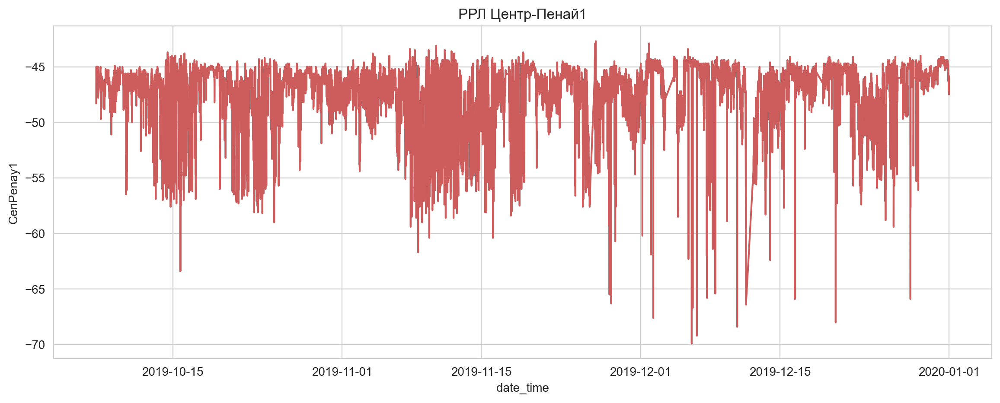

In [11]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenPenay1", data = df2 , legend = 'auto', color = 'indianred')\
                                                                  .set(title='РРЛ Центр-Пенай1');
plt.show()


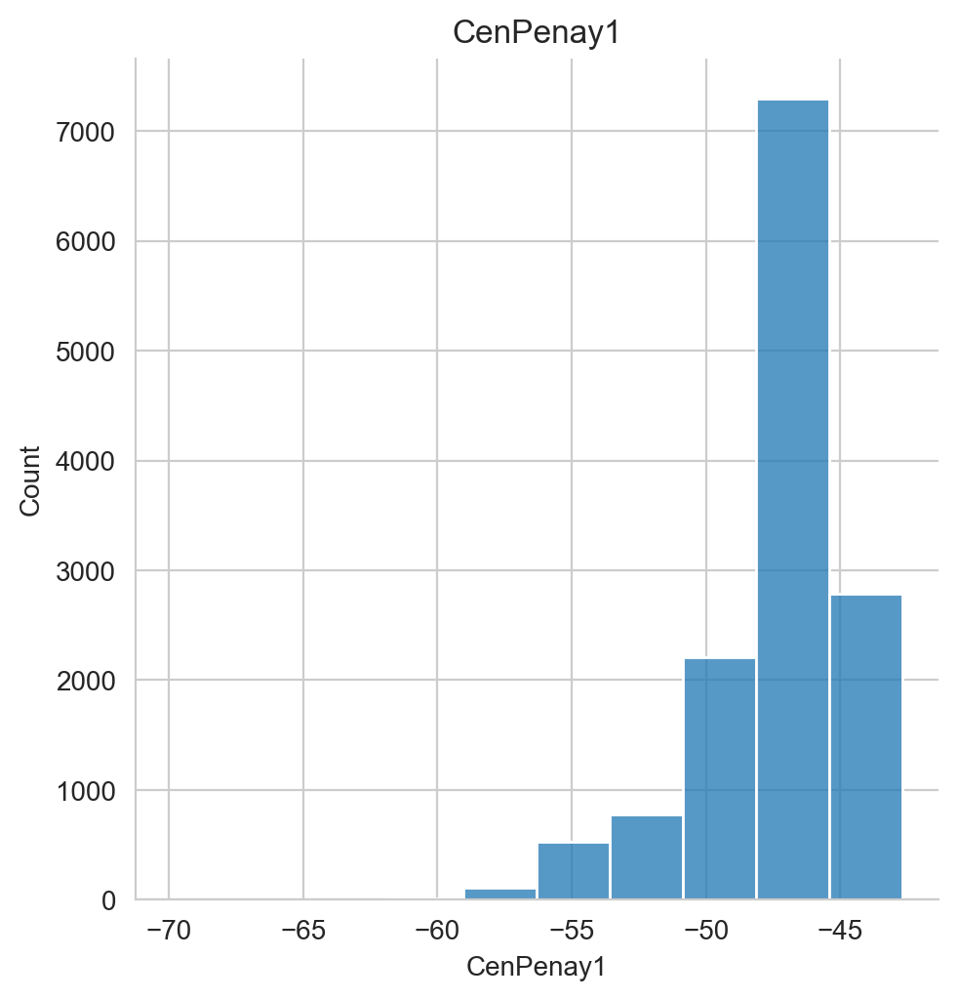

In [12]:
get_plot_dis(df=df2, n=0)

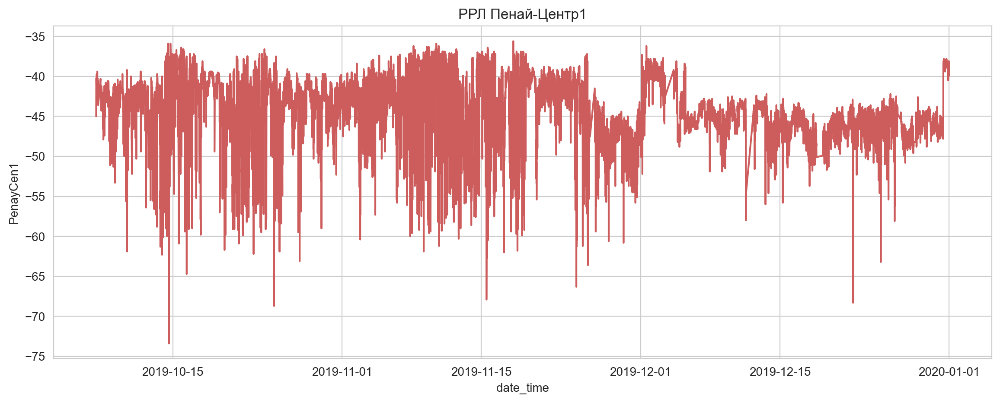

In [13]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "PenayCen1", data = df2 , legend = 'auto', color = 'indianred')\
                                                             .set(title='РРЛ Пенай-Центр1');
plt.show()


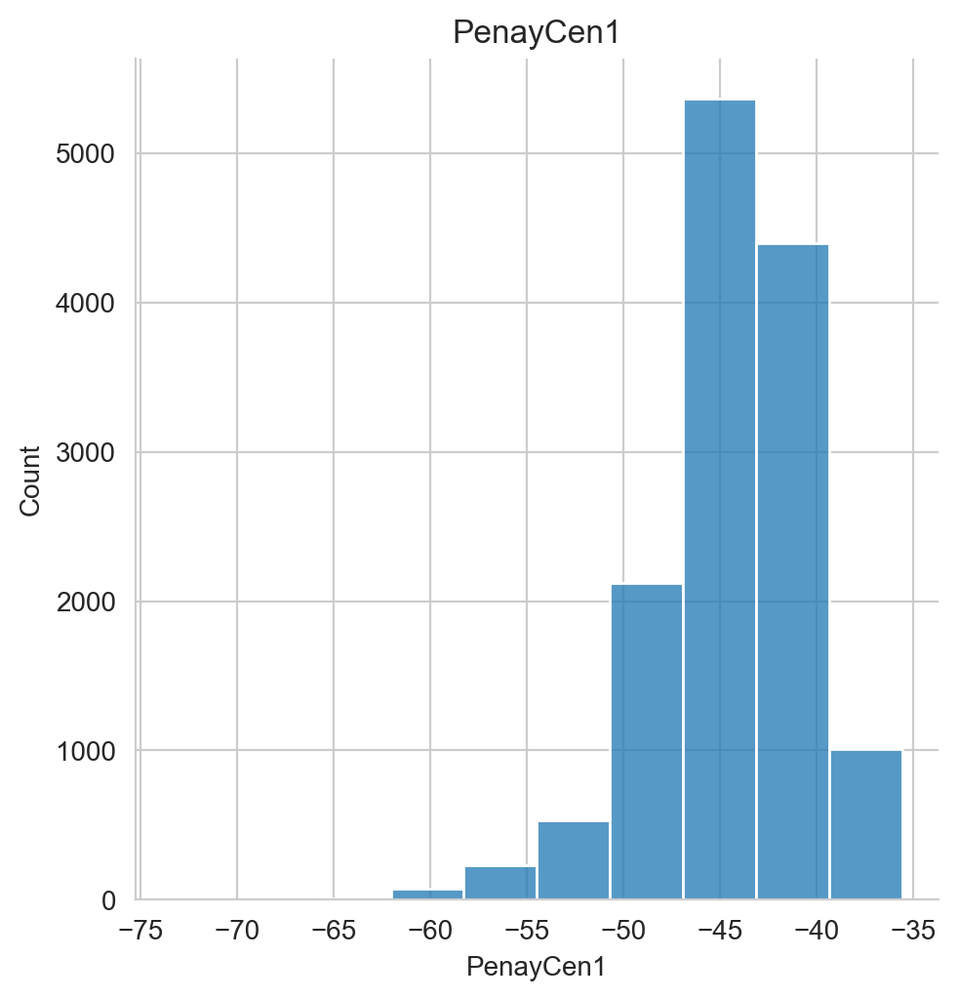

In [14]:
get_plot_dis(df=df2, n=1)

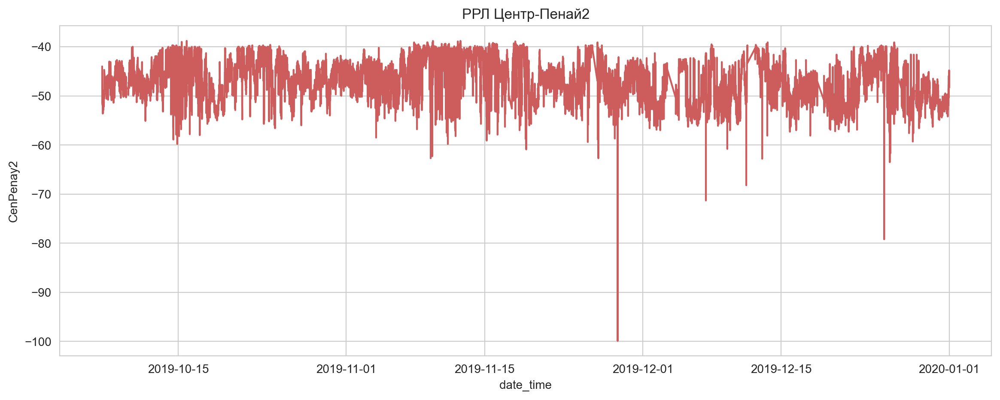

In [15]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenPenay2", data = df2 , legend = 'auto', color = 'indianred')\
                                                                .set(title='РРЛ Центр-Пенай2');
plt.show()


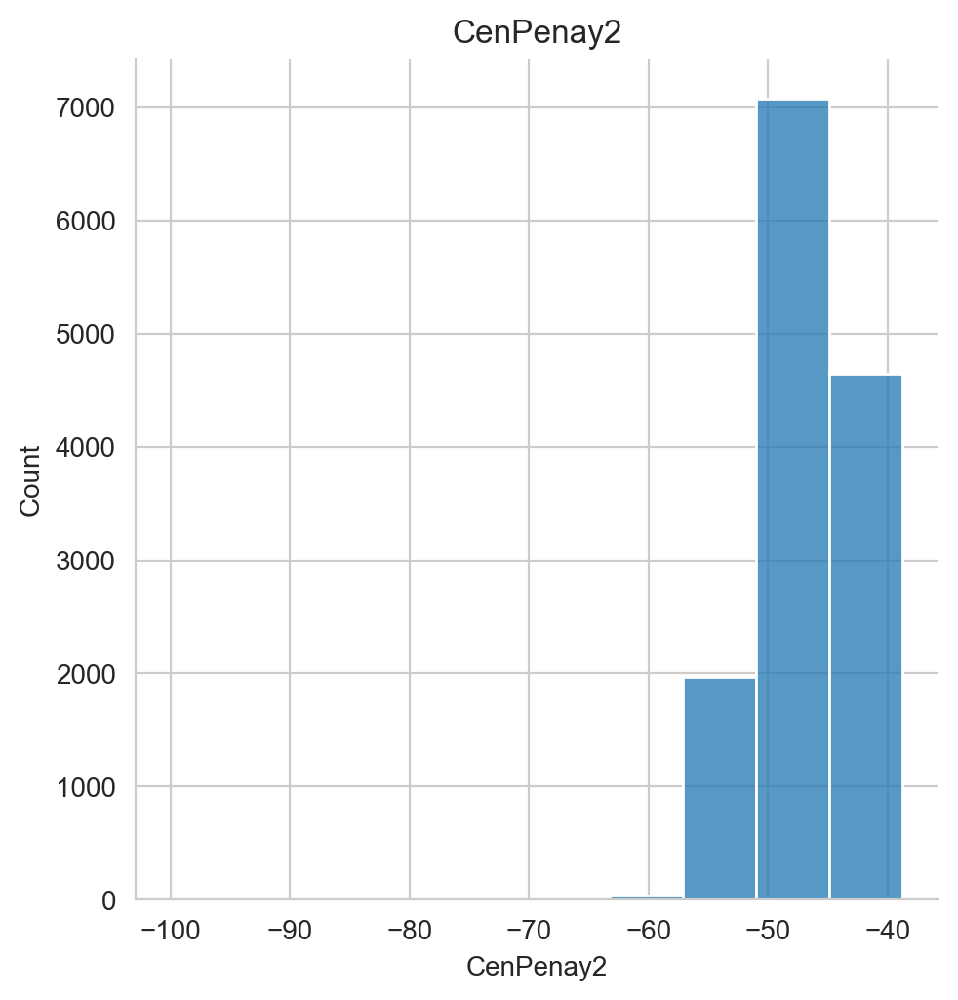

In [16]:
get_plot_dis(df=df2, n=2)

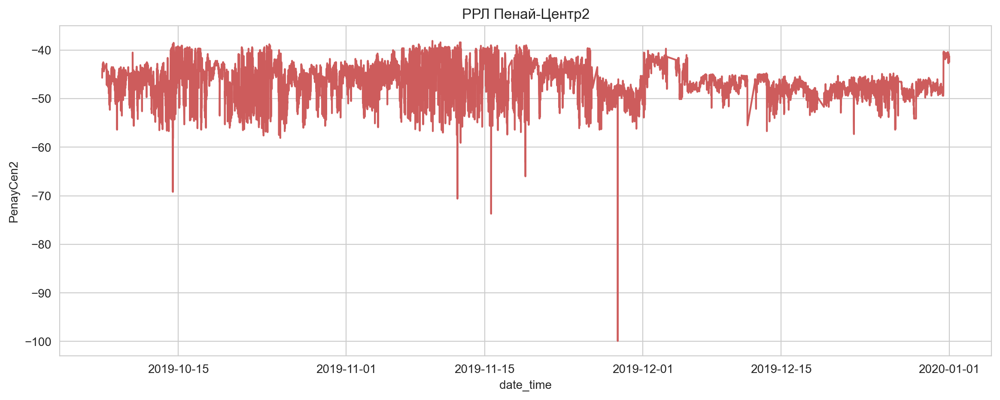

In [17]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "PenayCen2", data = df2 , legend = 'auto', color = 'indianred')\
                                                             .set(title='РРЛ Пенай-Центр2');
plt.show()


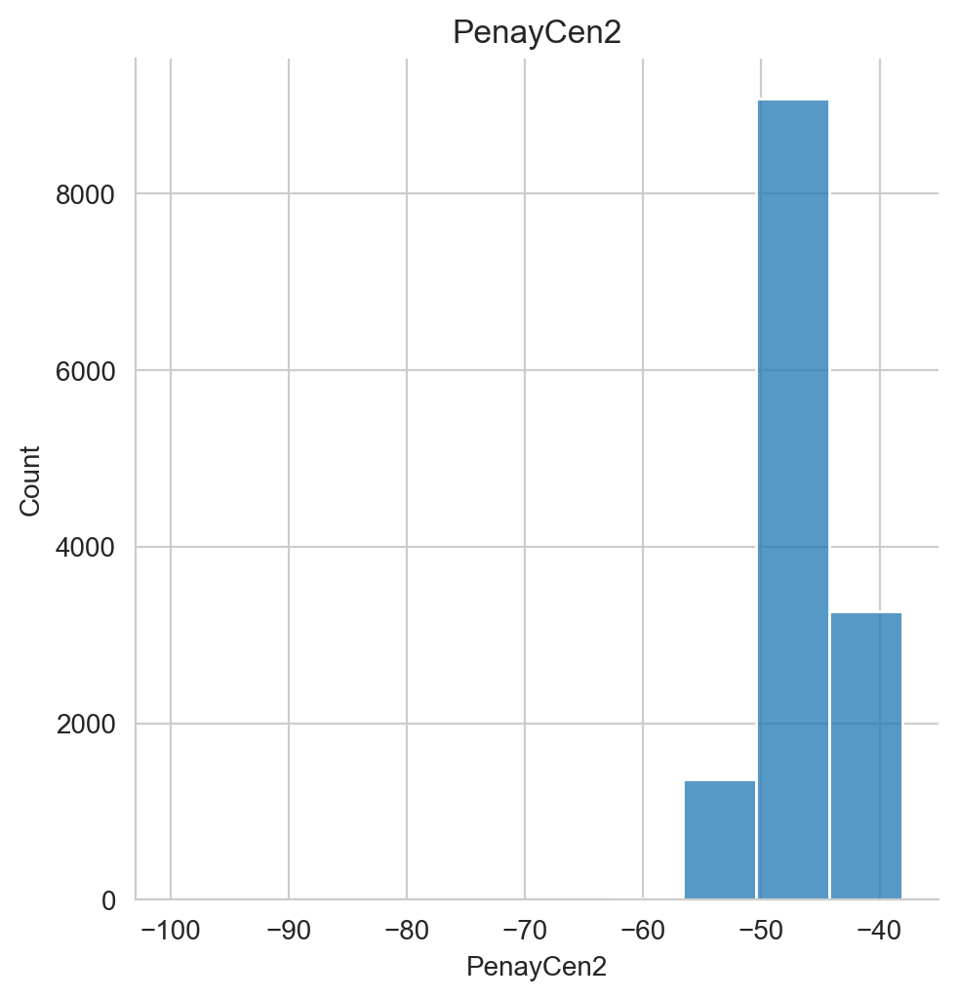

In [18]:
get_plot_dis(df=df2, n=3)

Критический уровень сигнала -58.0


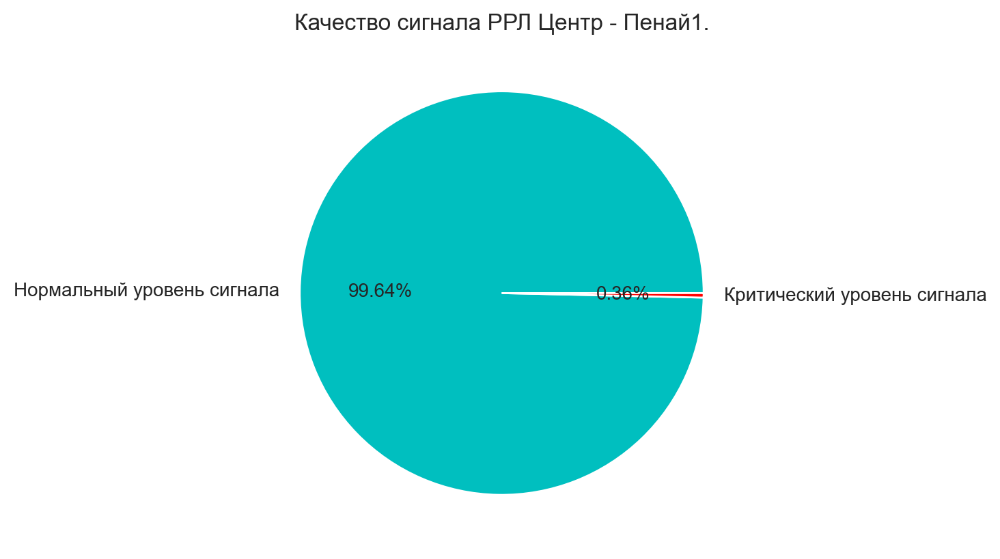

In [19]:
df2_1 = df2[df2['CenPenay1'] <= critical][['date_time','CenPenay1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df2)-len(df2_1)), len(df2_1)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','r'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Пенай1.');


Критический уровень сигнала -58.0


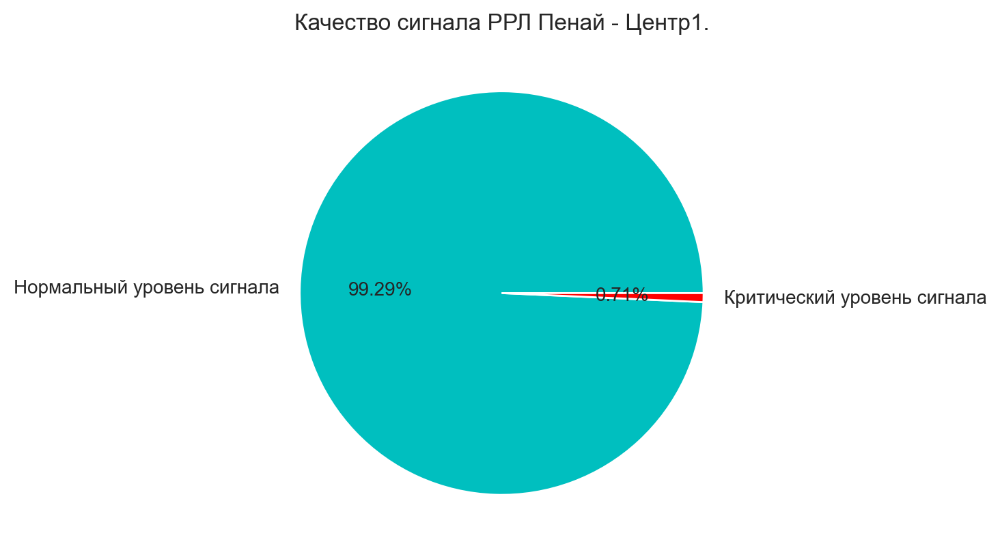

In [20]:
df2_2 = df2[df2['PenayCen1'] <= critical][['date_time','PenayCen1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df2)-len(df2_2)), len(df2_2)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','r'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Пенай - Центр1.');


Критический уровень сигнала -58.0


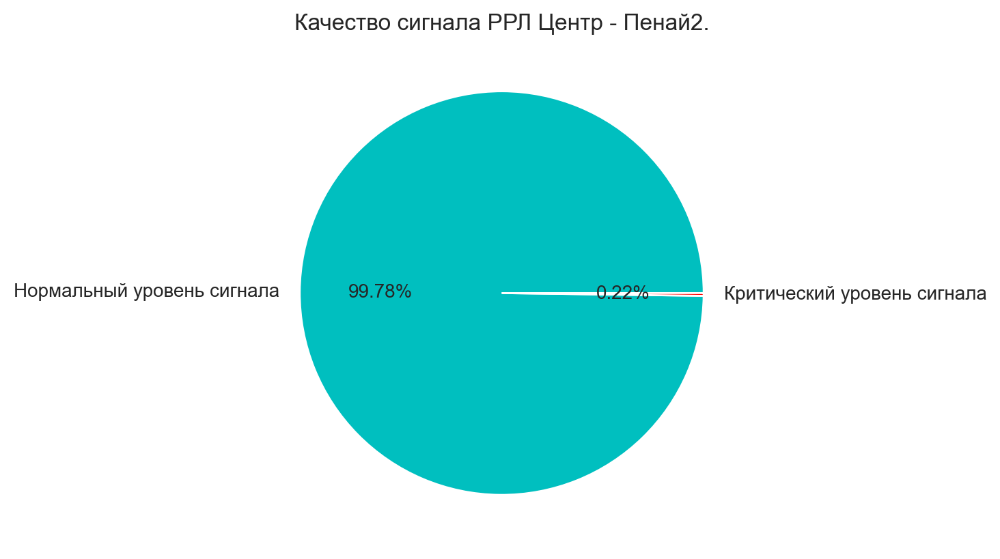

In [21]:
df2_3 = df2[df2['CenPenay2'] <= critical][['date_time','CenPenay2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df2)-len(df2_3)), len(df2_3)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','r'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Пенай2.');


Критический уровень сигнала -58.0


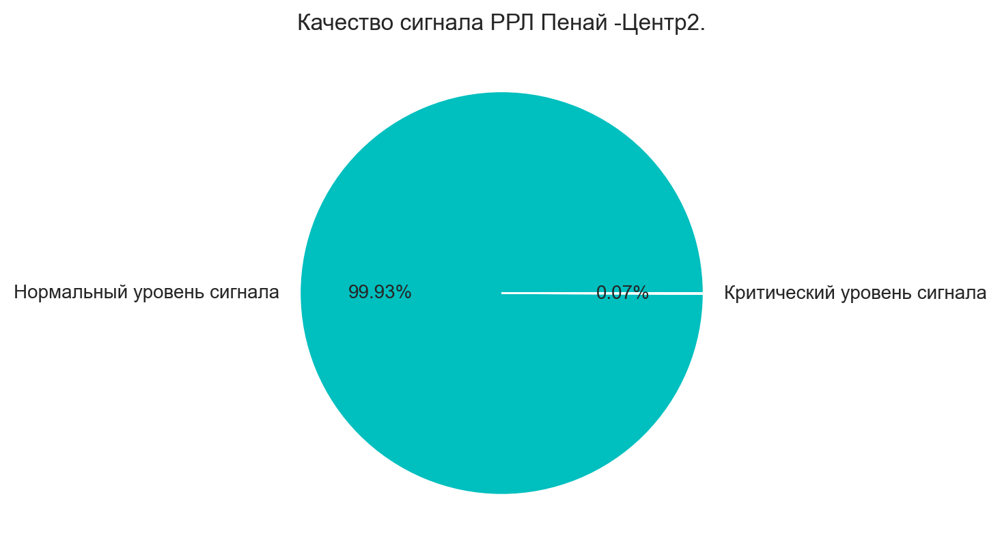

In [22]:
df2_4 = df2[df2['PenayCen2'] <= critical][['date_time','PenayCen2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df2)-len(df2_4)), len(df2_4)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','r'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Пенай -Центр2.');


## РРЛ Дооб 2019 год.

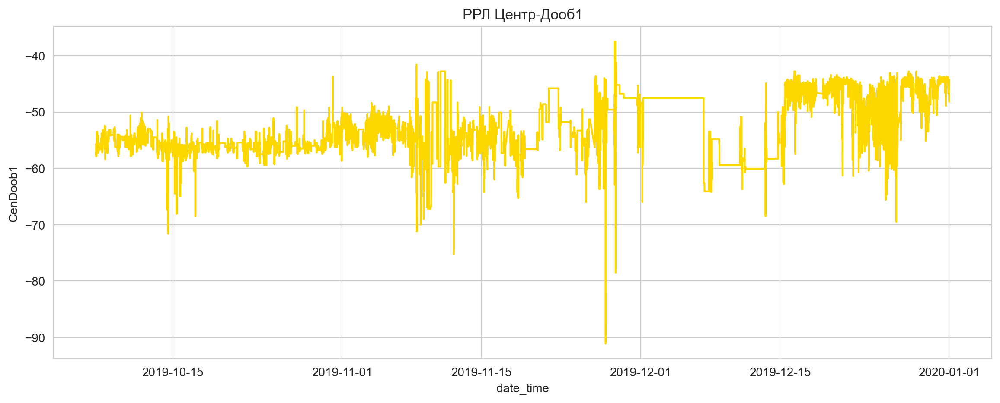

In [23]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenDoob1", data = df2 , legend = 'auto', color = 'gold')\
                                                   .set(title='РРЛ Центр-Дооб1');
plt.show()


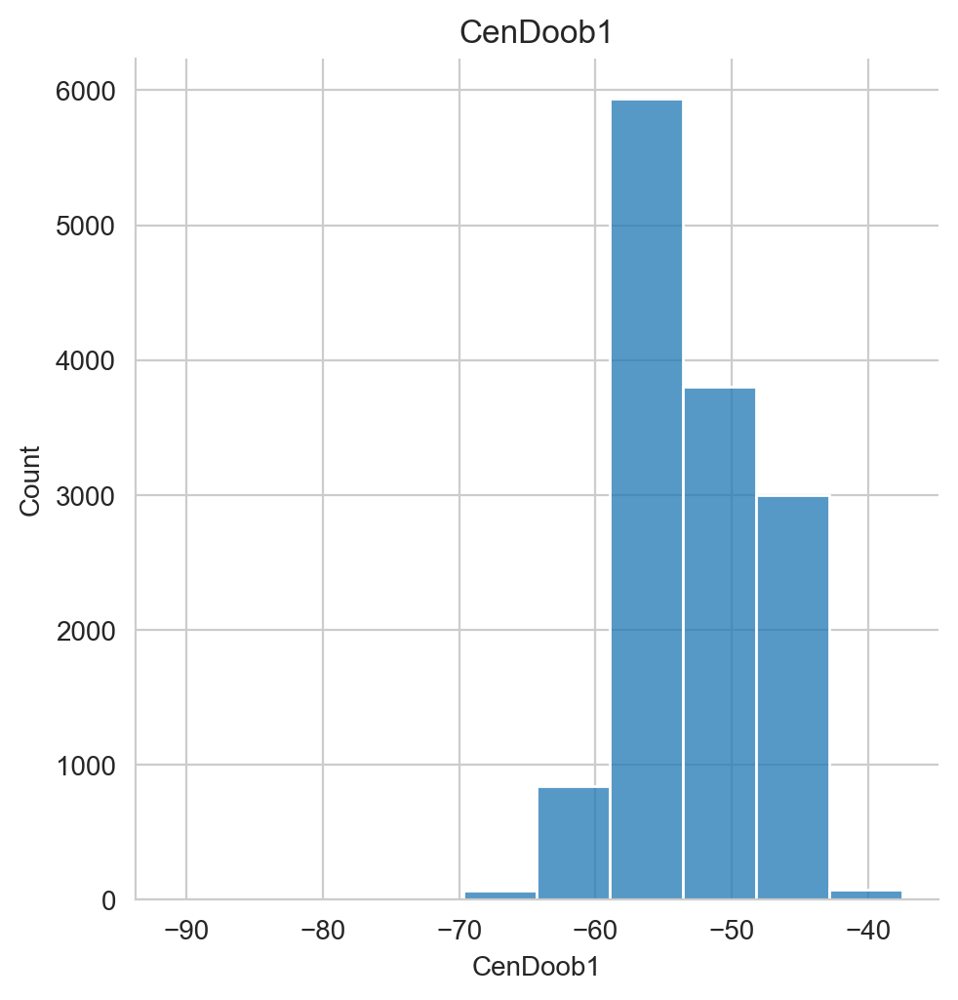

In [24]:
get_plot_dis(df=df2, n=4)

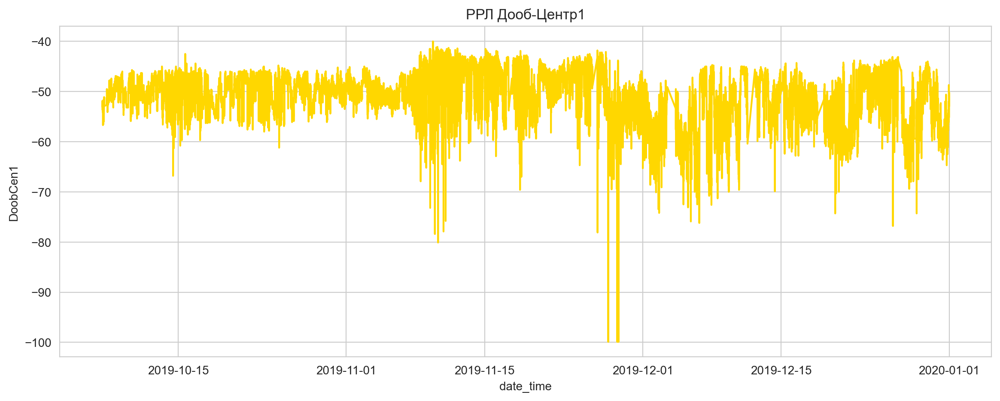

In [25]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "DoobCen1", data = df2 , legend = 'auto', color = 'gold')\
                                                   .set(title='РРЛ Дооб-Центр1');
plt.show()


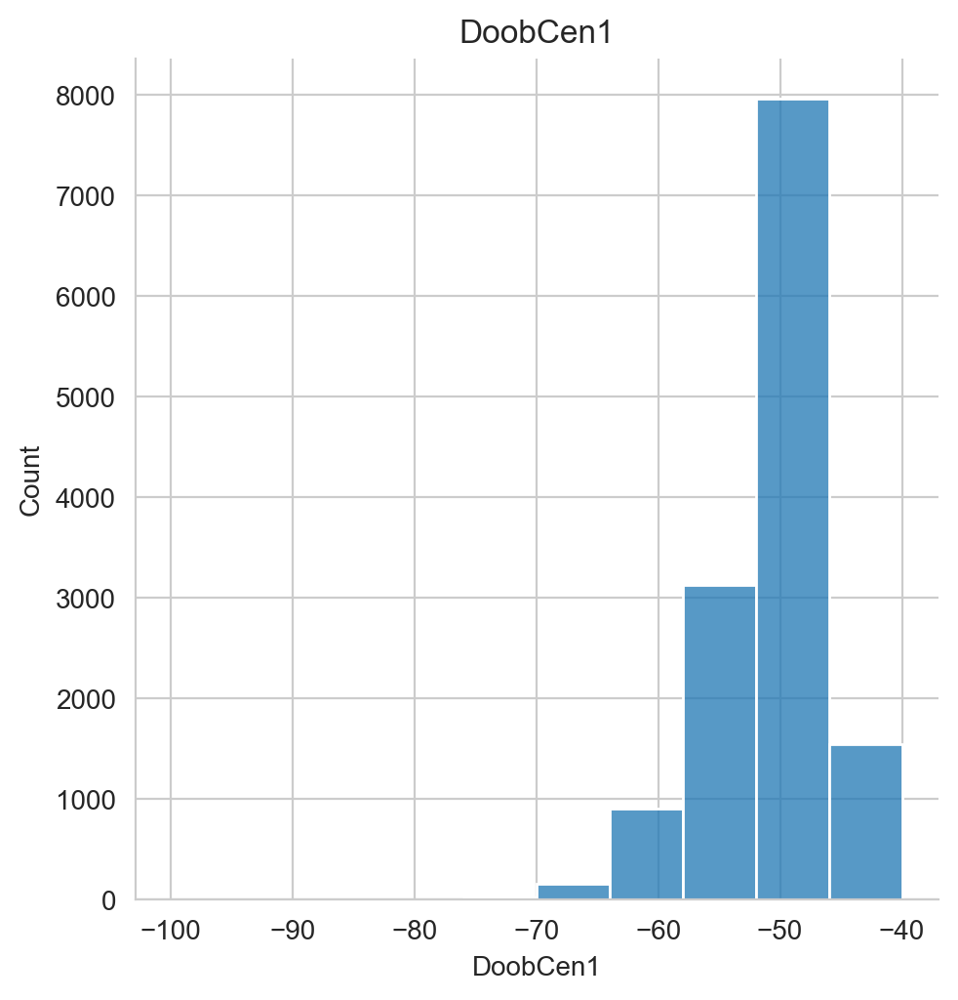

In [26]:
get_plot_dis(df=df2, n=5)

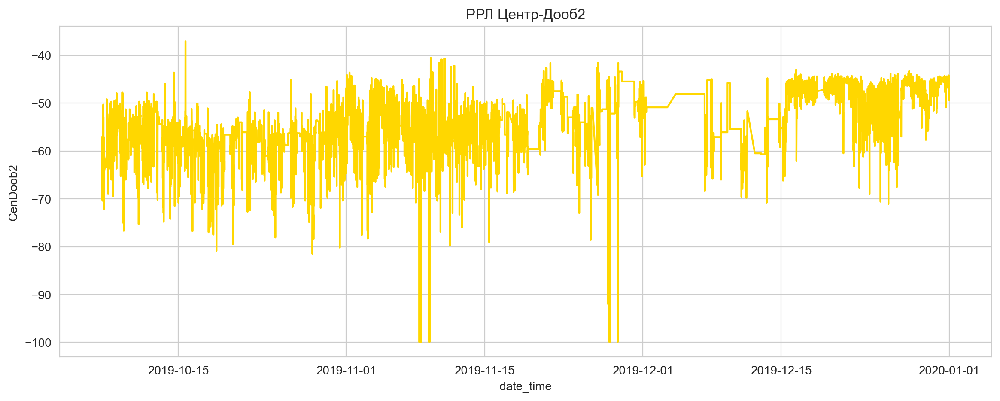

In [27]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenDoob2", data = df2 , legend = 'auto', color = 'gold')\
                                                              .set(title='РРЛ Центр-Дооб2');
plt.show()


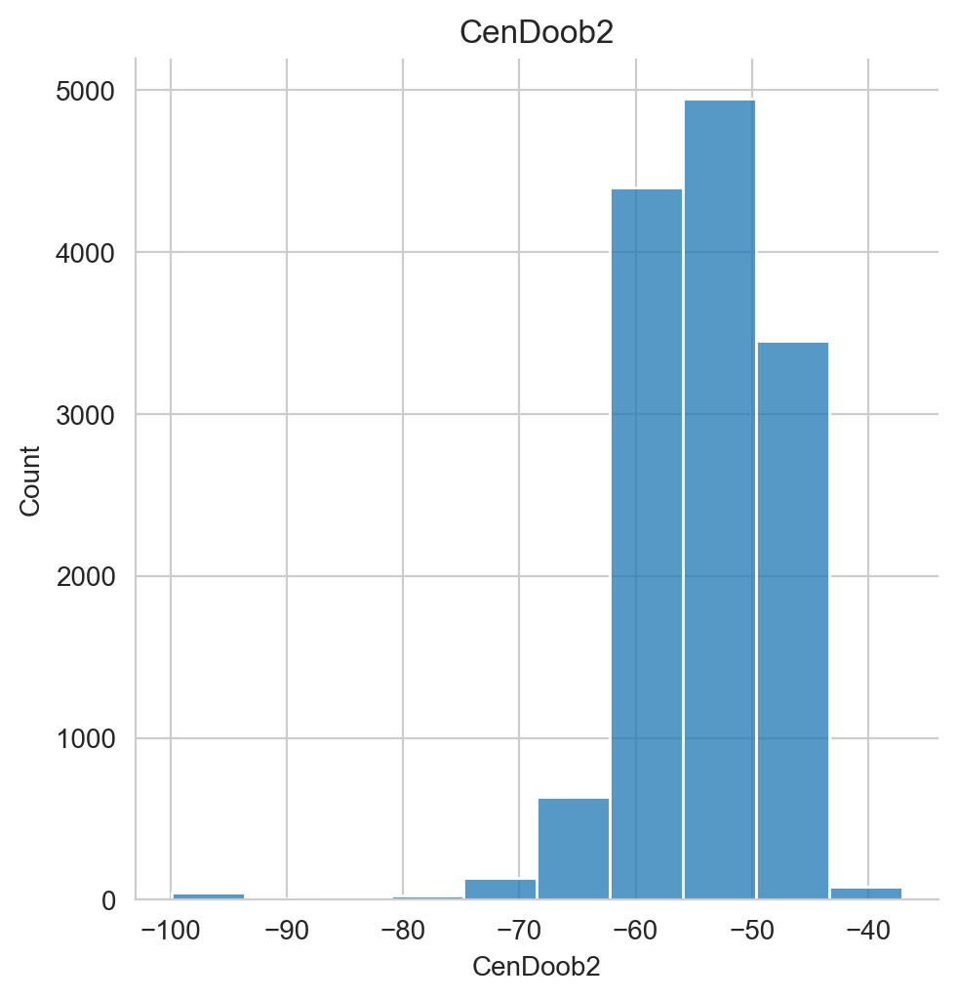

In [28]:
get_plot_dis(df=df2, n=6)

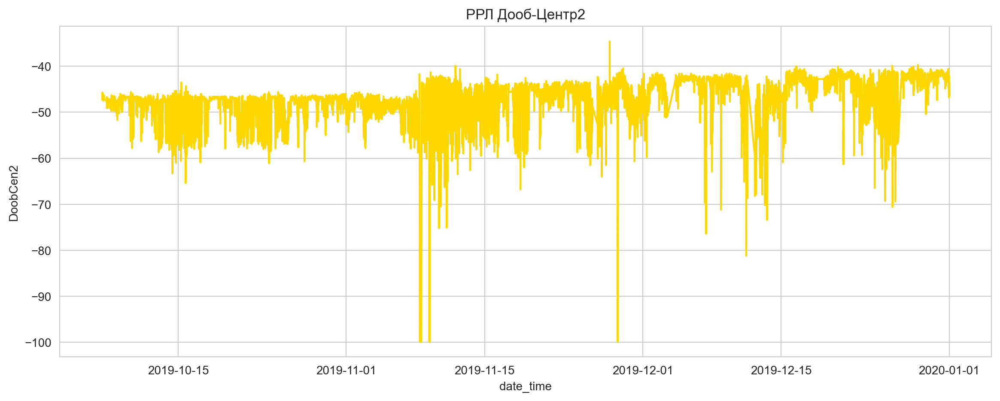

In [29]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "DoobCen2", data = df2 , legend = 'auto', color = 'gold')\
                                                              .set(title='РРЛ Дооб-Центр2');
plt.show()


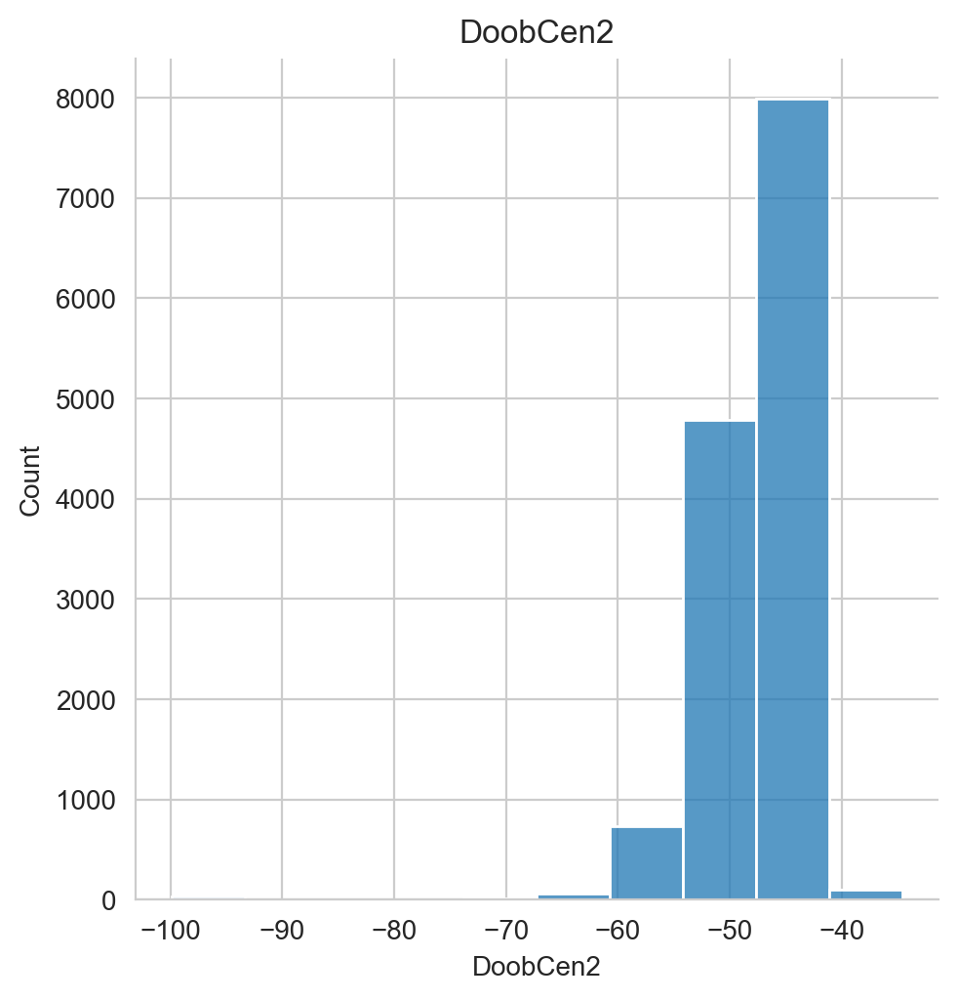

In [30]:
get_plot_dis(df=df2, n=7)

Критический уровень сигнала -58.0


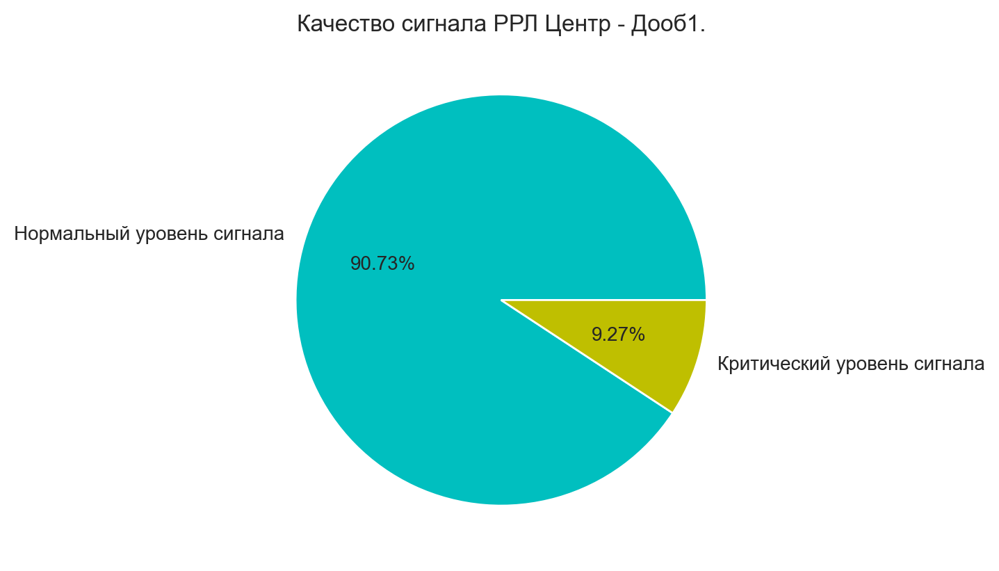

In [31]:
df2_5 = df2[df2['CenDoob1'] <= critical][['date_time','CenDoob1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df2)-len(df2_5)), len(df2_5)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Дооб1.');


Критический уровень сигнала -58.0


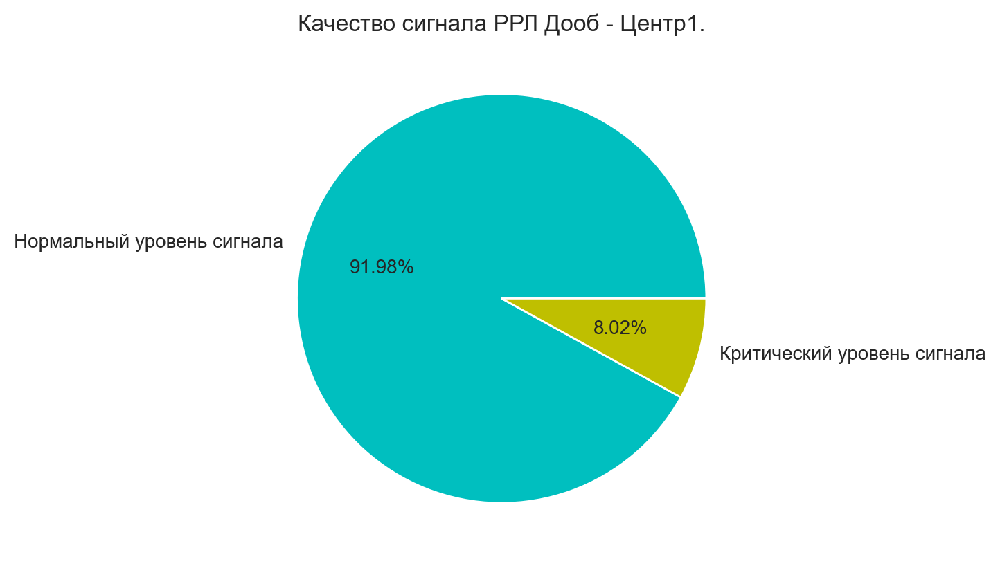

In [32]:
df2_6 = df2[df2['DoobCen1'] <= critical][['date_time','DoobCen1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df2)-len(df2_6)), len(df2_6)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Дооб - Центр1.');


Критический уровень сигнала -58.0


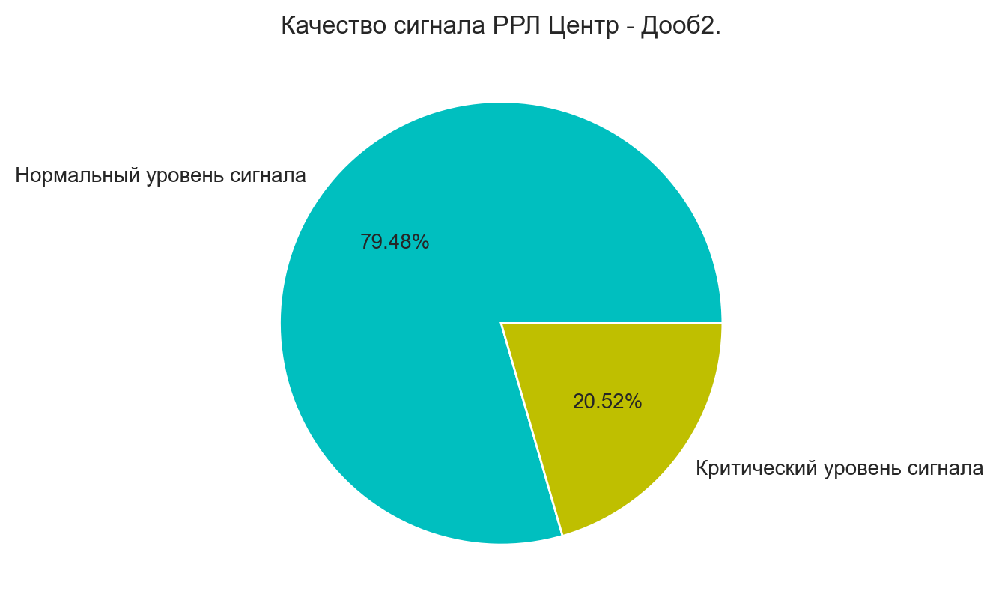

In [33]:
df2_7 = df2[df2['CenDoob2'] <= critical][['date_time','CenDoob2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df2)-len(df2_7)), len(df2_7)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Дооб2.');


Критический уровень сигнала -58.0


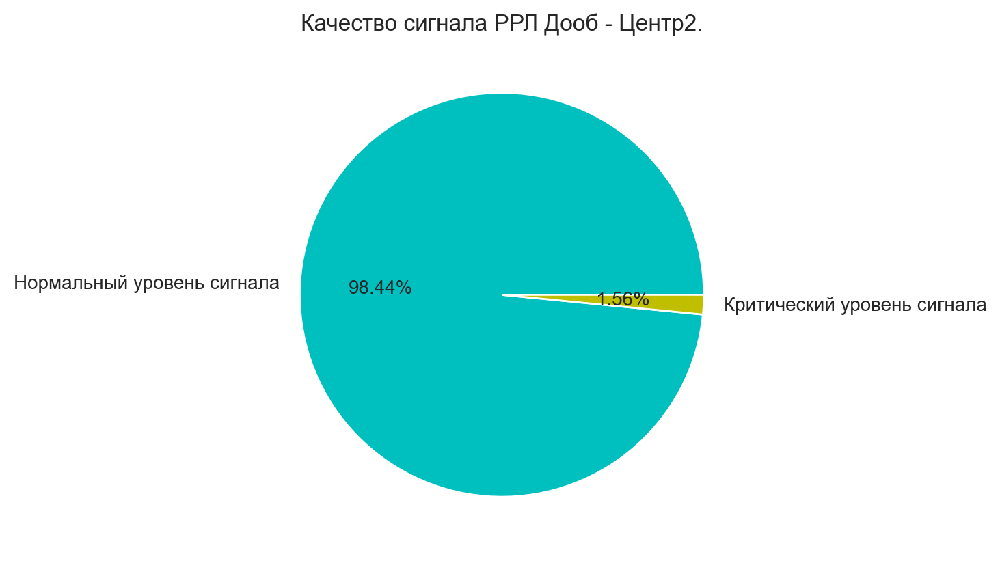

In [34]:
df2_8 = df2[df2['DoobCen2'] <= critical][['date_time','DoobCen2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df2)-len(df2_8)), len(df2_8)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Дооб - Центр2.');


### 2020 год.

In [35]:
df3 = df1[df1['year'] == 2020][['date_time', 'CenDoob1','CenDoob2',
                                                                 'DoobCen1', 'DoobCen2',
                                                                 'CenPenay1', 'CenPenay2',
                                                                 'PenayCen1', 'PenayCen2', 'month']]
df3


,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2,month
13735,2020-01-01 00:05:00,-47.3,-48.1,-48.4,-43.1,-46.0,-44.7,-38.8,-40.7,1
13736,2020-01-01 00:15:00,-46.7,-46.7,-49.5,-45.3,-46.3,-45.5,-39.1,-42.0,1
13737,2020-01-01 00:25:00,-47.3,-47.5,-56.6,-43.8,-46.6,-44.7,-39.3,-42.2,1
13738,2020-01-01 00:35:00,-48.3,-50.4,-50.5,-43.6,-46.4,-45.9,-37.9,-41.3,1
13739,2020-01-01 00:45:00,-46.4,-46.7,-50.4,-46.4,-47.1,-45.6,-39.1,-41.6,1
...,...,...,...,...,...,...,...,...,...,...
62577,2020-12-31 23:17:00,-47.0,-42.5,-51.9,-46.9,-47.9,-38.9,-48.5,-48.8,12
62578,2020-12-31 23:27:00,-43.8,-44.5,-44.1,-56.3,-45.5,-43.2,-51.1,-53.4,12
62579,2020-12-31 23:37:00,-45.7,-51.1,-44.4,-49.0,-42.5,-44.7,-51.7,-53.4,12
62580,2020-12-31 23:47:00,-44.1,-44.5,-44.7,-55.8,-44.6,-40.6,-58.3,-54.1,12


In [36]:
df3.to_csv('MiniLink_out_2020_1.csv', index=False) # за 2020 год


In [37]:
pd.set_option("display.precision", 1)
np.set_printoptions(precision=1)
df3.agg([np.mean, np.median, np.min, np.max])


,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2,month
mean,2020-07-08 15:42:36.815362304,-48.7,-47.6,-51.2,-46.1,-47.2,-46.3,-43.9,-45.7,6.7
median,2020-07-12 00:40:00.000000000,-47.9,-46.3,-50.9,-45.3,-46.0,-45.6,-43.2,-45.2,7.0
amin,2020-01-01 00:05:00.000000000,-76.8,-99.9,-99.9,-79.0,-92.0,-90.8,-72.2,-65.3,1.0
amax,2020-12-31 23:57:00.000000000,-37.8,-38.5,-38.8,-36.0,-40.3,-35.9,-35.9,-37.8,12.0


## РРЛ Пенай 2020 год.

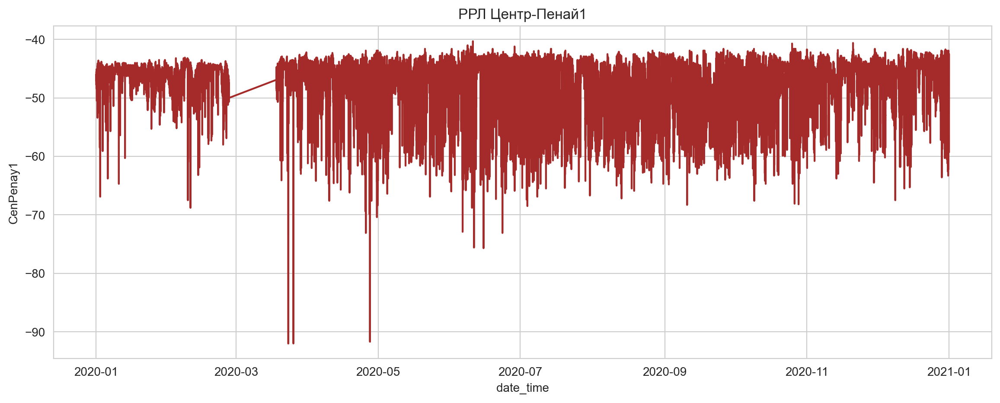

In [38]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenPenay1", data = df3 , legend = 'auto', color = 'brown')\
                                                                  .set(title='РРЛ Центр-Пенай1');
plt.show()


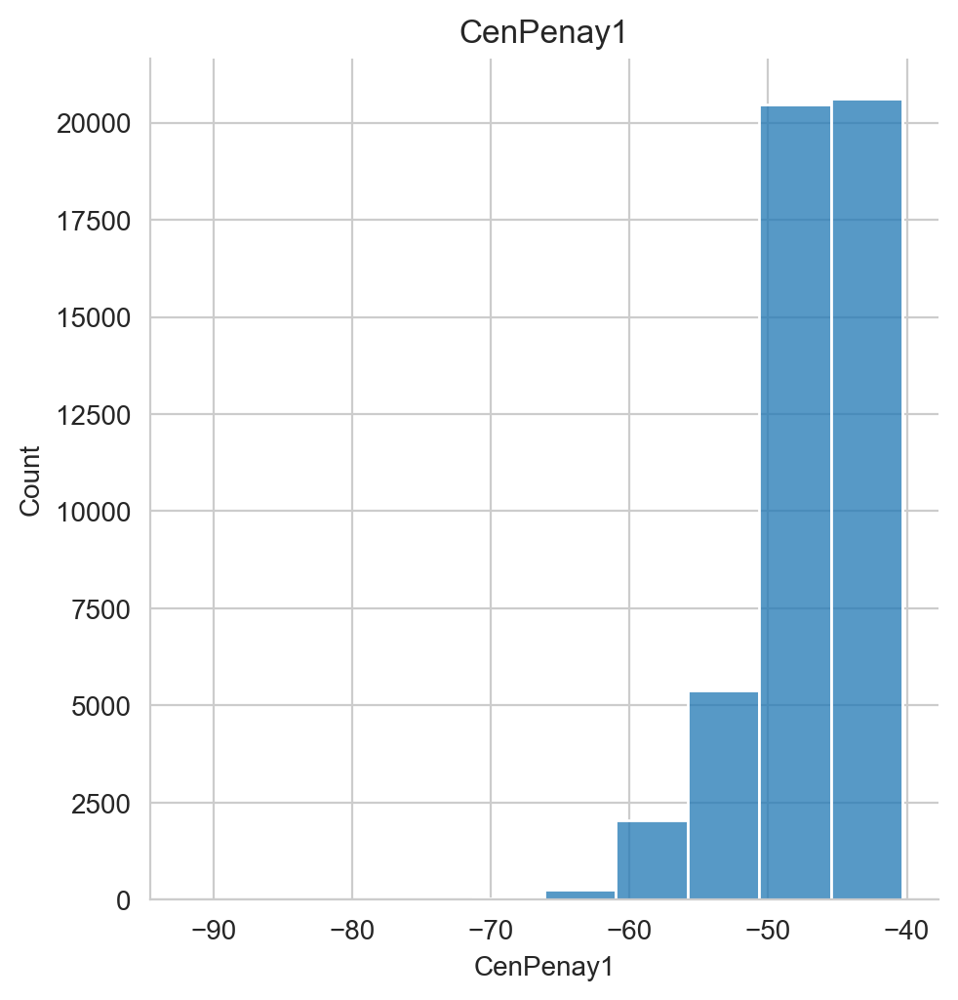

In [39]:
get_plot_dis(df=df3, n=0)

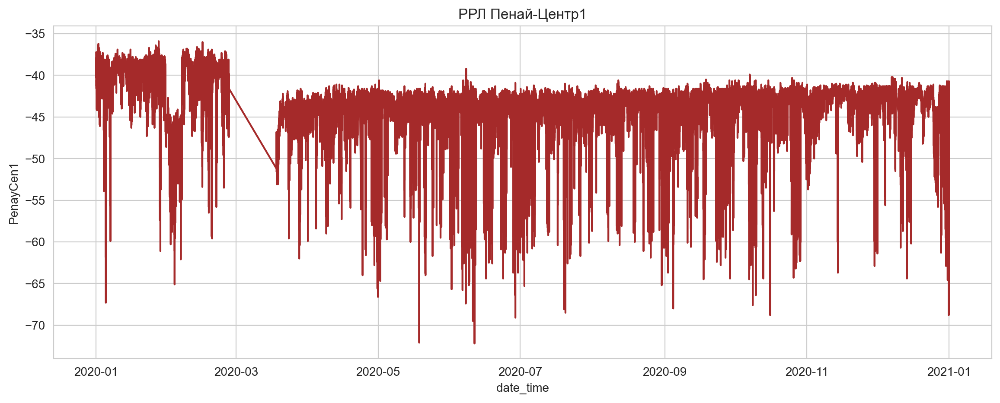

In [40]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "PenayCen1", data = df3 , legend = 'auto', color = 'brown')\
                                                             .set(title='РРЛ Пенай-Центр1');
plt.show()


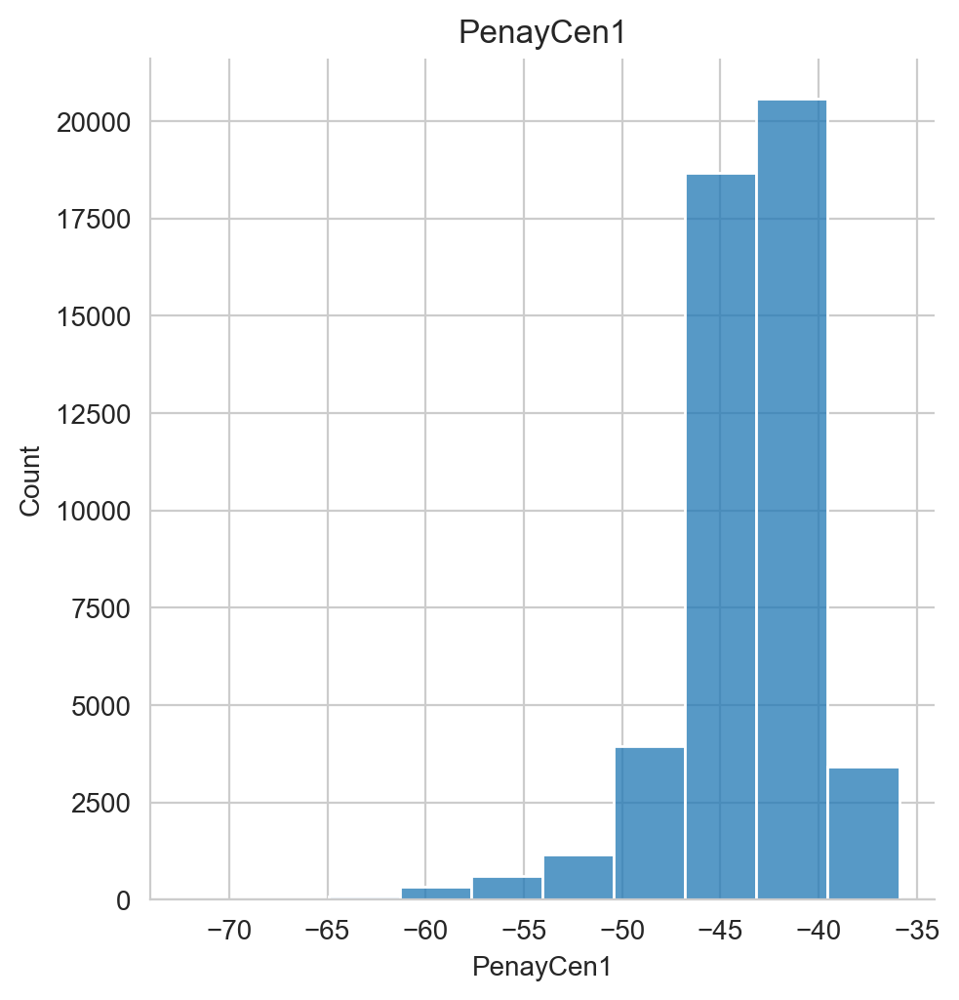

In [41]:
get_plot_dis(df=df3, n=1)

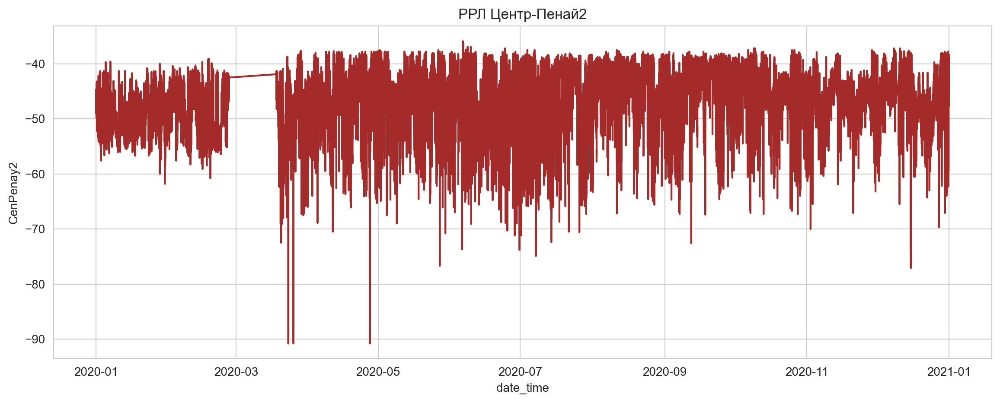

In [42]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenPenay2", data = df3 , legend = 'auto', color = 'brown')\
                                                                .set(title='РРЛ Центр-Пенай2');
plt.show()


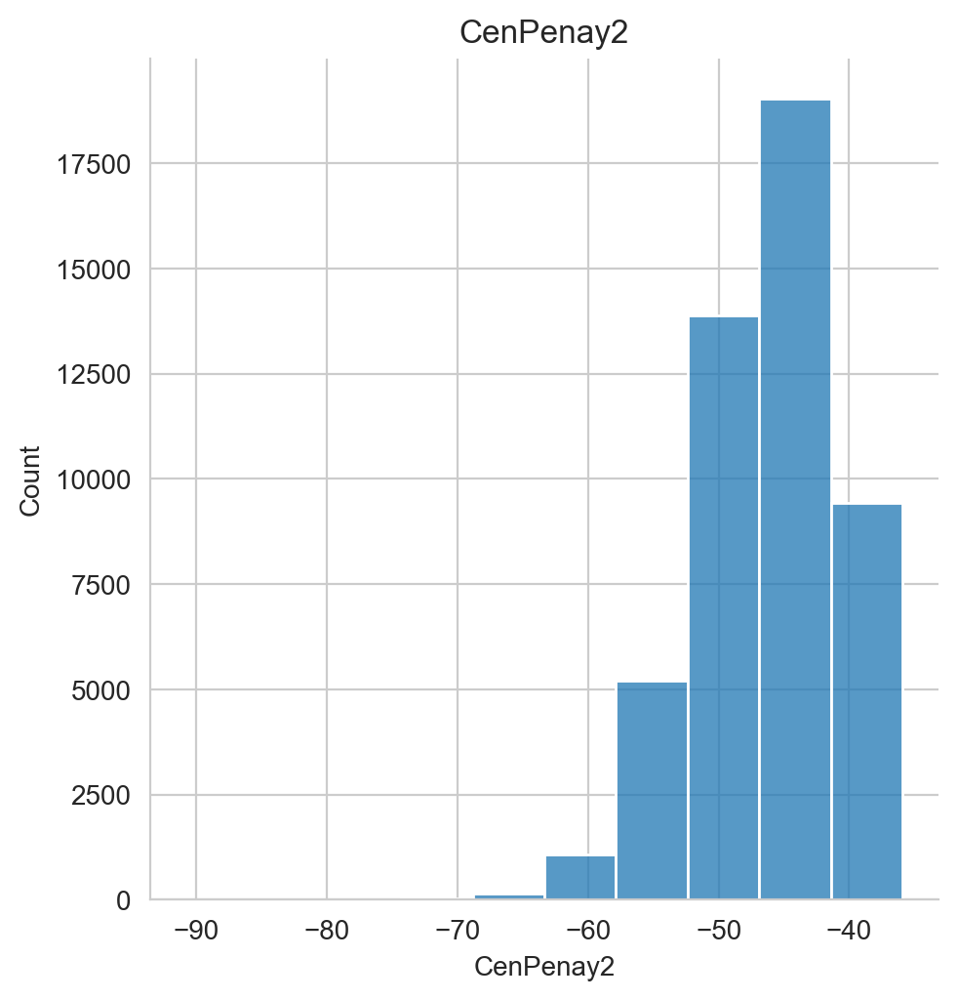

In [43]:
get_plot_dis(df=df3, n=2)

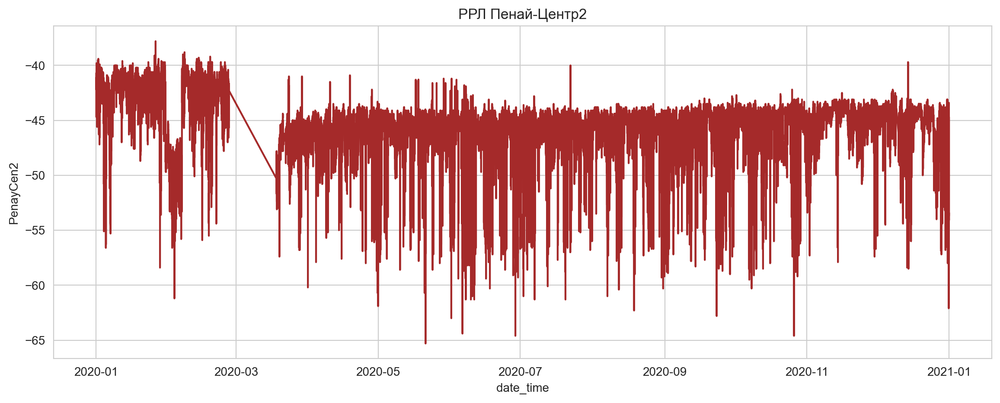

In [44]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "PenayCen2", data = df3 , legend = 'auto', color = 'brown')\
                                                             .set(title='РРЛ Пенай-Центр2');
plt.show()


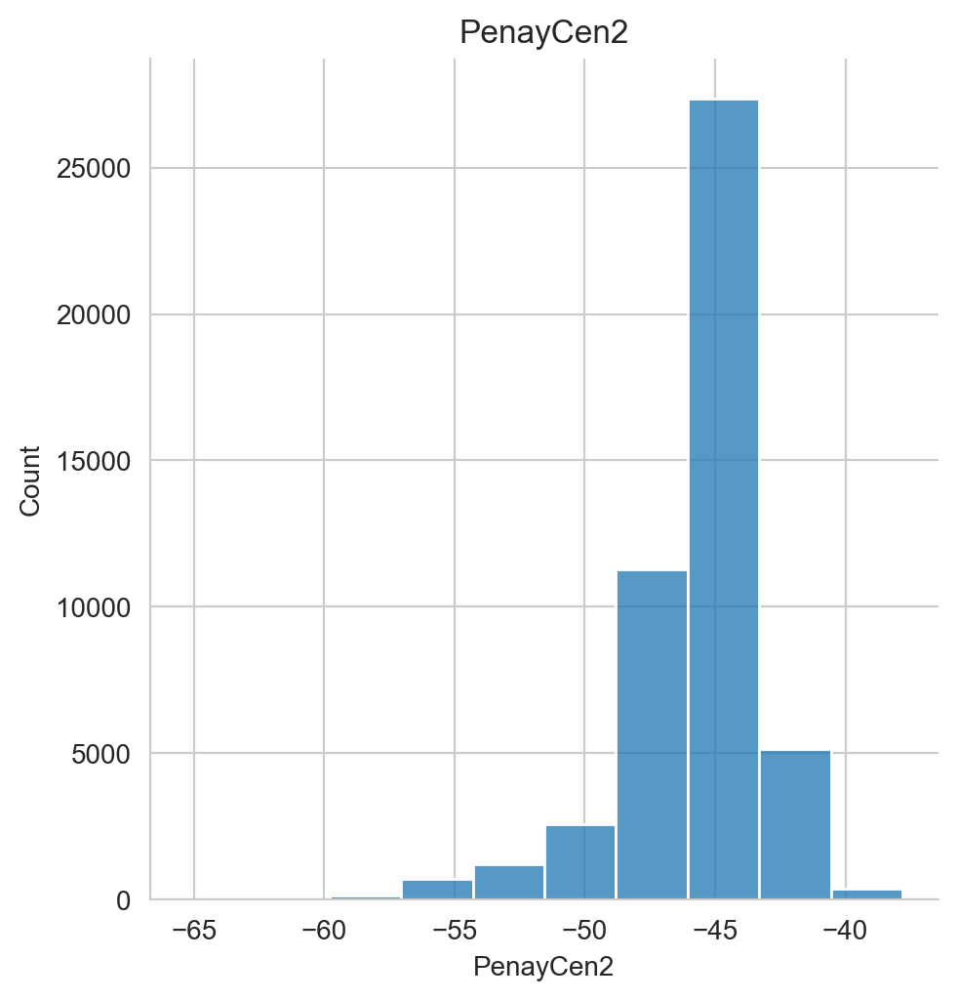

In [45]:
get_plot_dis(df=df3, n=3)

Критический уровень сигнала -58.0


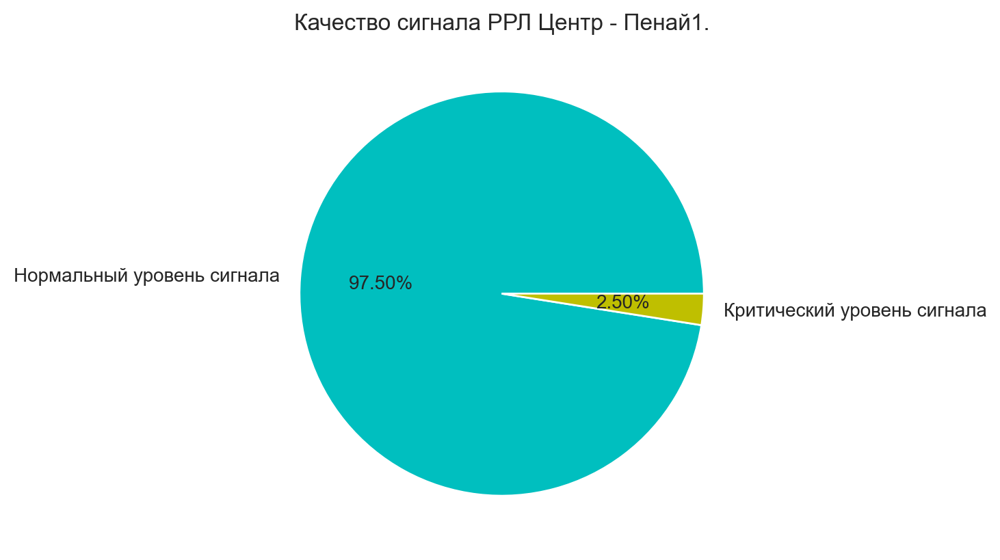

In [46]:
df3_1 = df3[df3['CenPenay1'] <= critical][['date_time','CenPenay1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df3)-len(df3_1)), len(df3_1)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Пенай1.');


Критический уровень сигнала -58.0


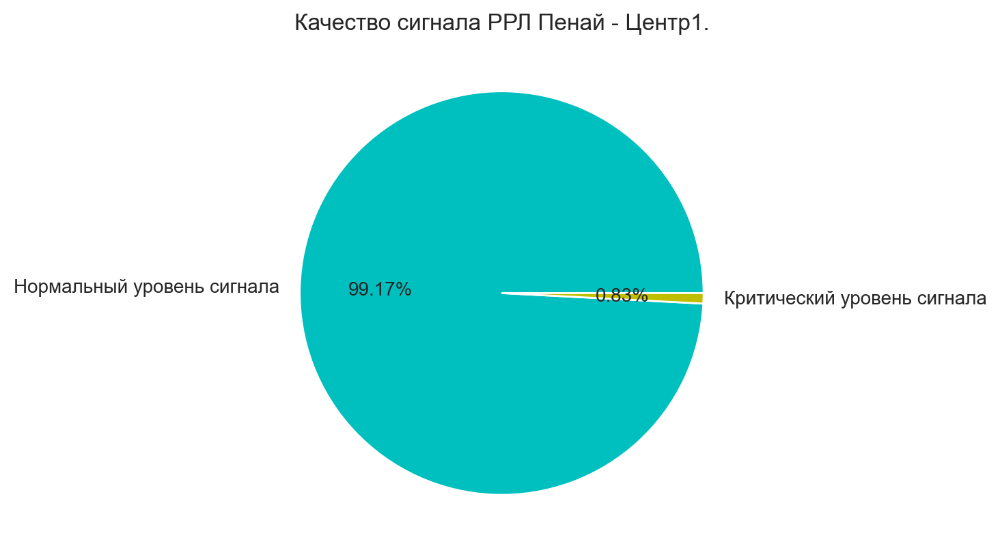

In [47]:
df3_2 = df3[df3['PenayCen1'] <= critical][['date_time','PenayCen1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df3)-len(df3_2)), len(df3_2)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Пенай - Центр1.');


Критический уровень сигнала -58.0


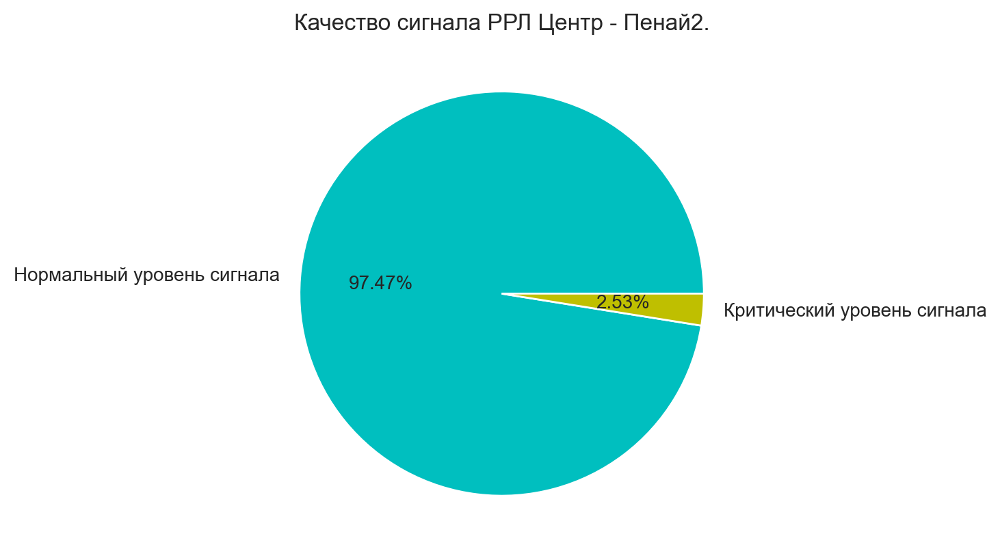

In [48]:
df3_3 = df3[df3['CenPenay2'] <= critical][['date_time','CenPenay2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df3)-len(df3_3)), len(df3_3)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Пенай2.');


Критический уровень сигнала -58.0


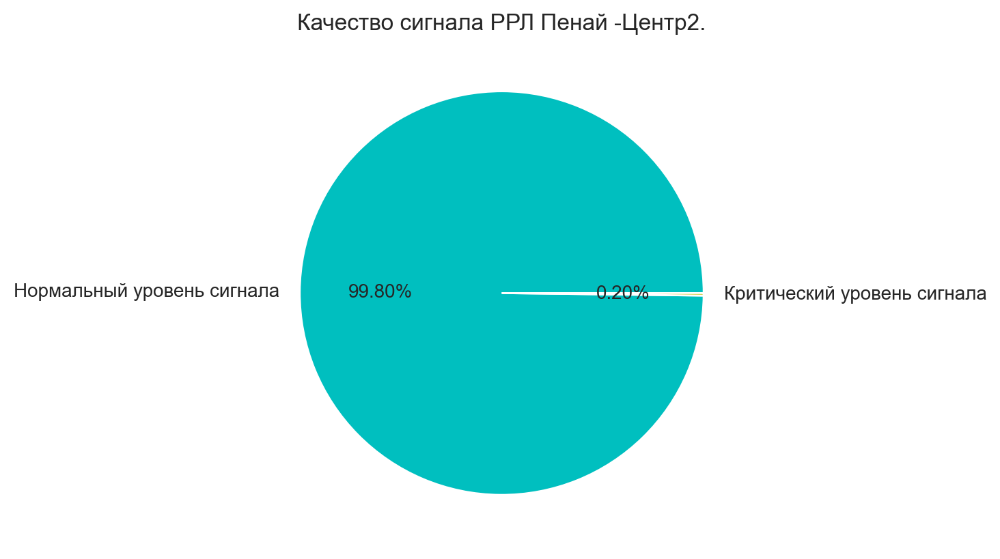

In [49]:
df3_4 = df3[df3['PenayCen2'] <= critical][['date_time','PenayCen2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df3)-len(df3_4)), len(df3_4)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Пенай -Центр2.');


## РРЛ Дооб 2020 год.

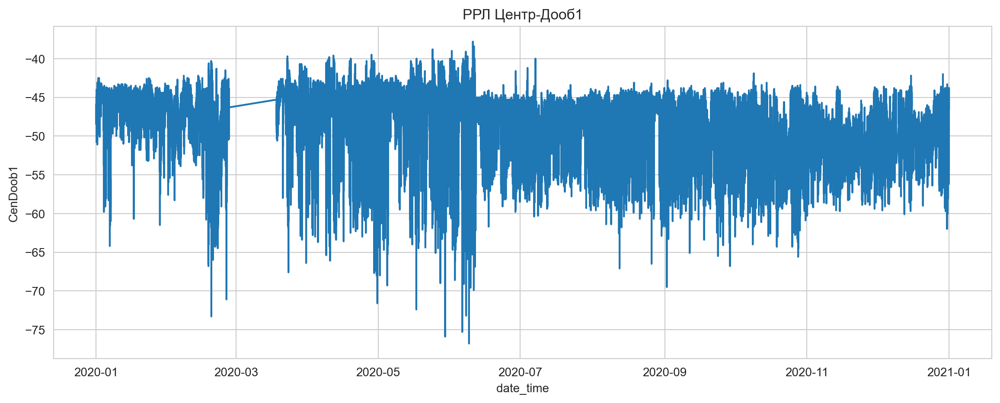

In [50]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenDoob1", data = df3 , legend = 'auto')\
                                                   .set(title='РРЛ Центр-Дооб1');
plt.show()


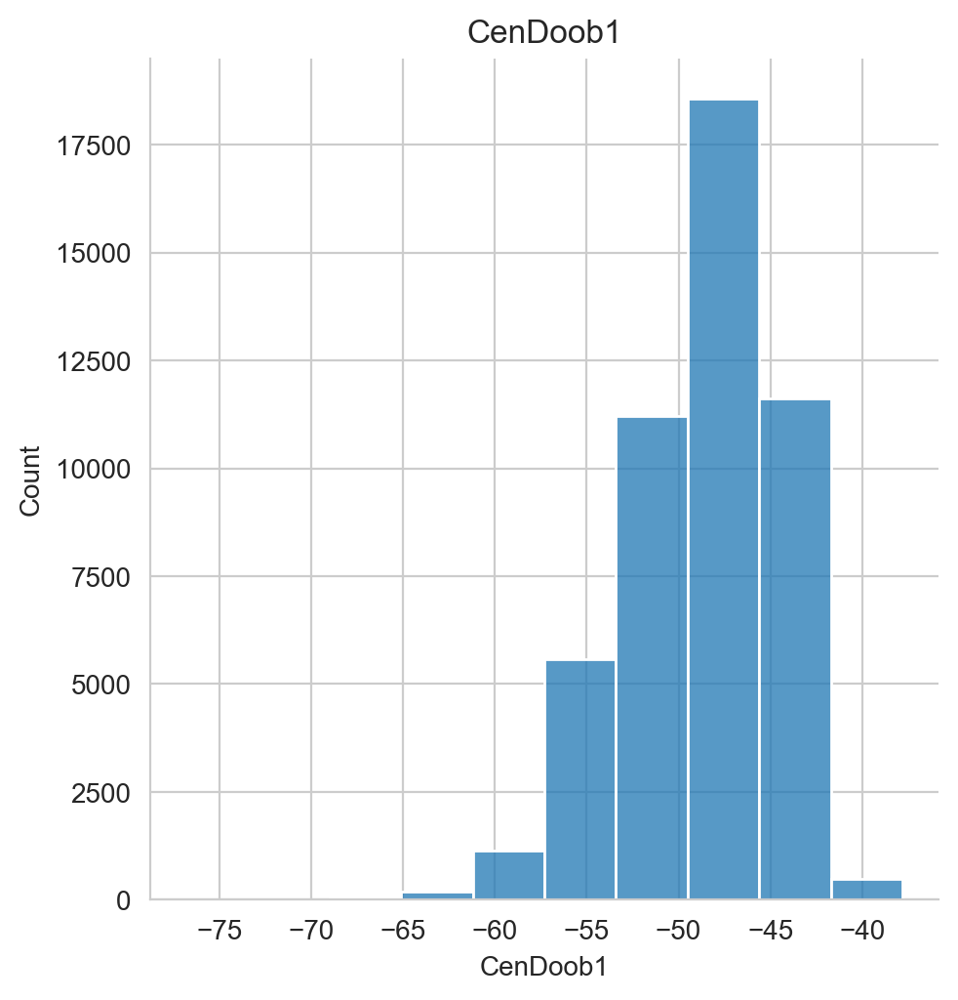

In [51]:
get_plot_dis(df=df3, n=4)

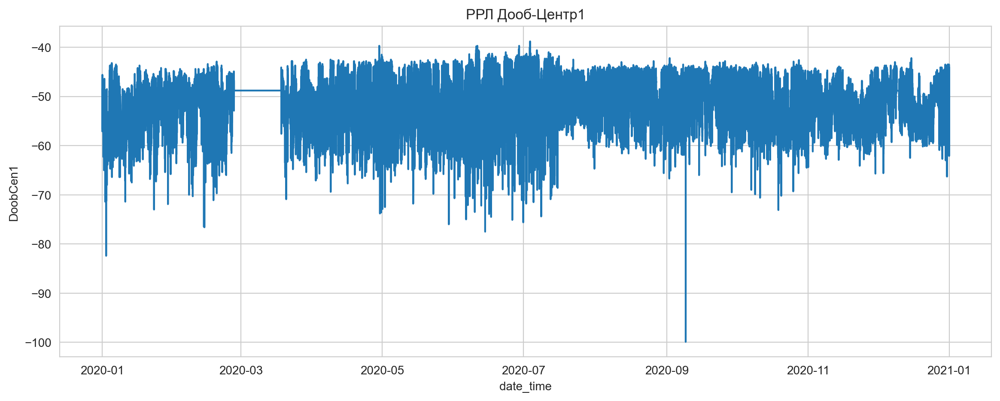

In [52]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "DoobCen1", data = df3 , legend = 'auto')\
                                                   .set(title='РРЛ Дооб-Центр1');
plt.show()


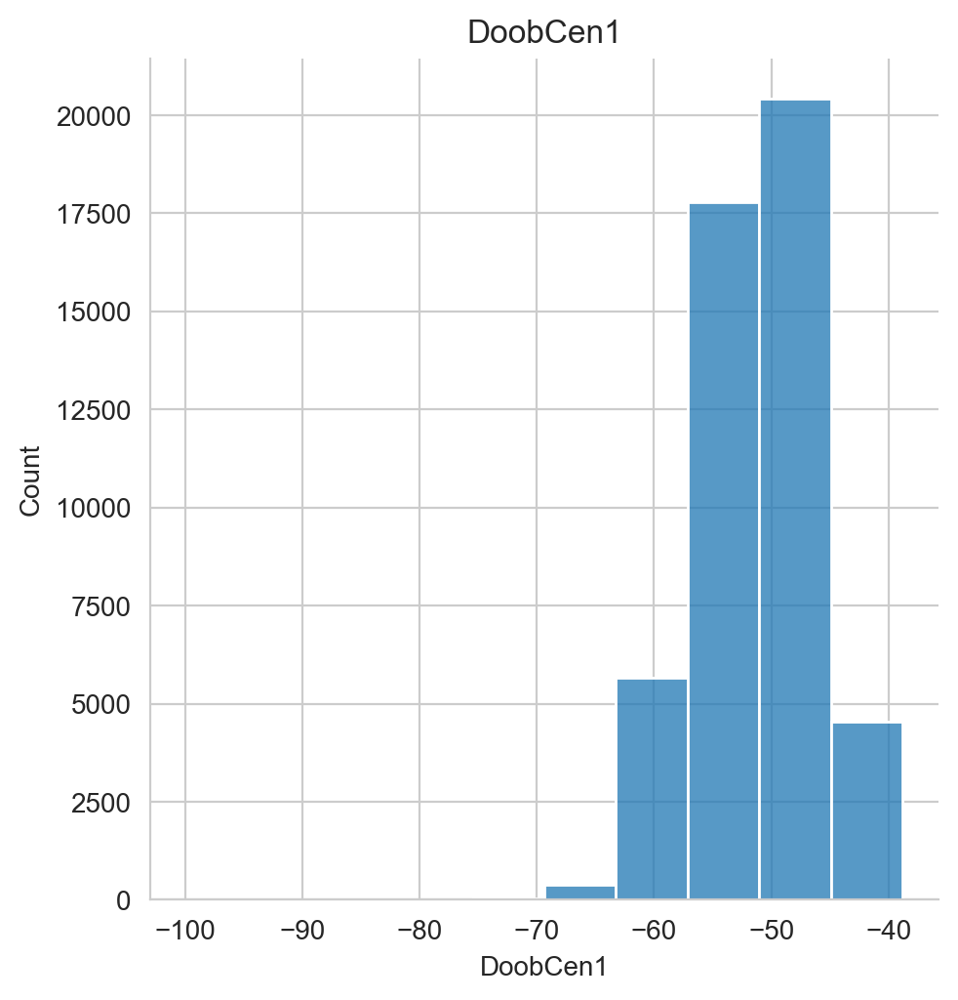

In [53]:
get_plot_dis(df=df3, n=5)

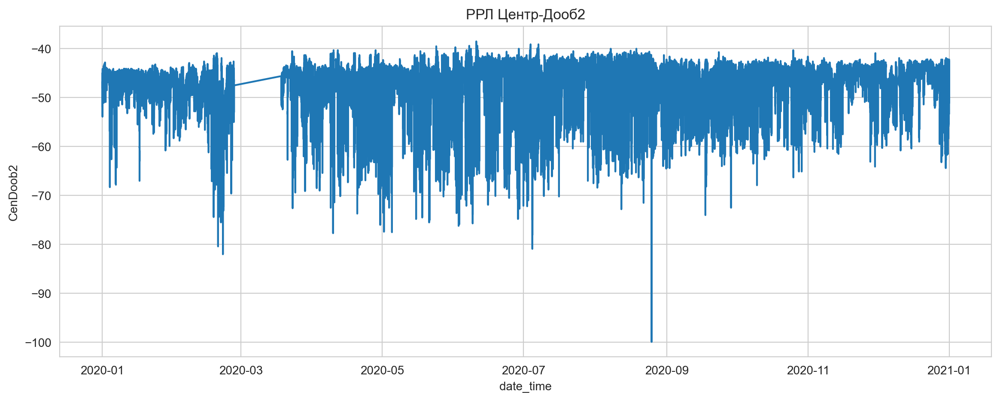

In [54]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenDoob2", data = df3 , legend = 'auto')\
                                                              .set(title='РРЛ Центр-Дооб2');
plt.show()


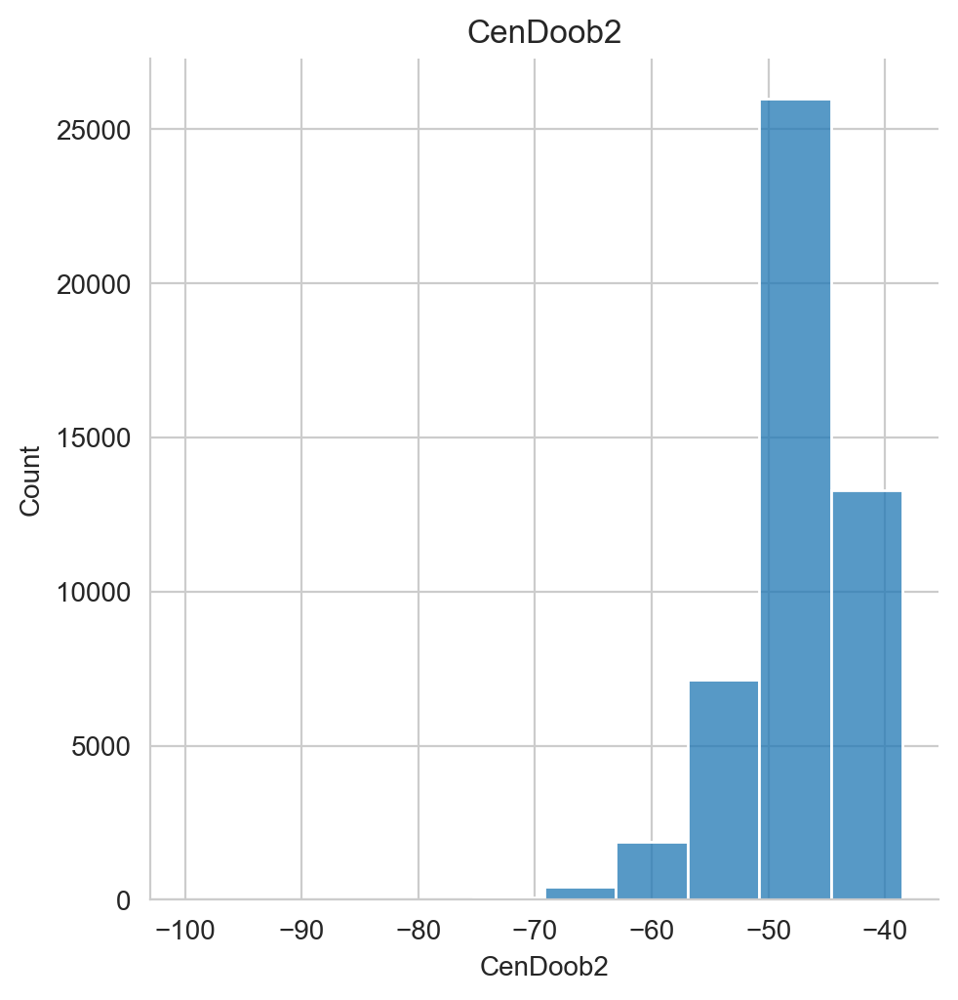

In [55]:
get_plot_dis(df=df3, n=6)

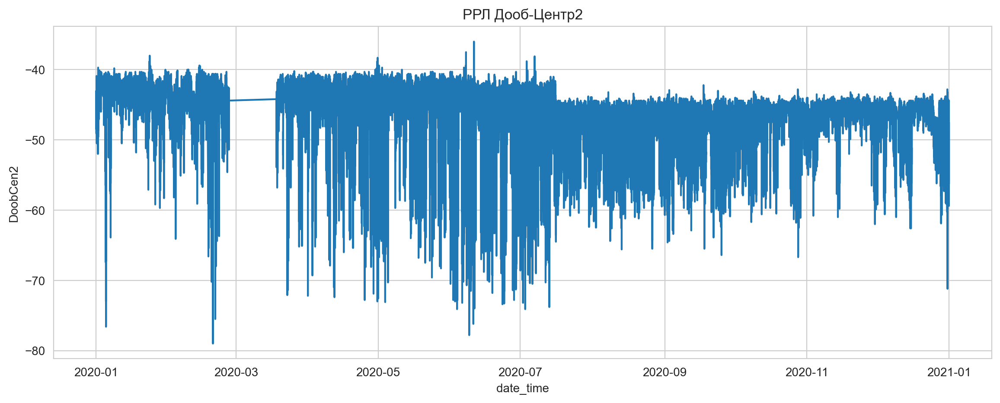

In [56]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "DoobCen2", data = df3 , legend = 'auto')\
                                                              .set(title='РРЛ Дооб-Центр2');
plt.show()


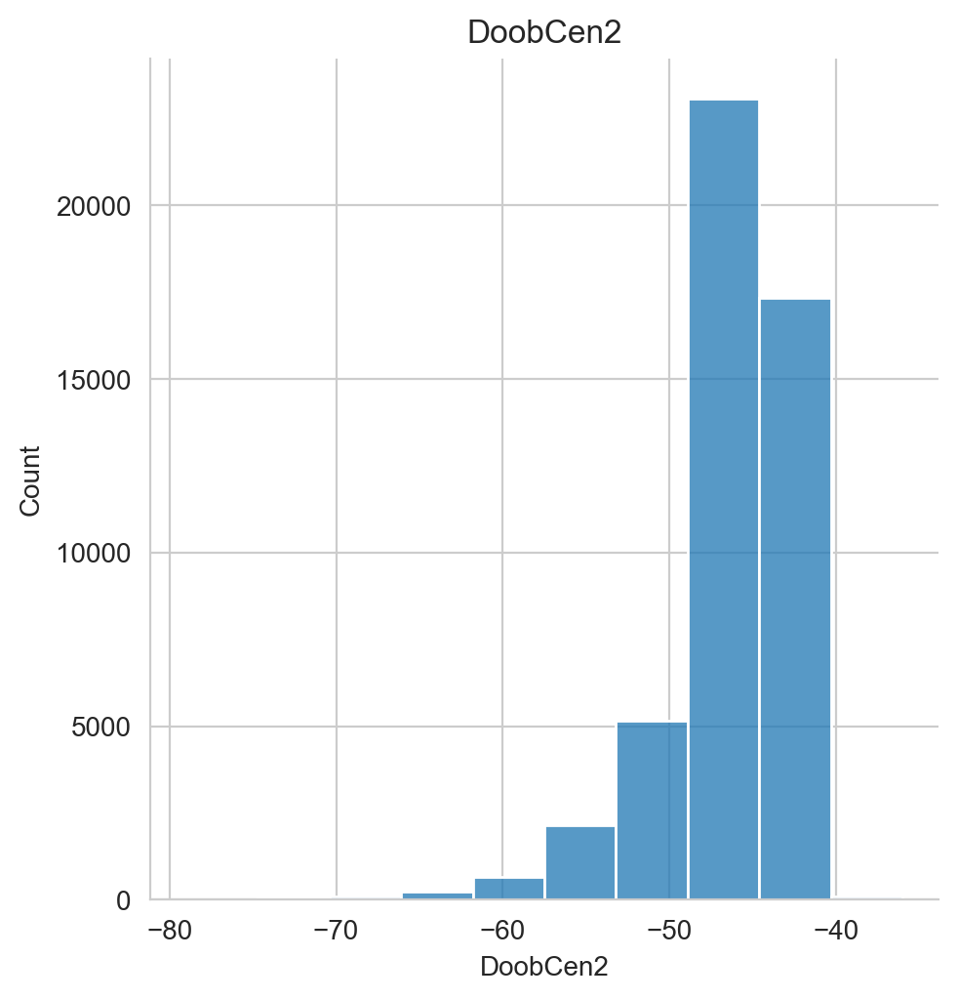

In [57]:
get_plot_dis(df=df3, n=7)

Критический уровень сигнала -58.0


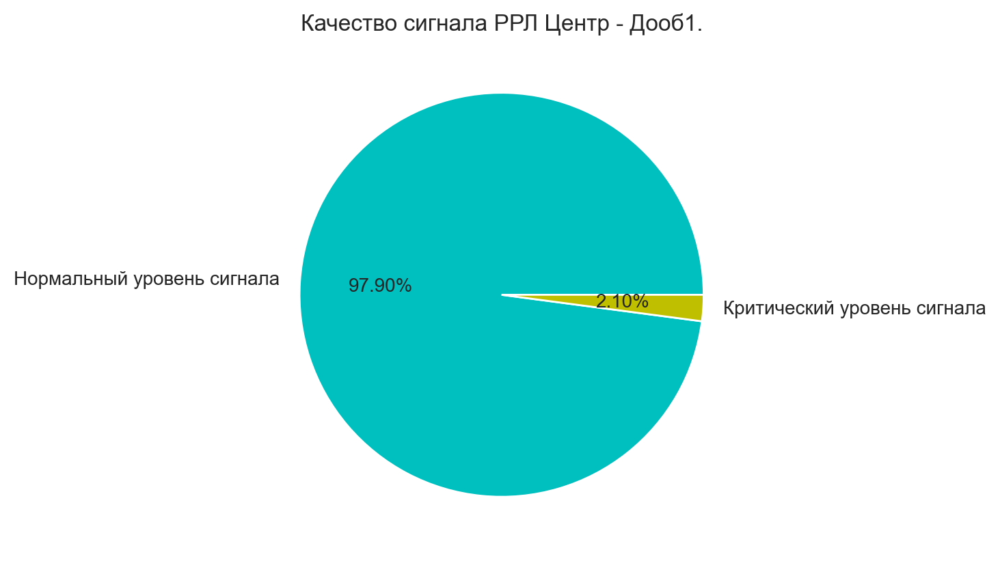

In [58]:
df3_5 = df3[df3['CenDoob1'] <= critical][['date_time','CenDoob1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df3)-len(df3_5)), len(df3_5)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Дооб1.');


Критический уровень сигнала -58.0


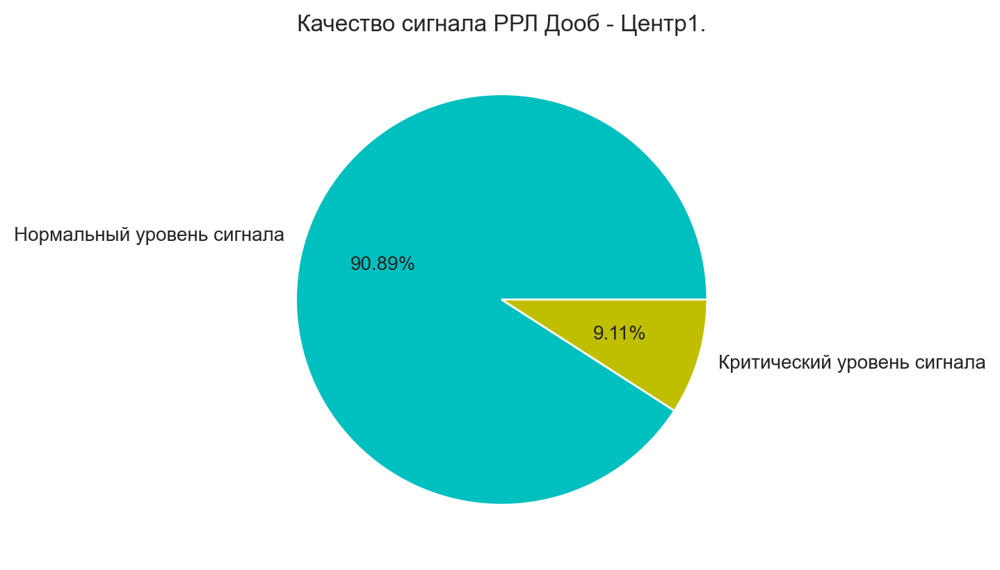

In [59]:
df3_6 = df3[df3['DoobCen1'] <= critical][['date_time','DoobCen1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df3)-len(df3_6)), len(df3_6)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Дооб - Центр1.');


Критический уровень сигнала -58.0


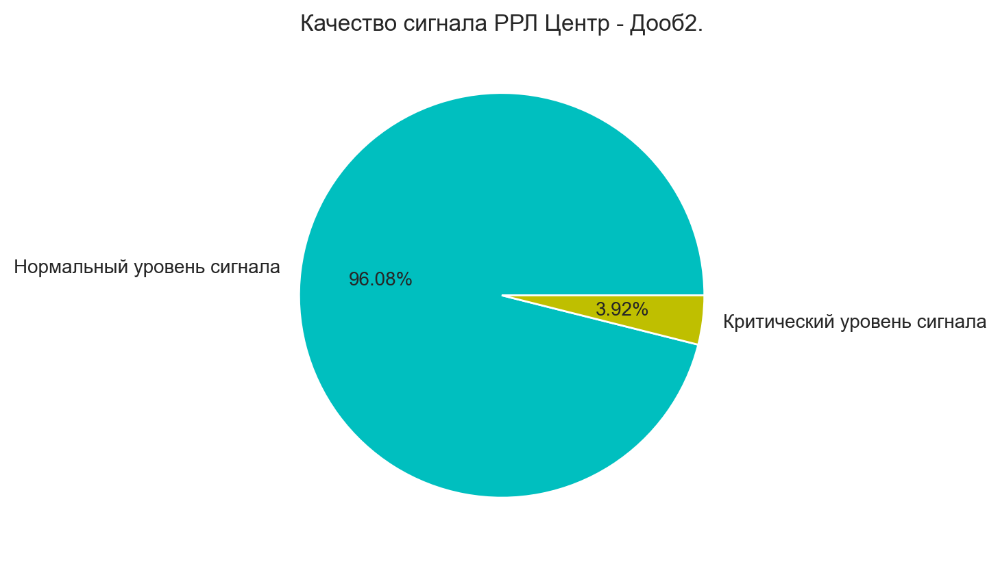

In [60]:
df3_7 = df3[df3['CenDoob2'] <= critical][['date_time','CenDoob2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df3)-len(df3_7)), len(df3_7)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Дооб2.');


Критический уровень сигнала -58.0


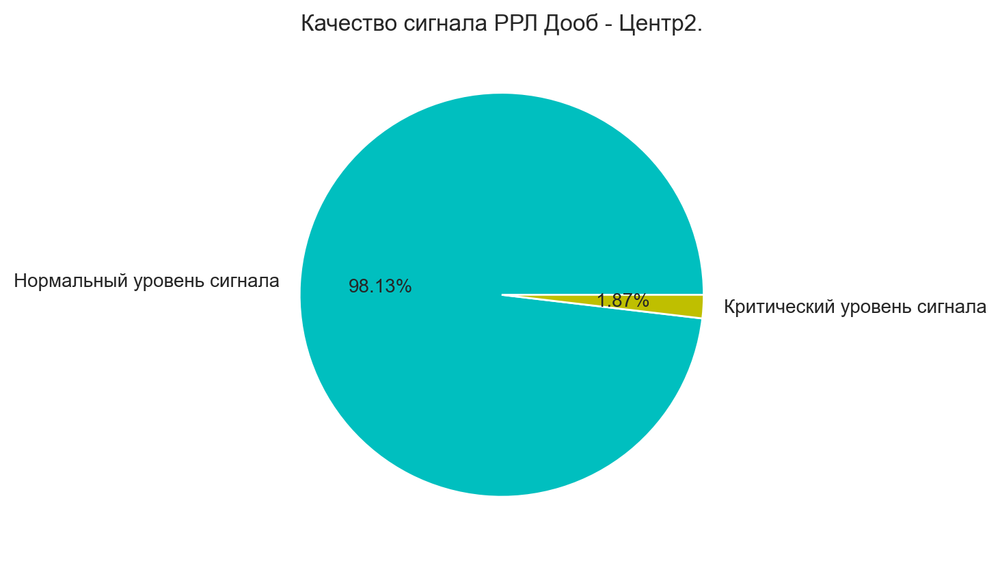

In [61]:
df3_8 = df3[df3['DoobCen2'] <= critical][['date_time','DoobCen2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df3)-len(df3_8)), len(df3_8)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Дооб - Центр2.');


### 2021 год.

In [62]:
df4 = df1[df1['year'] == 2021][['date_time', 'CenDoob1','CenDoob2',
                                                                 'DoobCen1', 'DoobCen2',
                                                                 'CenPenay1', 'CenPenay2',
                                                                 'PenayCen1', 'PenayCen2', 'month']]
df4


,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2,month
62582,2021-01-01 00:07:00,-44.5,-42.9,-46.9,-51.0,-45.7,-39.7,-50.4,-50.7,1
62583,2021-01-01 00:17:00,-45.0,-45.9,-44.4,-56.6,-43.1,-41.8,-62.6,-54.9,1
62584,2021-01-01 00:27:00,-44.5,-43.4,-45.0,-56.3,-44.1,-41.9,-55.2,-55.2,1
62585,2021-01-01 00:37:00,-45.2,-46.9,-44.8,-52.7,-48.7,-38.9,-50.1,-49.7,1
62586,2021-01-01 00:47:00,-45.7,-49.9,-44.3,-52.3,-47.0,-39.5,-50.4,-48.8,1
...,...,...,...,...,...,...,...,...,...,...
112810,2021-12-31 23:15:00,-49.1,-43.8,-45.6,-50.3,-43.5,-52.5,-43.6,-46.3,12
112811,2021-12-31 23:25:00,-51.3,-44.2,-46.4,-48.7,-43.1,-58.9,-43.5,-46.8,12
112812,2021-12-31 23:35:00,-52.6,-44.7,-48.1,-47.2,-43.4,-54.8,-43.3,-44.7,12
112813,2021-12-31 23:45:00,-56.3,-44.4,-49.2,-46.7,-43.8,-55.2,-44.0,-45.5,12


In [63]:
df4.to_csv('MiniLink_out_2021_1.csv', index=False) # за 2021 год


In [64]:
pd.set_option("display.precision", 1)
np.set_printoptions(precision=1)
df4.agg([np.mean, np.median, np.min, np.max])


,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2,month
mean,2021-07-02 12:22:09.573387776,-48.9,-46.4,-49.5,-48.4,-45.7,-48.3,-45.1,-46.7,6.5
median,2021-07-03 16:35:00.000000000,-48.1,-45.2,-48.9,-47.8,-44.7,-47.7,-44.6,-46.3,7.0
amin,2021-01-01 00:07:00.000000000,-74.4,-74.7,-74.1,-70.9,-91.7,-90.5,-77.3,-69.6,1.0
amax,2021-12-31 23:55:00.000000000,-41.6,-39.1,-39.4,-40.0,-40.6,-36.7,-40.1,-38.8,12.0


## РРЛ Пенай 2021 год.

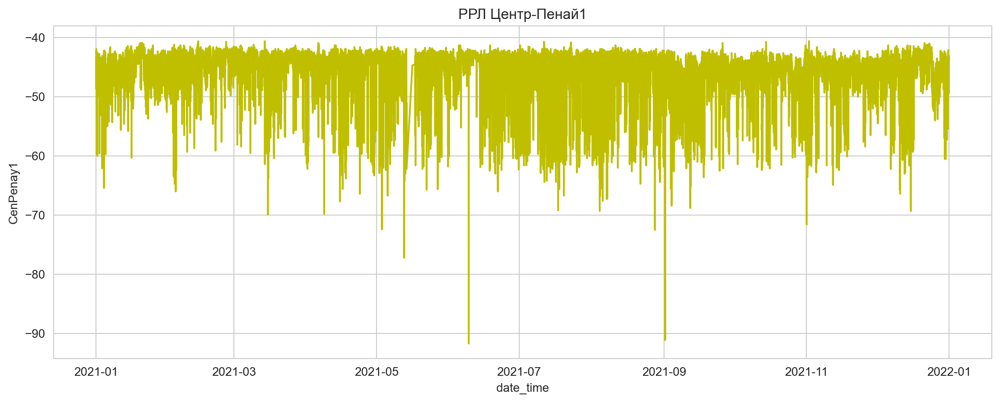

In [65]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenPenay1", data = df4 , legend = 'auto', color = 'y')\
                                                                  .set(title='РРЛ Центр-Пенай1');
plt.show()


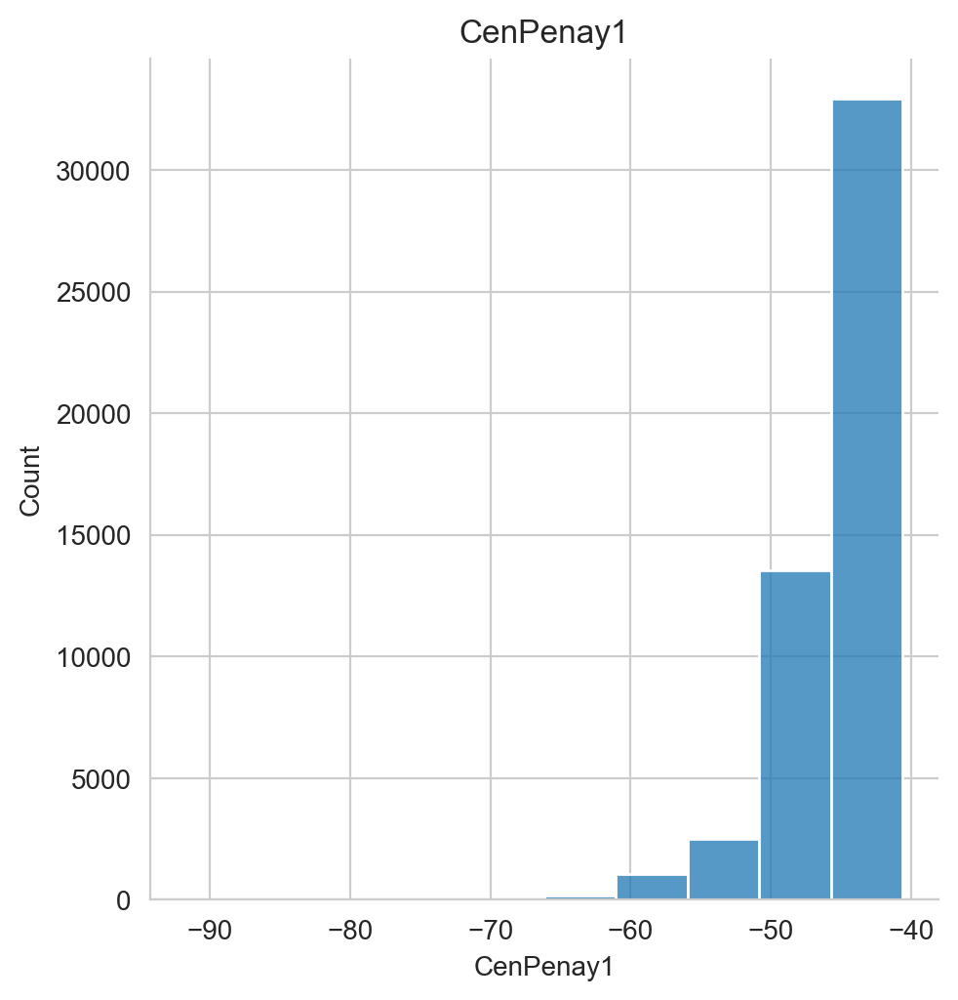

In [66]:
get_plot_dis(df=df4, n=0)

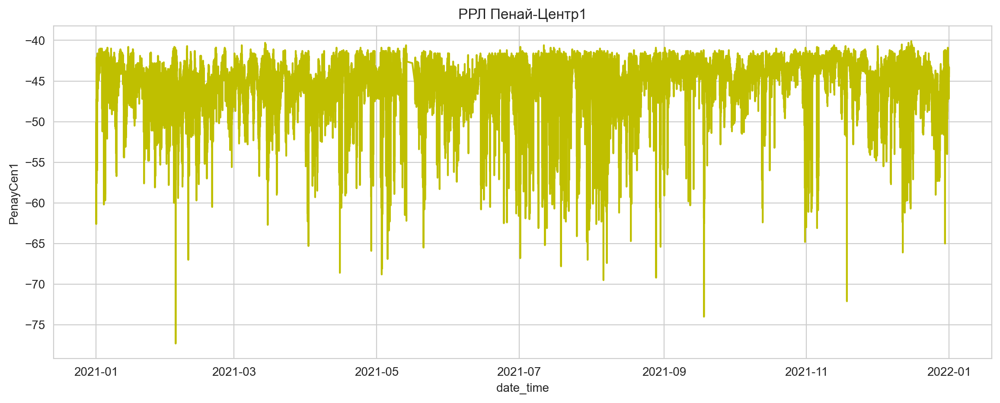

In [67]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "PenayCen1", data = df4 , legend = 'auto', color = 'y')\
                                                             .set(title='РРЛ Пенай-Центр1');
plt.show()


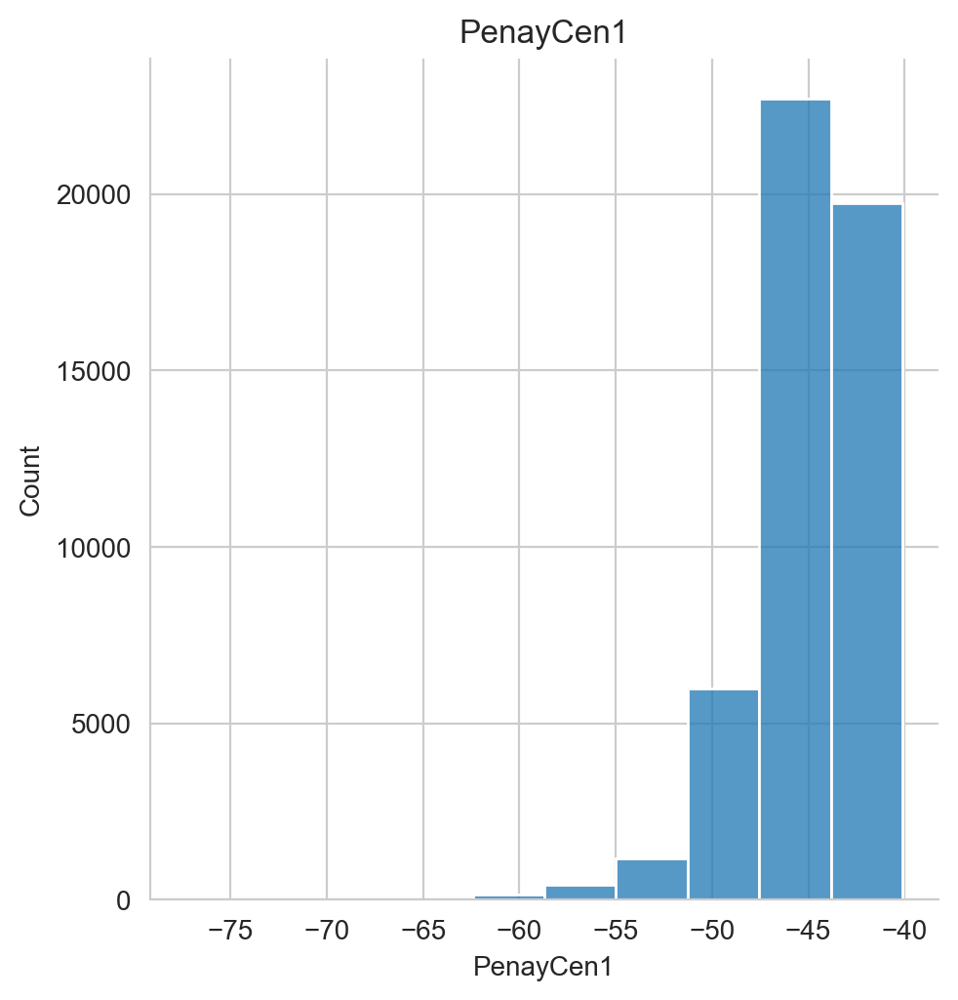

In [68]:
get_plot_dis(df=df4, n=1)

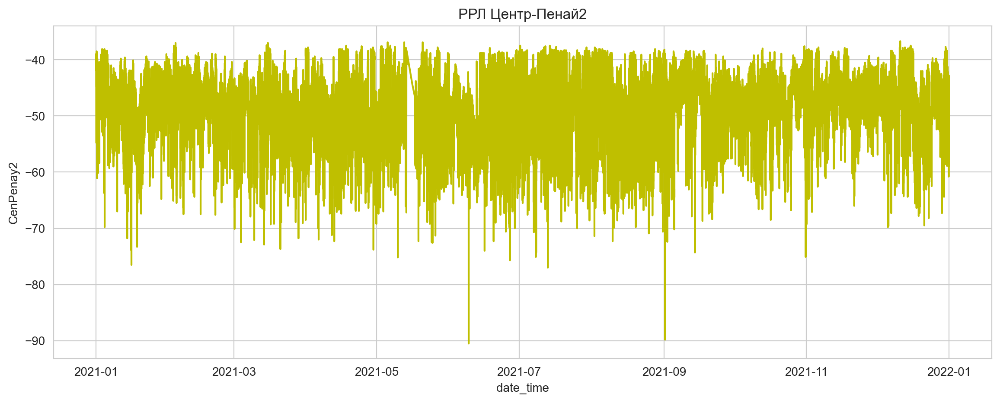

In [69]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenPenay2", data = df4 , legend = 'auto', color = 'y')\
                                                                .set(title='РРЛ Центр-Пенай2');
plt.show()


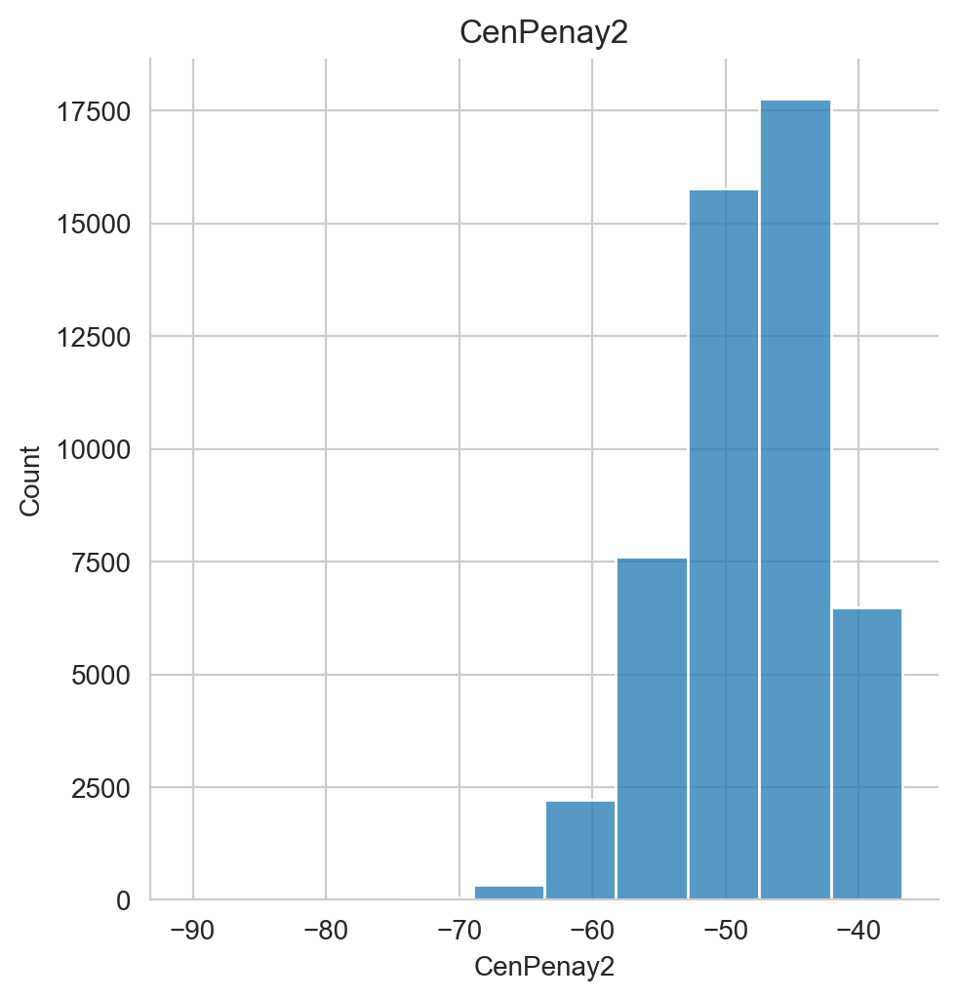

In [70]:
get_plot_dis(df=df4, n=2)

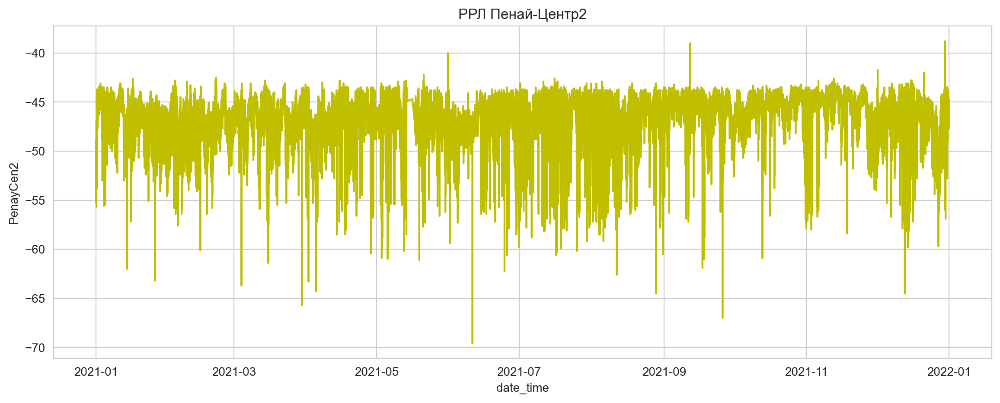

In [71]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "PenayCen2", data = df4 , legend = 'auto', color = 'y')\
                                                             .set(title='РРЛ Пенай-Центр2');
plt.show()


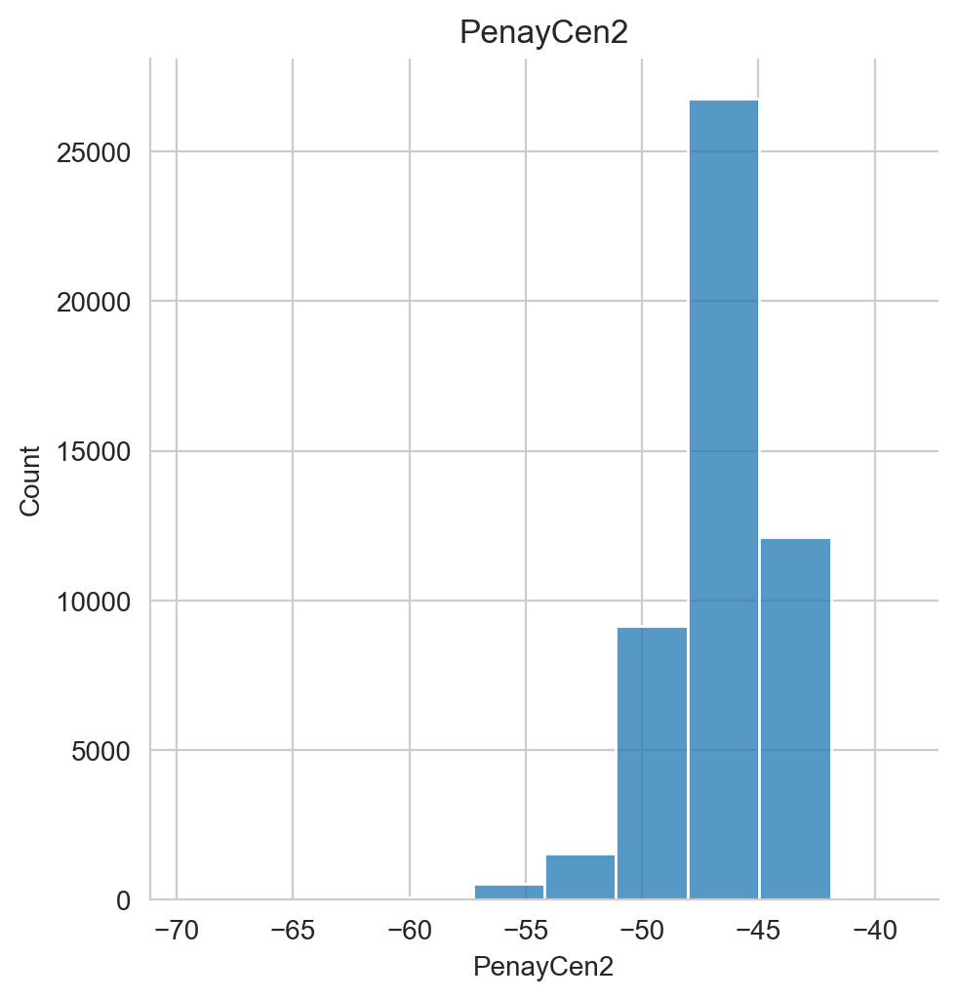

In [72]:
get_plot_dis(df=df4, n=3)

Критический уровень сигнала -58.0


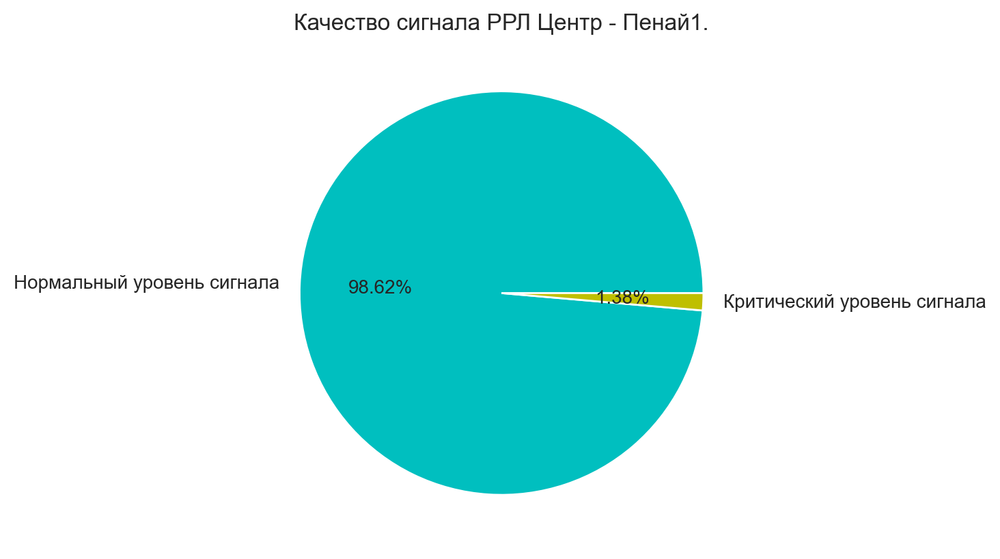

In [73]:
df4_1 = df4[df4['CenPenay1'] <= critical][['date_time','CenPenay1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df4)-len(df4_1)), len(df4_1)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Пенай1.');


Критический уровень сигнала -58.0


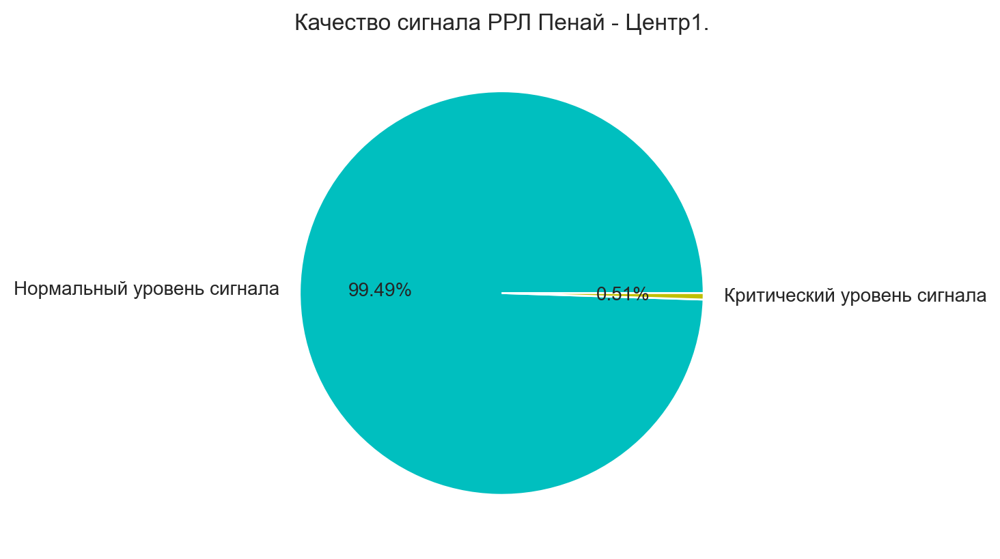

In [74]:
df4_2 = df4[df4['PenayCen1'] <= critical][['date_time','PenayCen1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df4)-len(df4_2)), len(df4_2)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Пенай - Центр1.');


Критический уровень сигнала -58.0


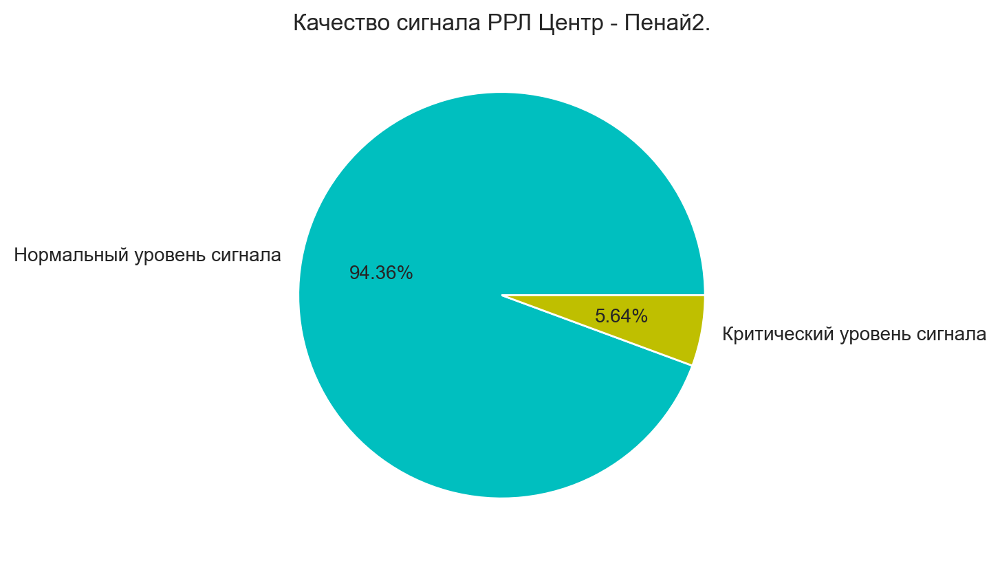

In [75]:
df4_3 = df4[df4['CenPenay2'] <= critical][['date_time','CenPenay2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df4)-len(df4_3)), len(df4_3)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Пенай2.');


Критический уровень сигнала -58.0


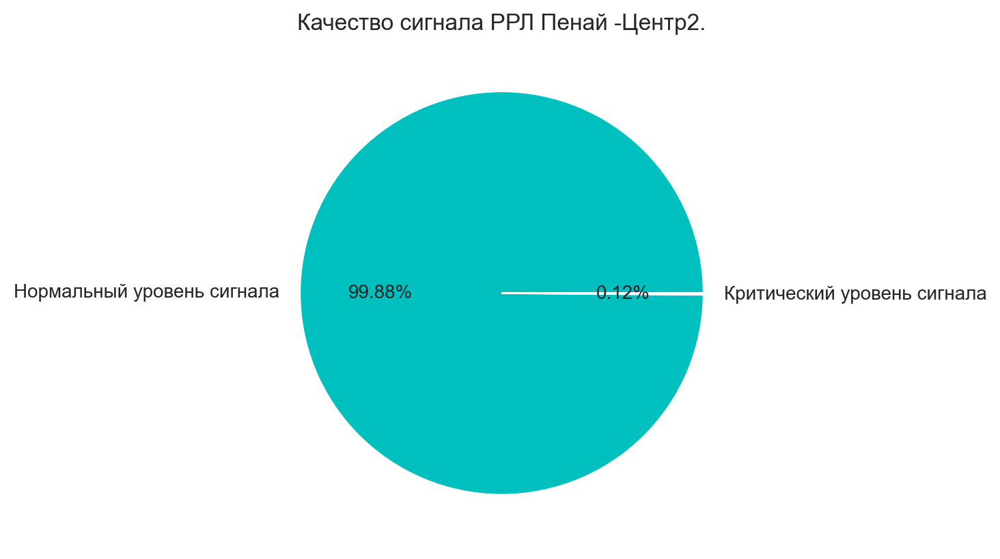

In [76]:
df4_4 = df4[df4['PenayCen2'] <= critical][['date_time','PenayCen2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df4)-len(df4_4)), len(df4_4)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Пенай -Центр2.');


## РРЛ Дооб 2021 год.

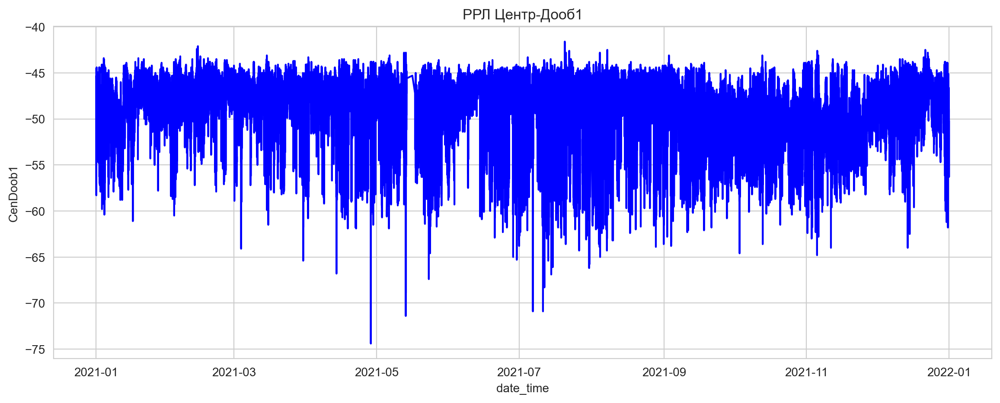

In [77]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenDoob1", data = df4 , legend = 'auto', color = 'b')\
                                                   .set(title='РРЛ Центр-Дооб1');
plt.show()


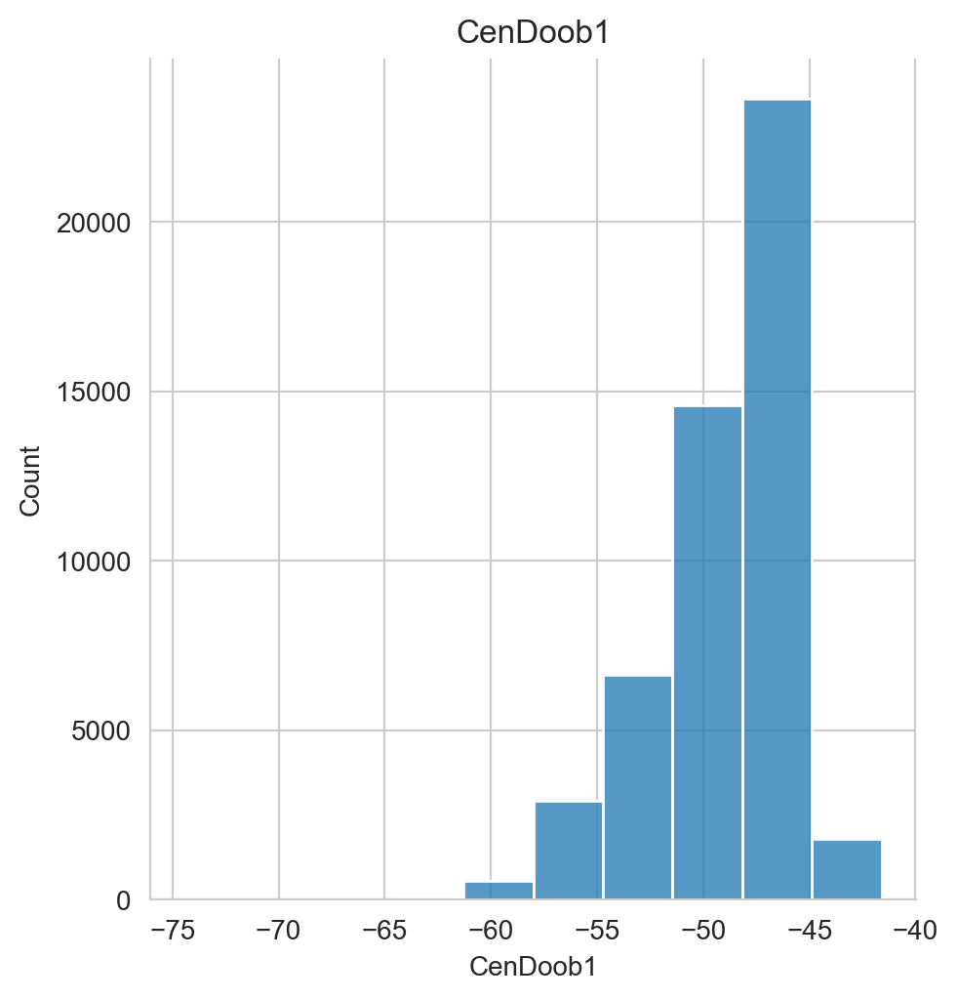

In [78]:
get_plot_dis(df=df4, n=4)

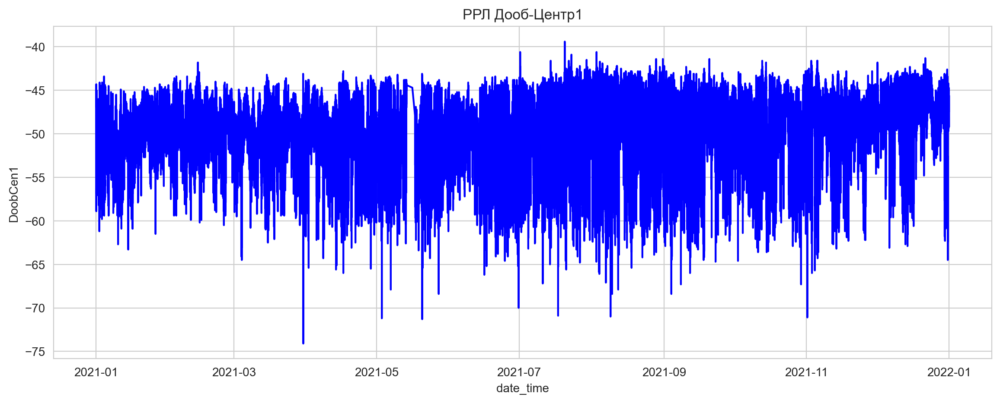

In [79]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "DoobCen1", data = df4 , legend = 'auto', color = 'b')\
                                                   .set(title='РРЛ Дооб-Центр1');
plt.show()


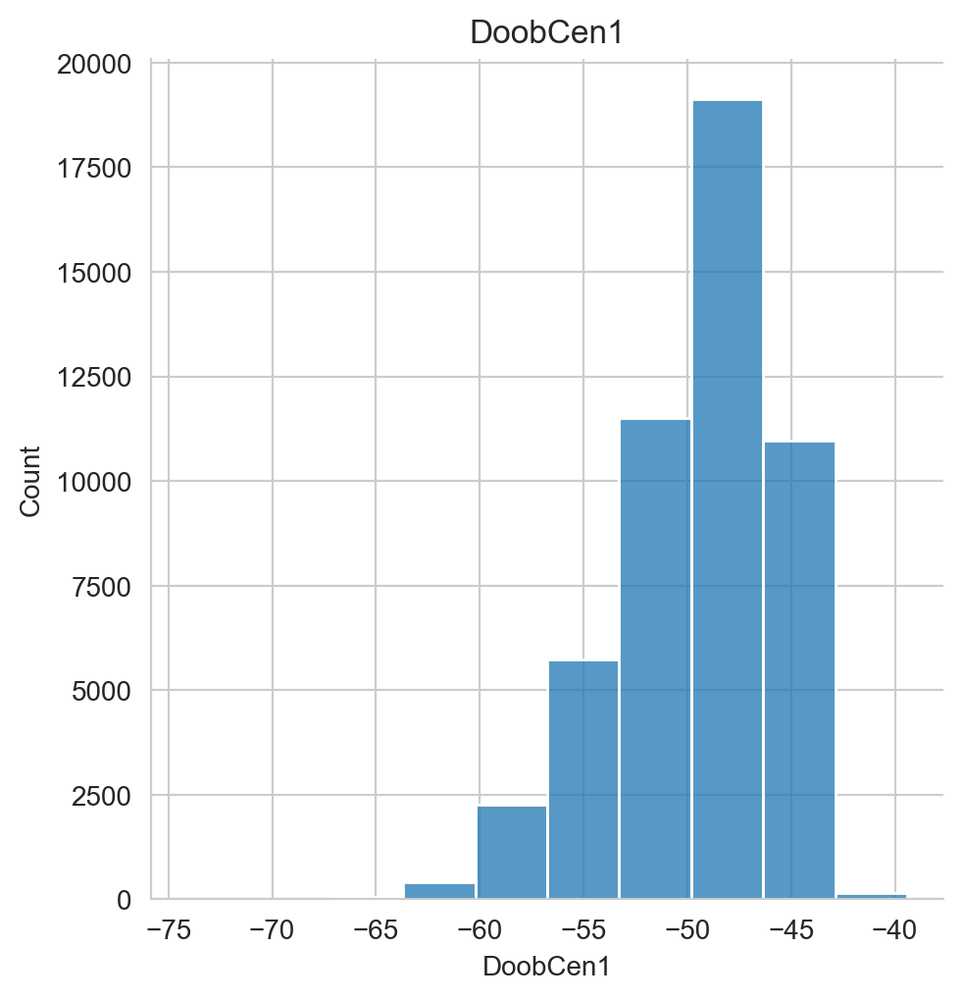

In [80]:
get_plot_dis(df=df4, n=5)

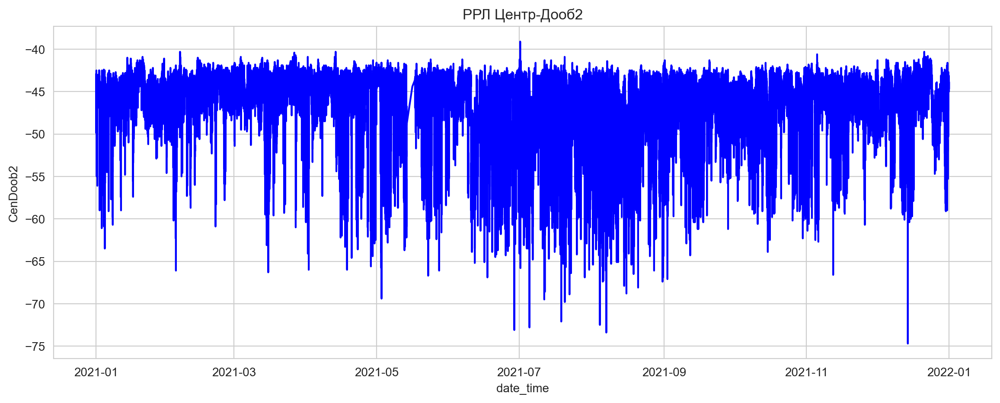

In [81]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenDoob2", data = df4 , legend = 'auto', color = 'b')\
                                                              .set(title='РРЛ Центр-Дооб2');
plt.show()


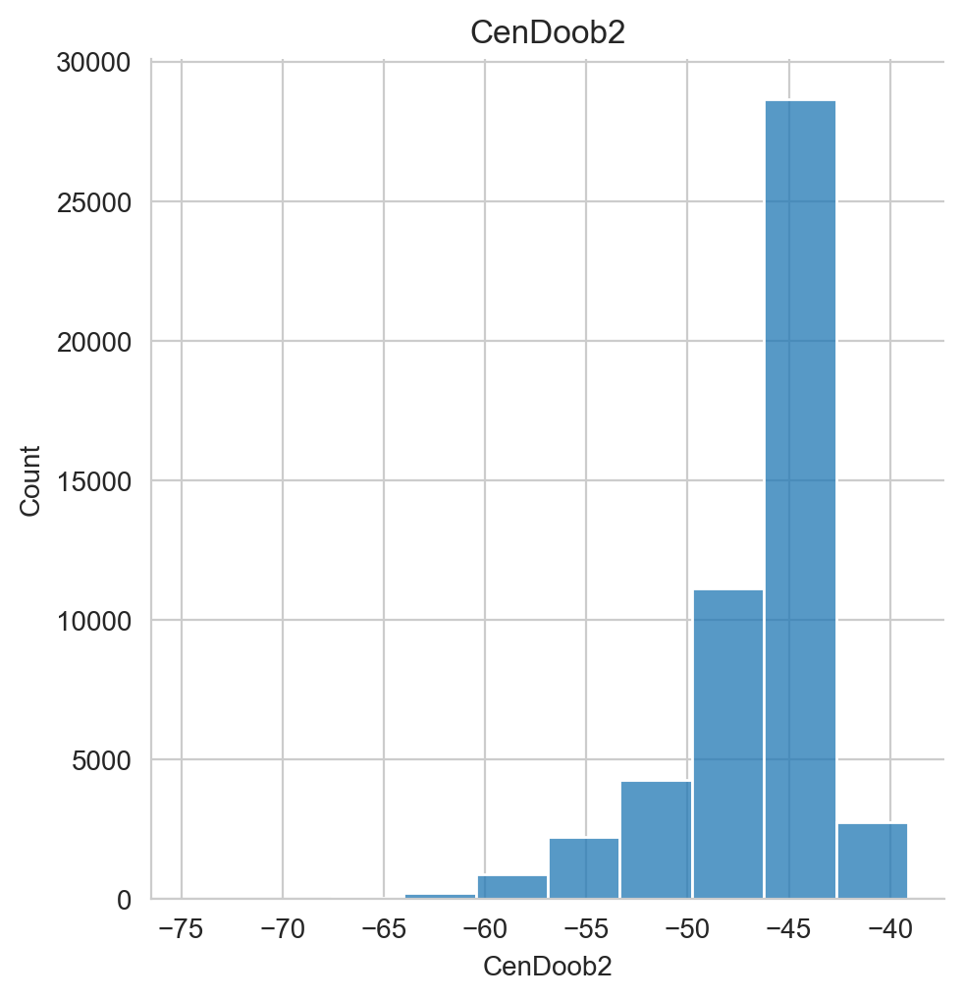

In [82]:
get_plot_dis(df=df4, n=6)

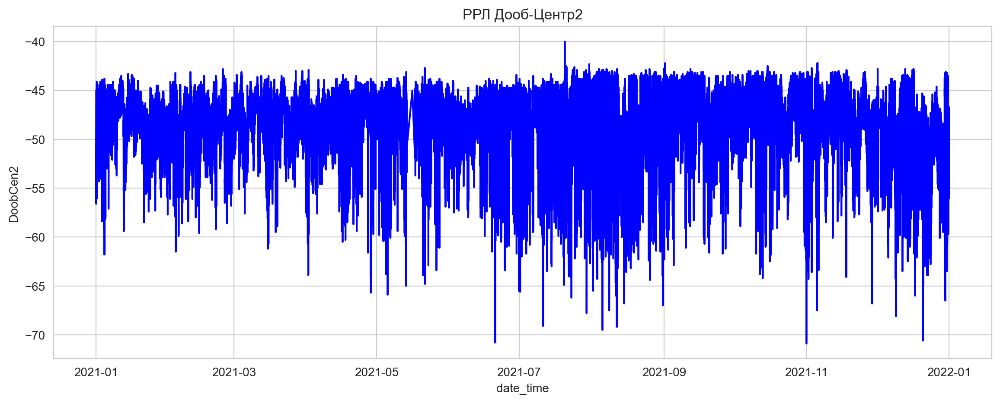

In [83]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "DoobCen2", data = df4 , legend = 'auto', color = 'b')\
                                                              .set(title='РРЛ Дооб-Центр2');
plt.show()


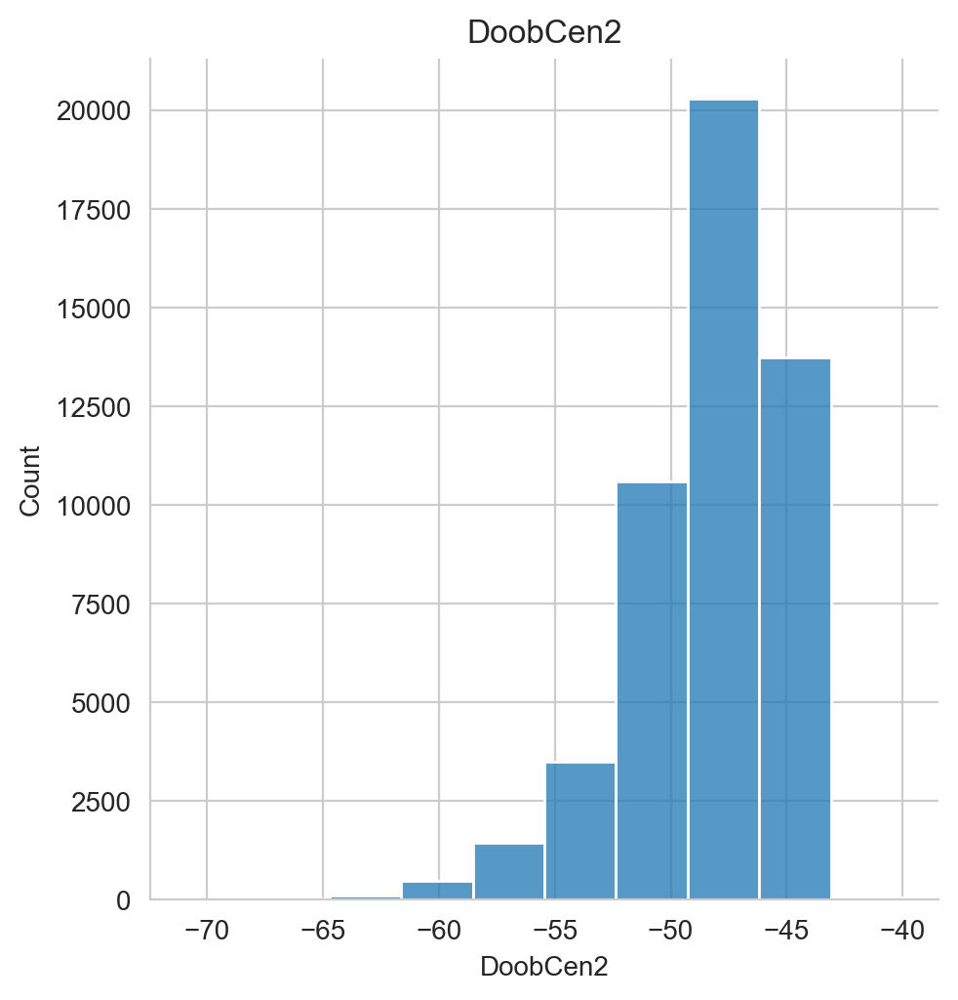

In [84]:
get_plot_dis(df=df4, n=7)

Критический уровень сигнала -58.0


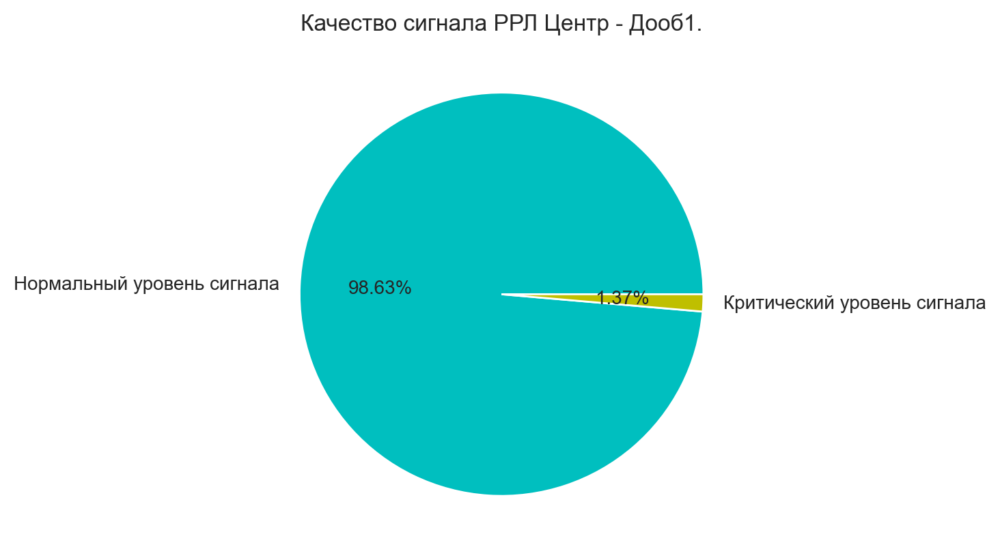

In [85]:
df4_5 = df4[df4['CenDoob1'] <= critical][['date_time','CenDoob1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df4)-len(df4_5)), len(df4_5)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Дооб1.');


Критический уровень сигнала -58.0


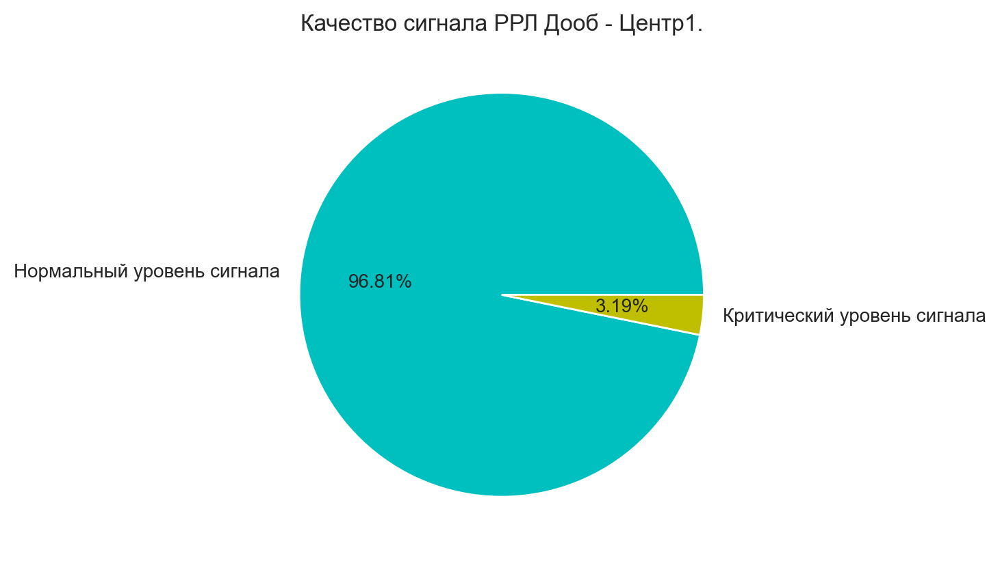

In [86]:
df4_6 = df4[df4['DoobCen1'] <= critical][['date_time','DoobCen1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df4)-len(df4_6)), len(df4_6)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Дооб - Центр1.');


Критический уровень сигнала -58.0


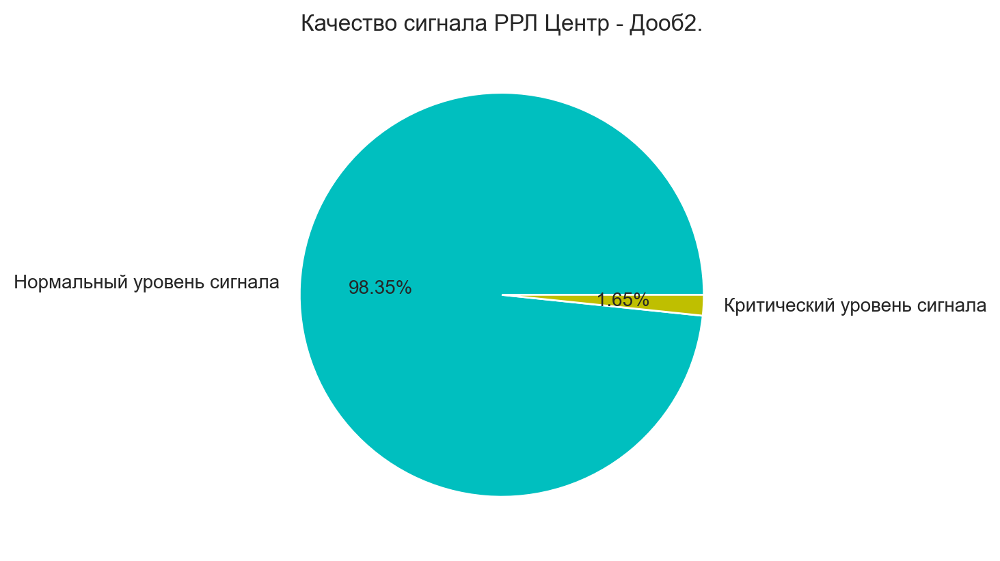

In [87]:
df4_7 = df4[df4['CenDoob2'] <= critical][['date_time','CenDoob2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df4)-len(df4_7)), len(df4_7)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Дооб2.');


Критический уровень сигнала -58.0


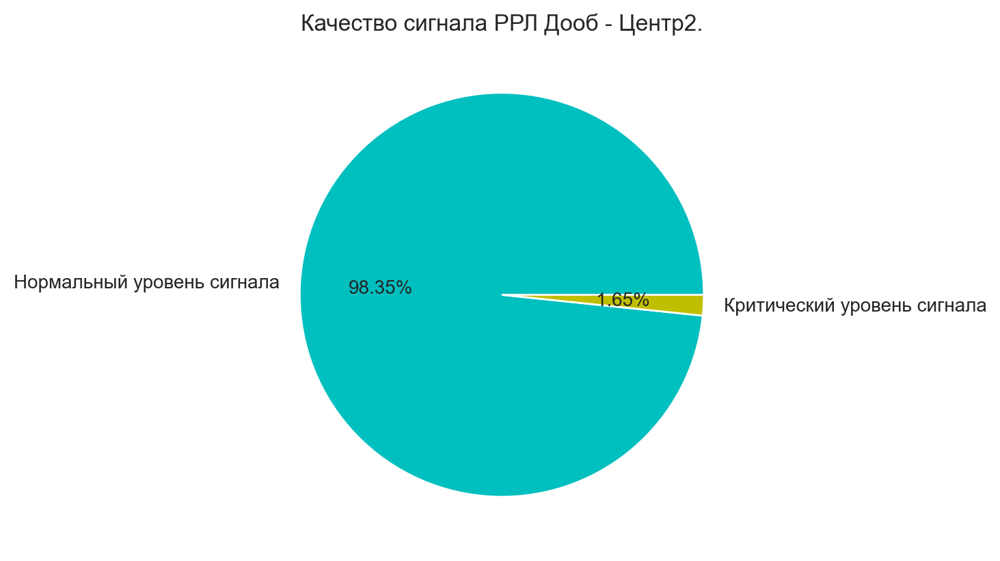

In [88]:
df4_8 = df4[df4['DoobCen2'] <= critical][['date_time','DoobCen2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df4)-len(df4_8)), len(df4_8)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Дооб - Центр2.');


### 2022 год.

In [89]:
df5 = df1[df1['year'] == 2022][['date_time', 'CenDoob1','CenDoob2',
                                                                 'DoobCen1', 'DoobCen2',
                                                                 'CenPenay1', 'CenPenay2',
                                                                 'PenayCen1', 'PenayCen2', 'month']]
df5


,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2,month
112815,2022-01-01 00:05:00,-49.5,-43.3,-46.6,-49.2,-44.7,-50.8,-43.4,-46.4,1
112816,2022-01-01 00:15:00,-47.9,-43.1,-45.7,-52.1,-43.9,-57.3,-44.1,-45.6,1
112817,2022-01-01 00:25:00,-48.0,-43.4,-45.2,-52.0,-43.1,-58.6,-44.0,-46.0,1
112818,2022-01-01 00:35:00,-51.0,-43.8,-46.6,-50.3,-43.4,-55.3,-44.1,-46.2,1
112819,2022-01-01 00:45:00,-47.8,-43.5,-45.3,-51.0,-43.0,-60.4,-44.1,-46.6,1
...,...,...,...,...,...,...,...,...,...,...
163756,2022-12-31 23:15:00,-46.4,-43.4,-54.4,-47.7,-43.7,-57.9,-44.6,-47.0,12
163757,2022-12-31 23:25:00,-51.8,-45.3,-56.4,-46.3,-44.2,-50.3,-46.5,-47.3,12
163758,2022-12-31 23:35:00,-51.9,-45.0,-51.5,-49.6,-44.5,-50.9,-44.6,-46.9,12
163759,2022-12-31 23:45:00,-47.4,-43.5,-47.9,-49.1,-42.6,-53.8,-44.0,-46.3,12


In [90]:
df5.to_csv('MiniLink_out_2022_1.csv', index=False) # за 2022 год


In [91]:
pd.set_option("display.precision", 1)
np.set_printoptions(precision=1)
df5.agg([np.mean, np.median, np.min, np.max])


,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2,month
mean,2022-07-02 13:22:09.975267584,-49.1,-48.0,-49.4,-48.9,-46.5,-47.1,-45.1,-46.7,6.5
median,2022-07-02 07:45:00.000000000,-48.2,-46.9,-48.5,-47.7,-45.4,-46.2,-44.4,-46.2,7.0
amin,2022-01-01 00:05:00.000000000,-80.0,-89.8,-72.3,-73.4,-91.7,-90.5,-91.4,-90.1,1.0
amax,2022-12-31 23:55:00.000000000,-41.3,-40.0,-41.6,-41.2,-40.7,-36.6,-39.7,-41.6,12.0


## РРЛ Пенай 2022 год.

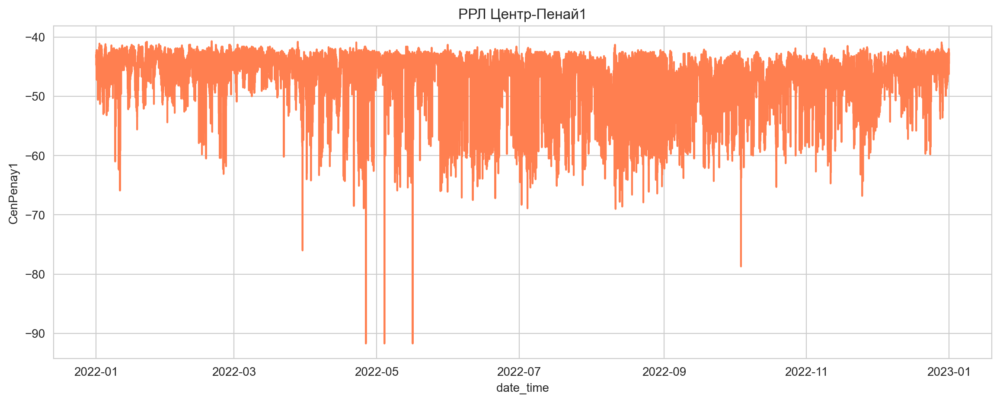

In [92]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenPenay1", data = df5 , legend = 'auto', color = 'coral')\
                                                                  .set(title='РРЛ Центр-Пенай1');
plt.show()


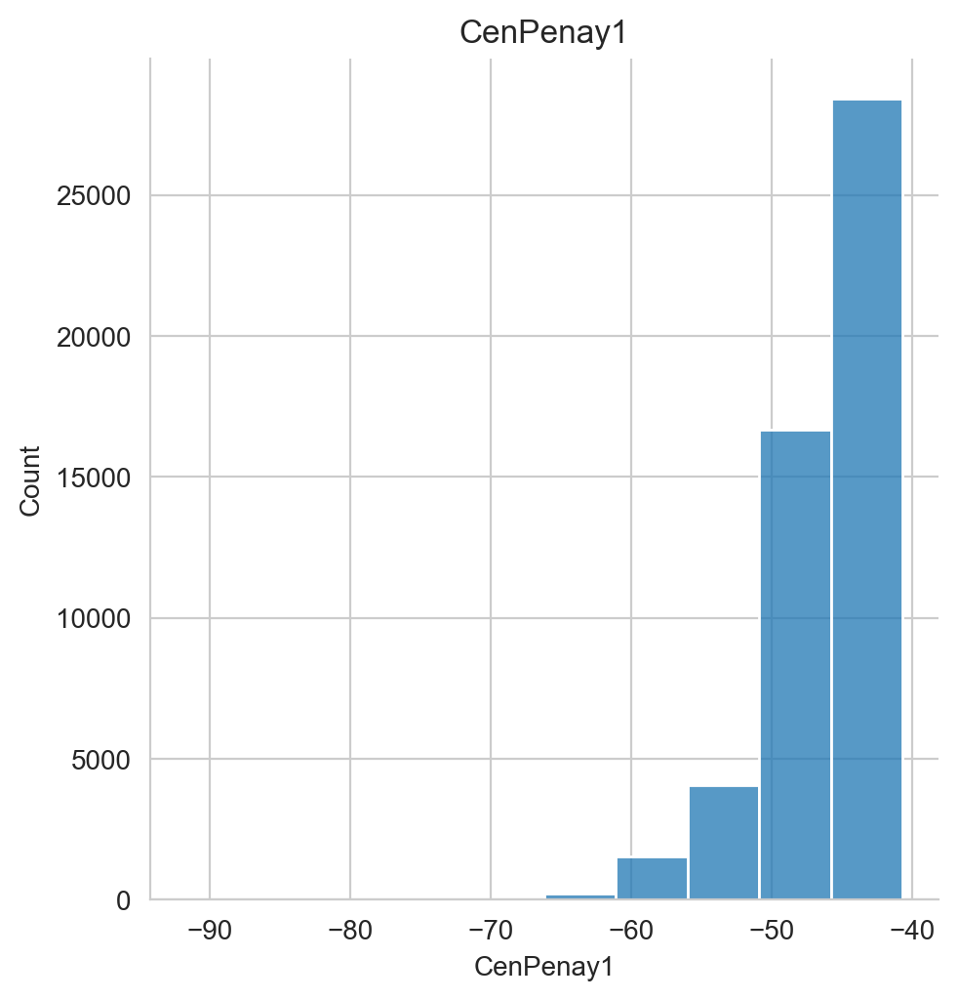

In [93]:
get_plot_dis(df=df5, n=0)

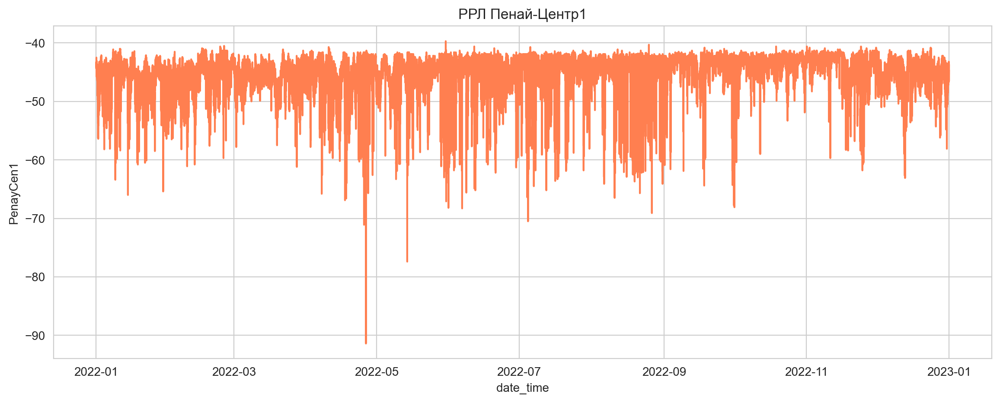

In [94]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "PenayCen1", data = df5 , legend = 'auto', color = 'coral')\
                                                             .set(title='РРЛ Пенай-Центр1');
plt.show()


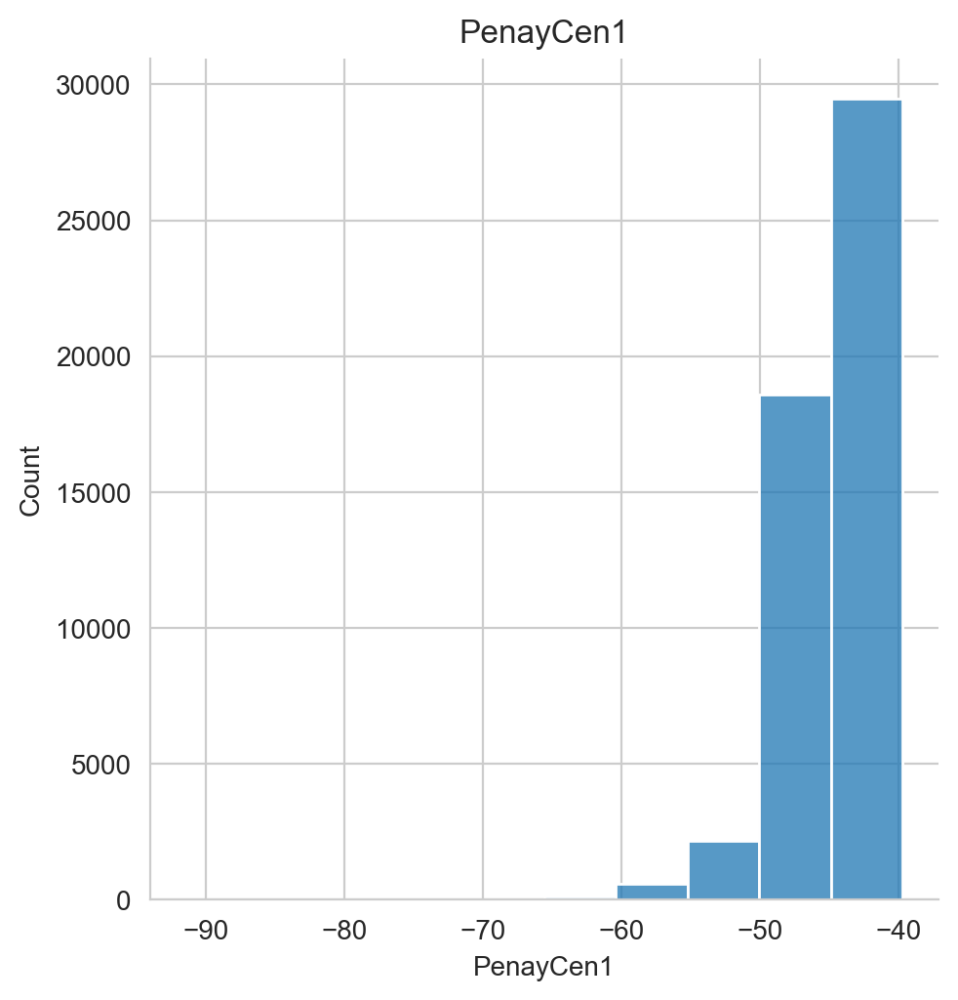

In [95]:
get_plot_dis(df=df5, n=1)

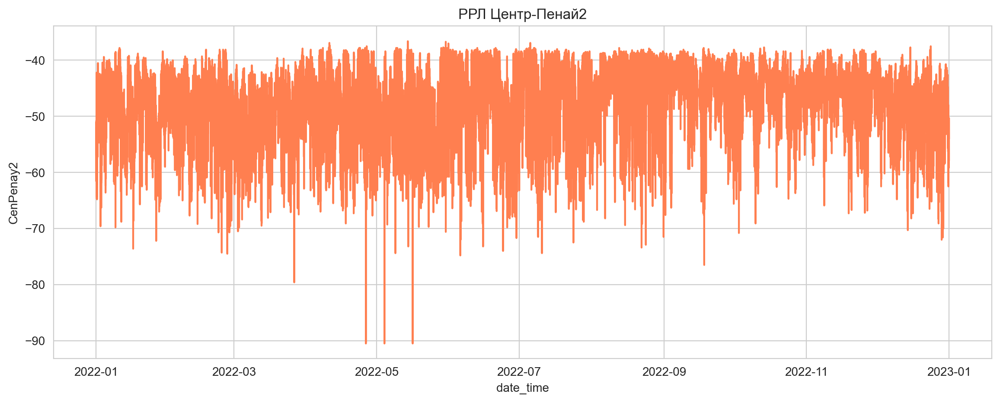

In [96]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenPenay2", data = df5 , legend = 'auto', color = 'coral')\
                                                                .set(title='РРЛ Центр-Пенай2');
plt.show()


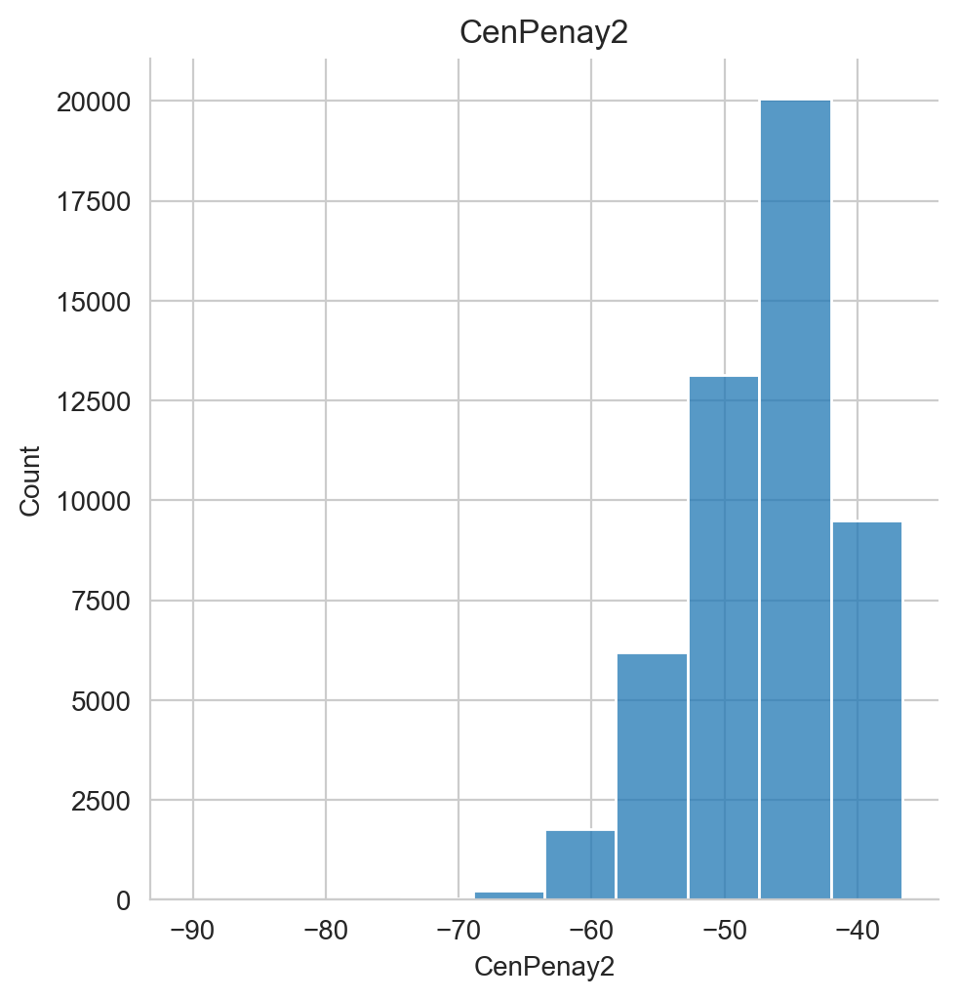

In [97]:
get_plot_dis(df=df5, n=2)

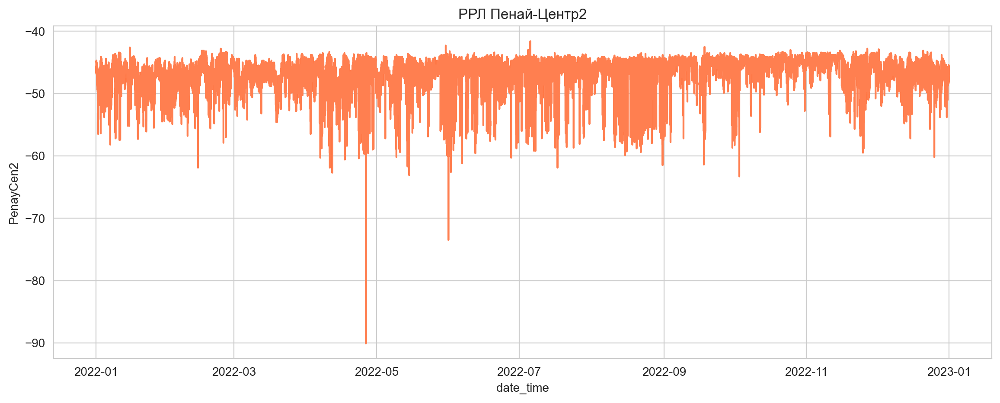

In [98]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "PenayCen2", data = df5 , legend = 'auto', color = 'coral')\
                                                             .set(title='РРЛ Пенай-Центр2');
plt.show()


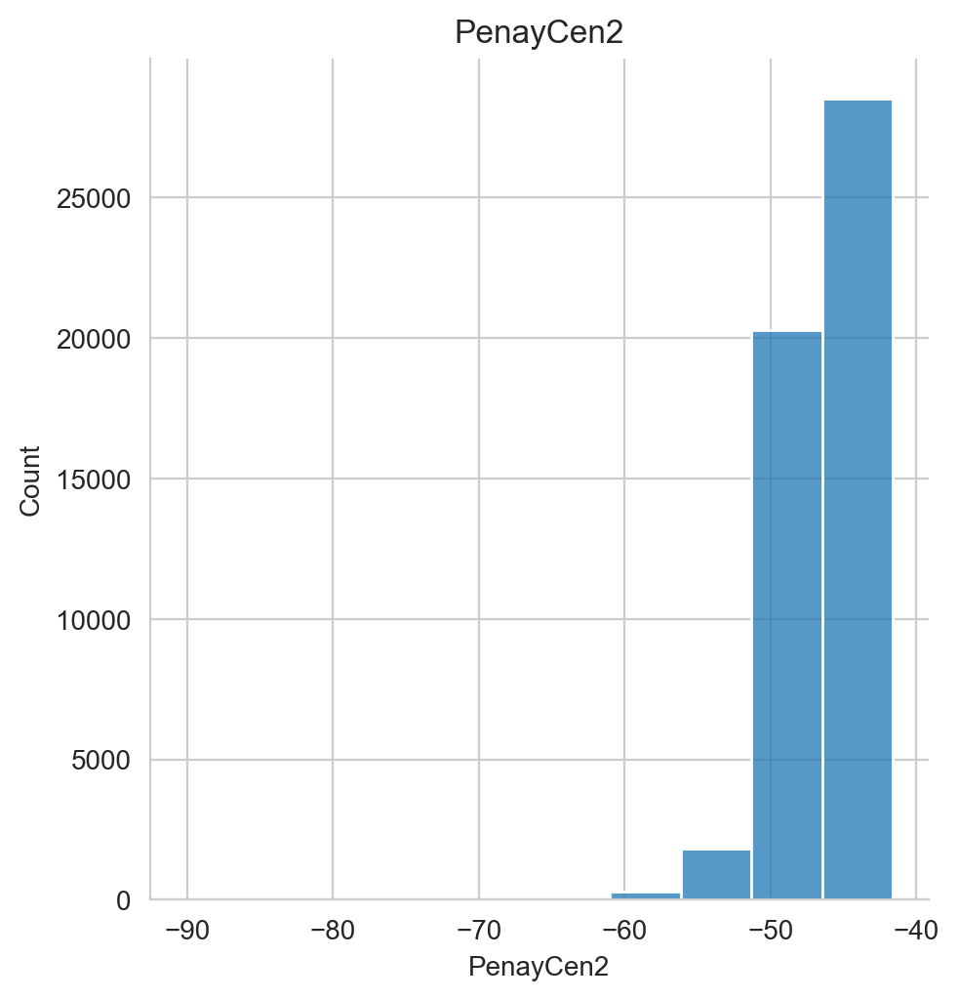

In [99]:
get_plot_dis(df=df5, n=3)

Критический уровень сигнала -58.0


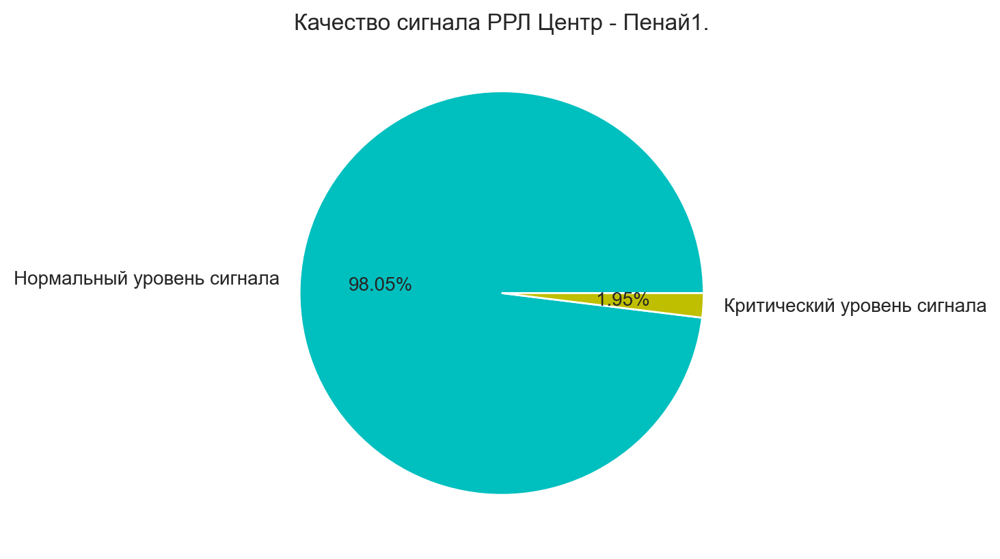

In [100]:
df5_1 = df5[df5['CenPenay1'] <= critical][['date_time','CenPenay1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df5)-len(df5_1)), len(df5_1)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Пенай1.');


Критический уровень сигнала -58.0


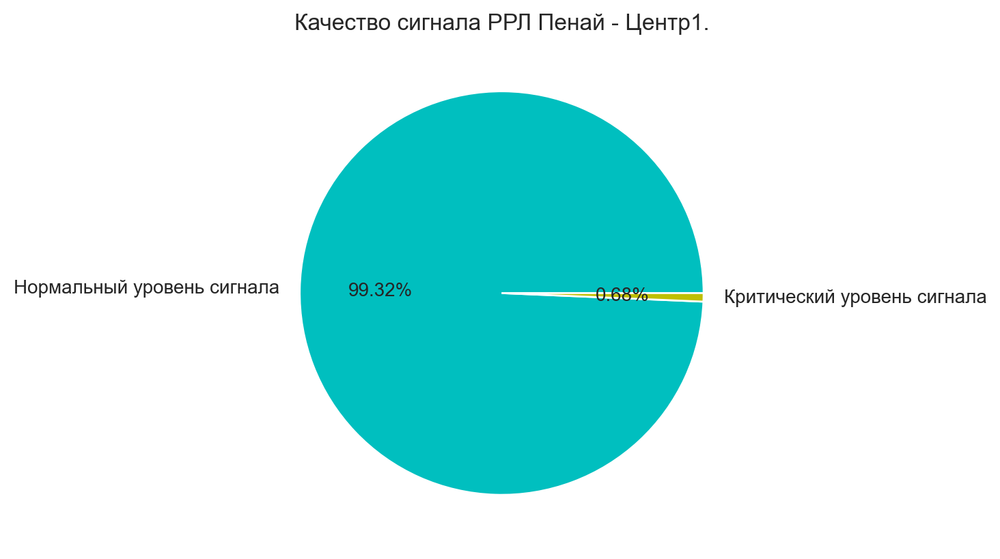

In [101]:
df5_2 = df5[df5['PenayCen1'] <= critical][['date_time','PenayCen1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df5)-len(df5_2)), len(df5_2)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Пенай - Центр1.');


Критический уровень сигнала -58.0


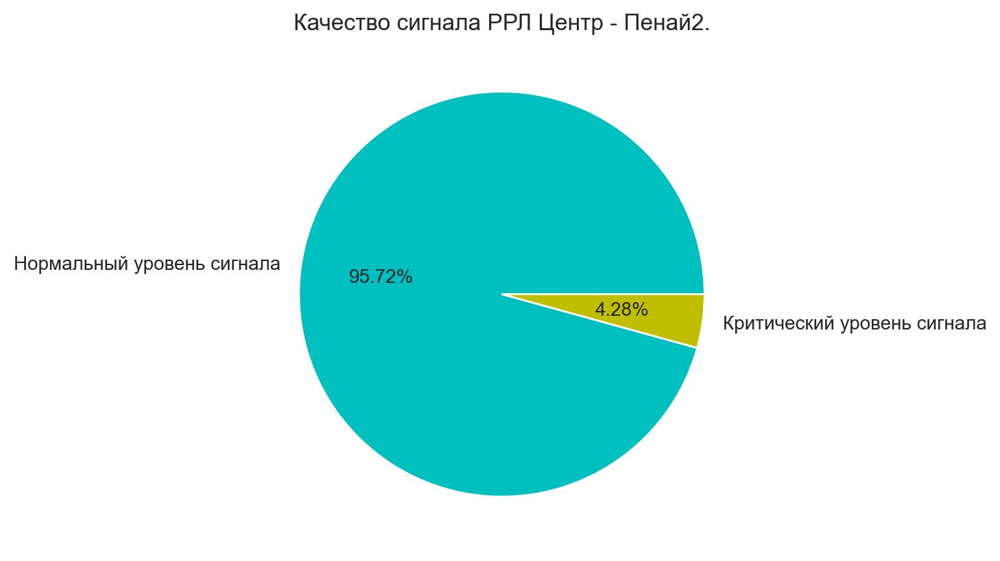

In [102]:
df5_3 = df5[df5['CenPenay2'] <= critical][['date_time','CenPenay2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df5)-len(df5_3)), len(df5_3)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Пенай2.');


Критический уровень сигнала -58.0


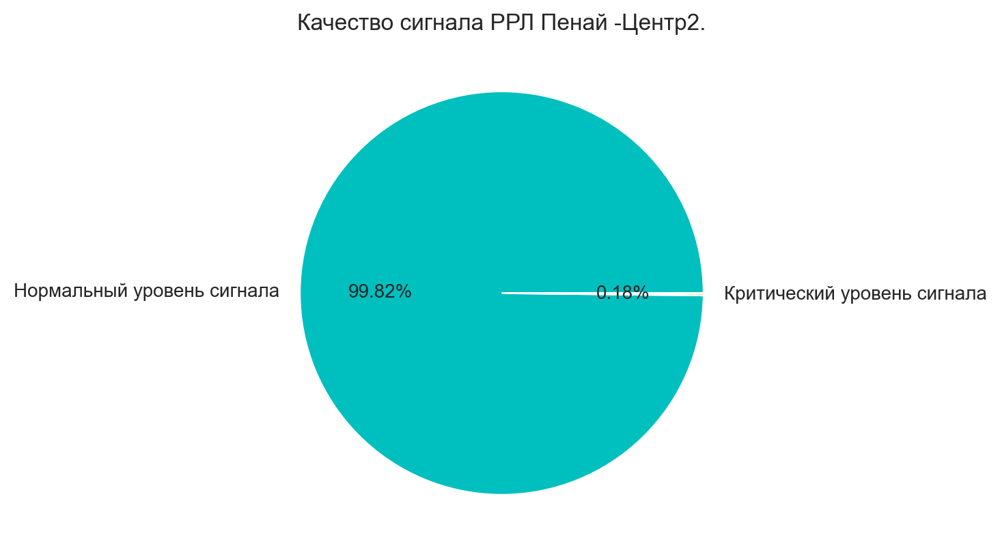

In [103]:
df5_4 = df5[df5['PenayCen2'] <= critical][['date_time','PenayCen2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df5)-len(df5_4)), len(df5_4)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Пенай -Центр2.');


## РРЛ Дооб 2022 год.

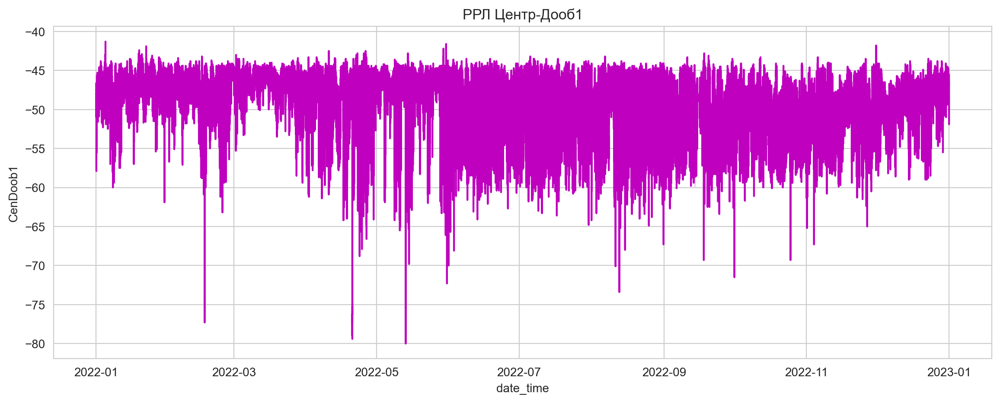

In [104]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenDoob1", data = df5 , legend = 'auto', color = 'm')\
                                                   .set(title='РРЛ Центр-Дооб1');

plt.show()


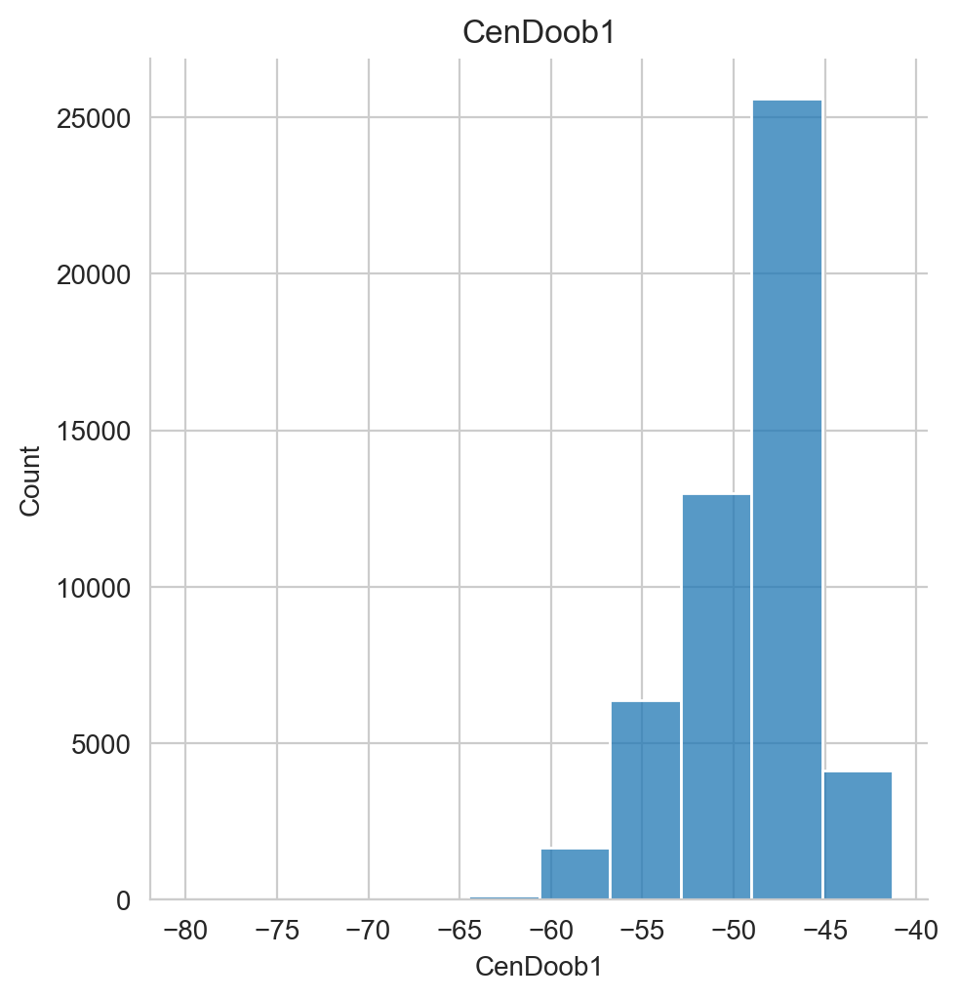

In [105]:
get_plot_dis(df=df5, n=4)

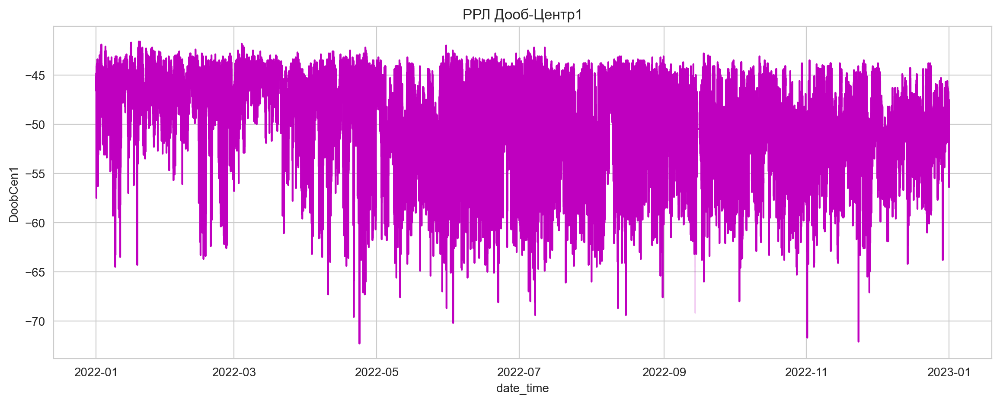

In [106]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "DoobCen1", data = df5 , legend = 'auto', color = 'm')\
                                                   .set(title='РРЛ Дооб-Центр1');
plt.show()


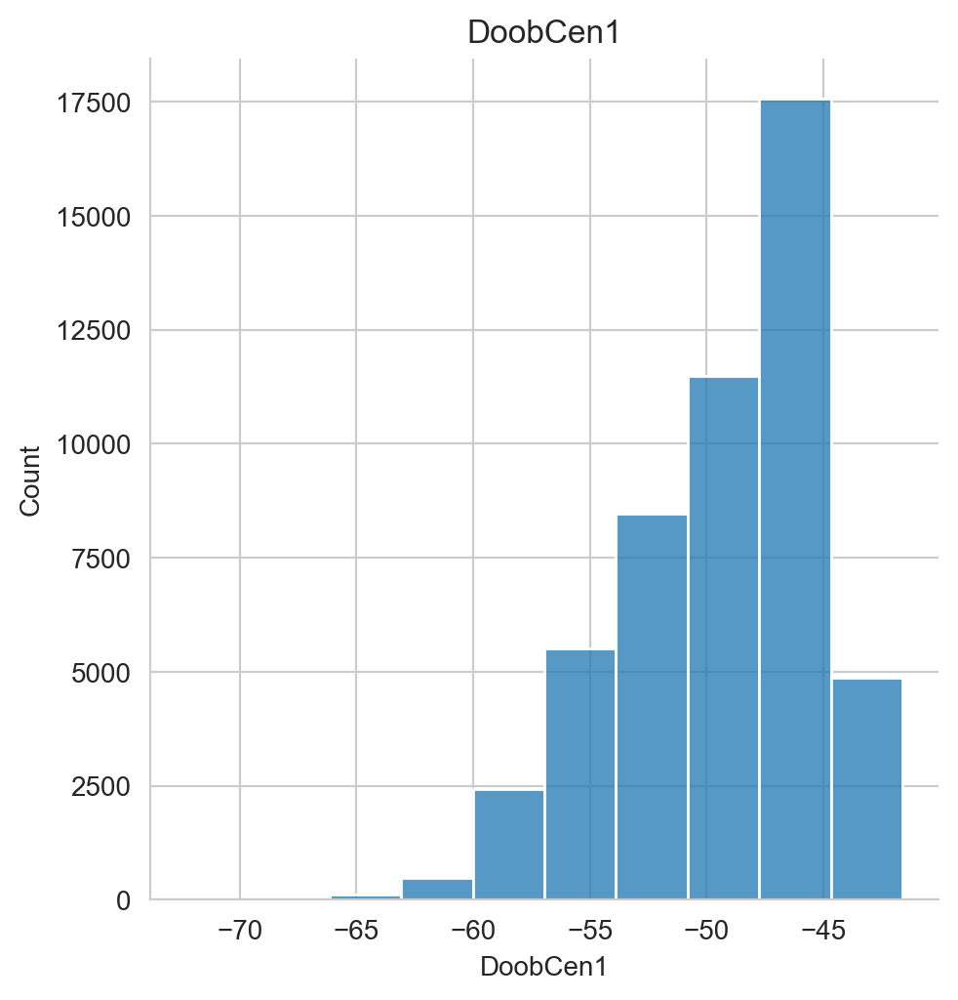

In [107]:
get_plot_dis(df=df5, n=5)

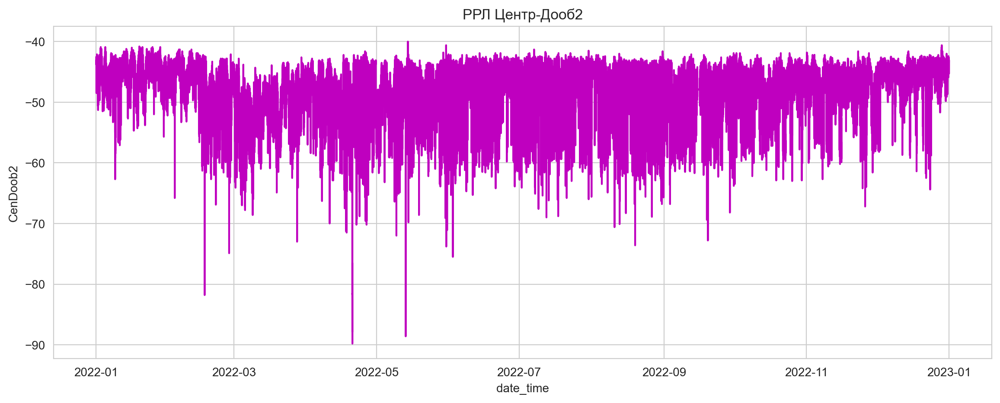

In [108]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenDoob2", data = df5 , legend = 'auto', color = 'm')\
                                                              .set(title='РРЛ Центр-Дооб2');
plt.show()


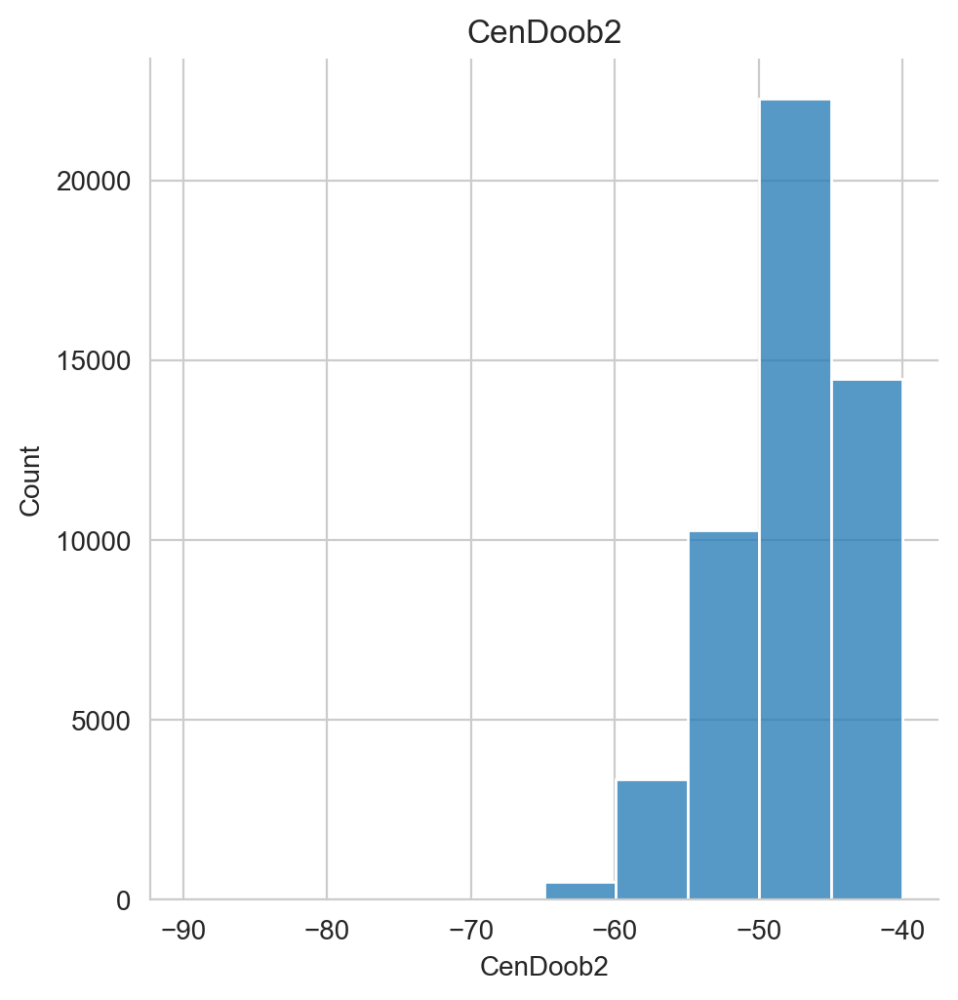

In [109]:
get_plot_dis(df=df5, n=6)

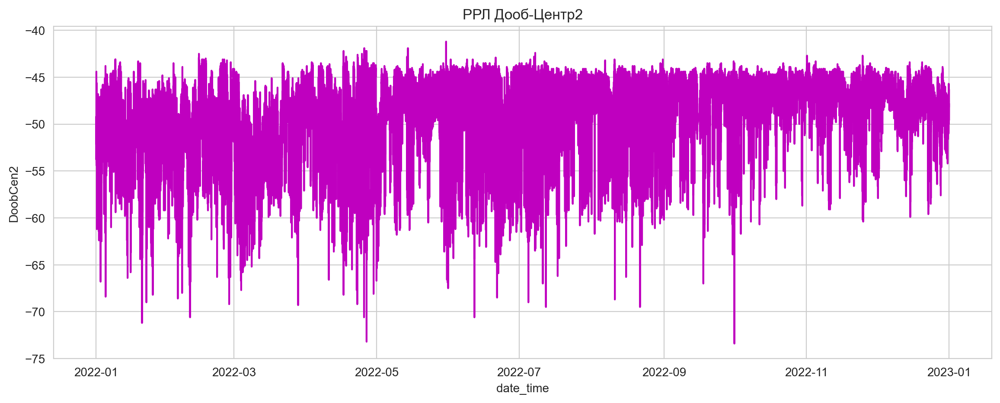

In [110]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "DoobCen2", data = df5 , legend = 'auto', color = 'm')\
                                                              .set(title='РРЛ Дооб-Центр2');
plt.show()


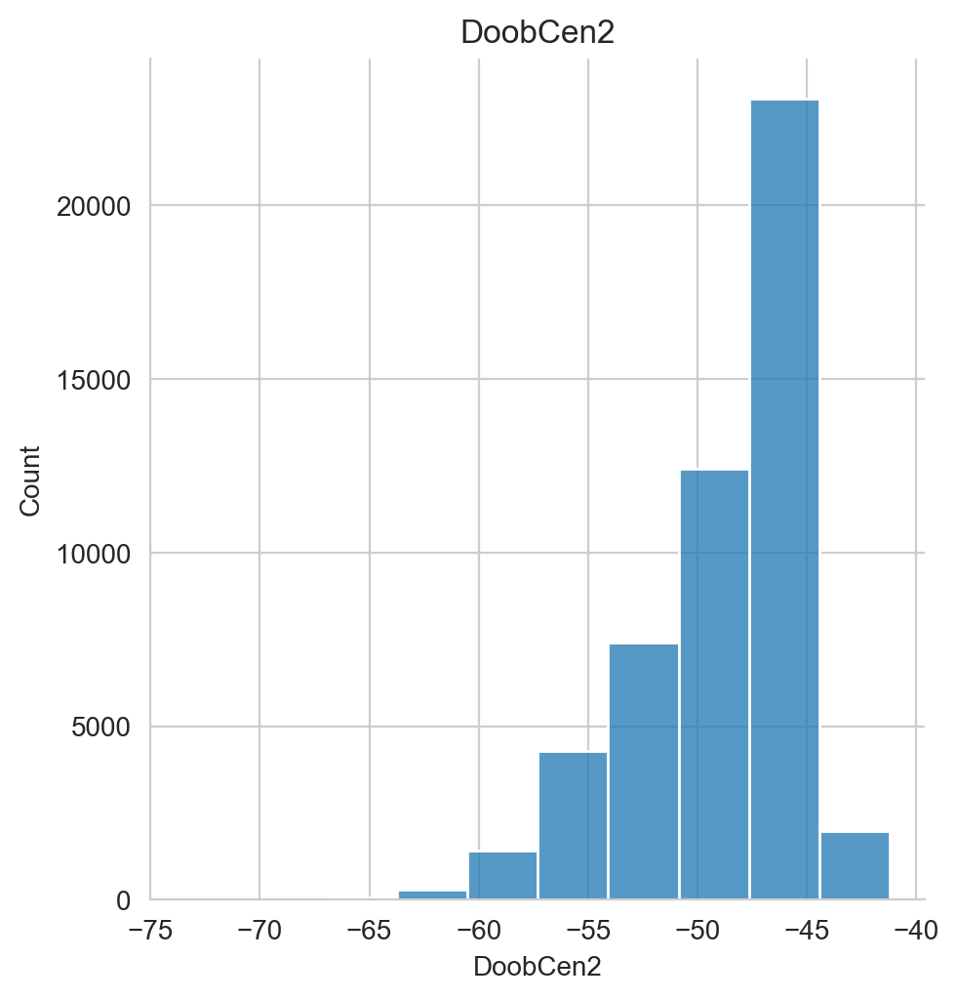

In [111]:
get_plot_dis(df=df5, n=7)

Критический уровень сигнала -58.0


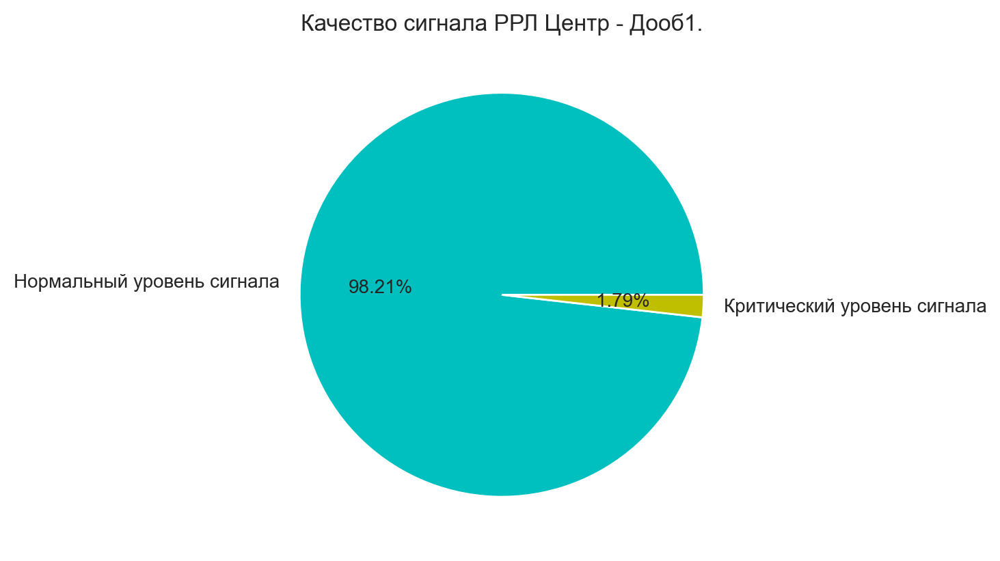

In [112]:
df5_5 = df5[df5['CenDoob1'] <= critical][['date_time','CenDoob1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df5)-len(df5_5)), len(df5_5)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Дооб1.');


Критический уровень сигнала -58.0


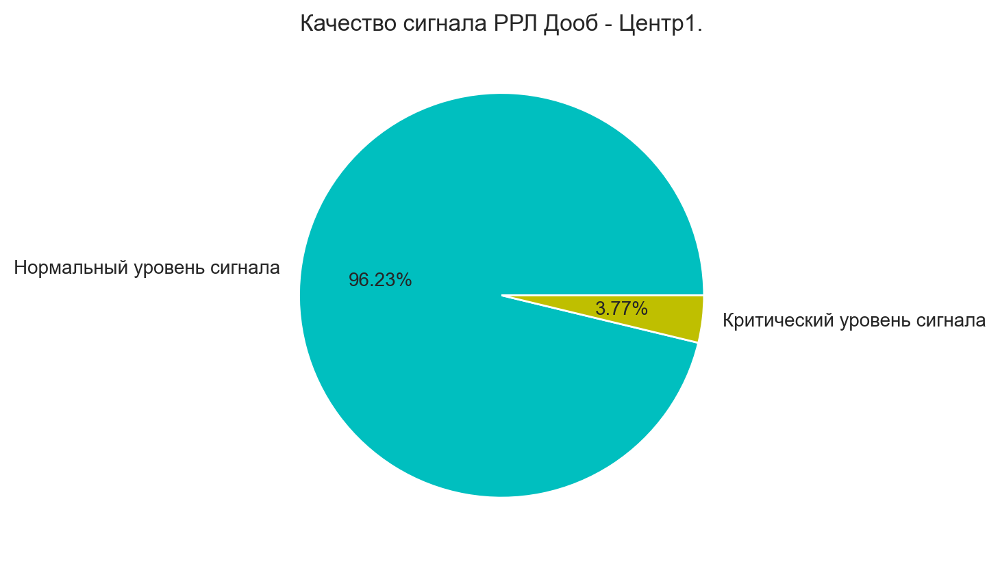

In [113]:
df5_6 = df5[df5['DoobCen1'] <= critical][['date_time','DoobCen1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df5)-len(df5_6)), len(df5_6)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Дооб - Центр1.');


Критический уровень сигнала -58.0


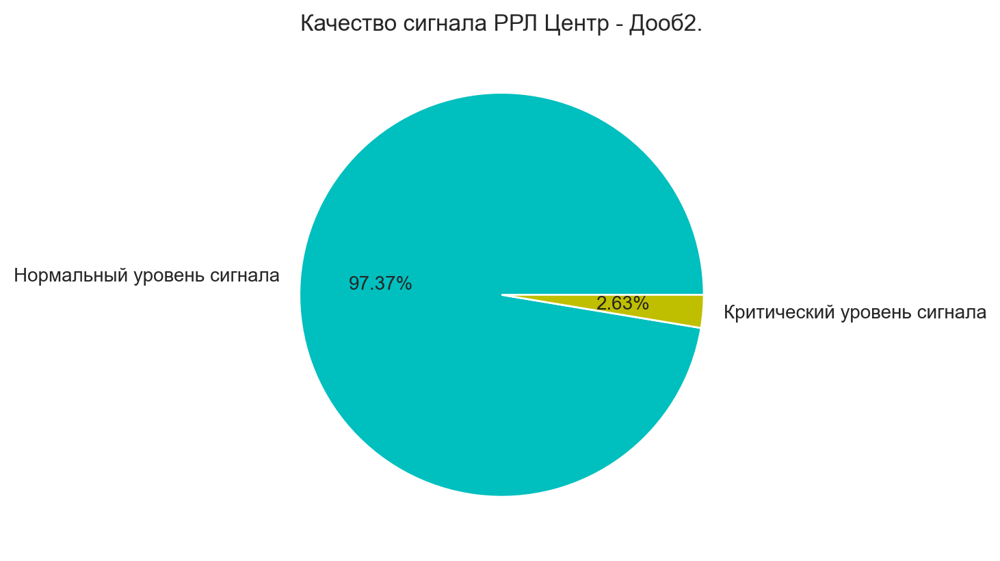

In [114]:
df5_7 = df5[df5['CenDoob2'] <= critical][['date_time','CenDoob2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df5)-len(df5_7)), len(df5_7)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Дооб2.');


Критический уровень сигнала -58.0


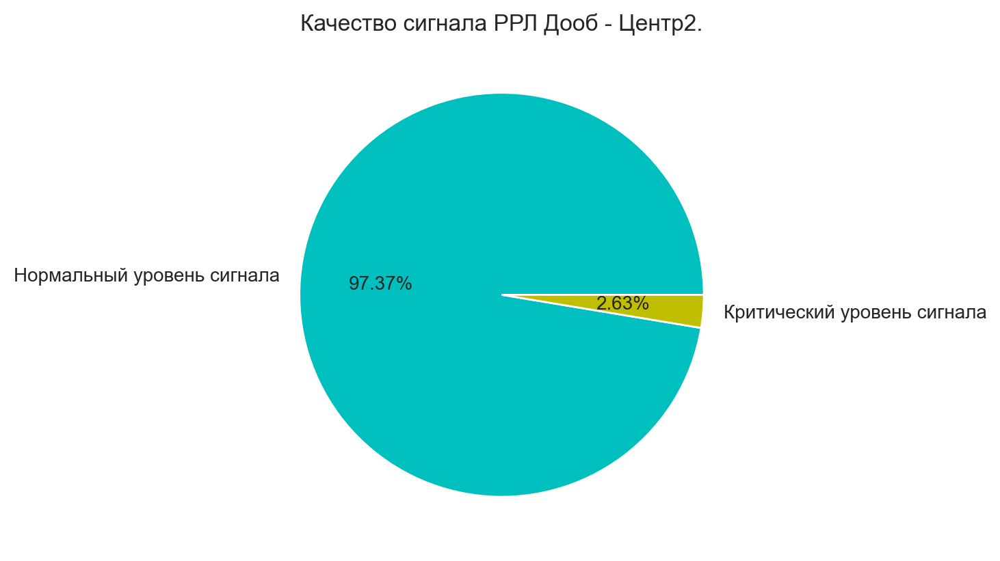

In [115]:
df5_8 = df5[df5['DoobCen2'] <= critical][['date_time','DoobCen2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df5)-len(df5_8)), len(df5_8)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Дооб - Центр2.');


## Последние 4 месяца 2022 год.

In [116]:
df5


,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2,month
112815,2022-01-01 00:05:00,-49.5,-43.3,-46.6,-49.2,-44.7,-50.8,-43.4,-46.4,1
112816,2022-01-01 00:15:00,-47.9,-43.1,-45.7,-52.1,-43.9,-57.3,-44.1,-45.6,1
112817,2022-01-01 00:25:00,-48.0,-43.4,-45.2,-52.0,-43.1,-58.6,-44.0,-46.0,1
112818,2022-01-01 00:35:00,-51.0,-43.8,-46.6,-50.3,-43.4,-55.3,-44.1,-46.2,1
112819,2022-01-01 00:45:00,-47.8,-43.5,-45.3,-51.0,-43.0,-60.4,-44.1,-46.6,1
...,...,...,...,...,...,...,...,...,...,...
163756,2022-12-31 23:15:00,-46.4,-43.4,-54.4,-47.7,-43.7,-57.9,-44.6,-47.0,12
163757,2022-12-31 23:25:00,-51.8,-45.3,-56.4,-46.3,-44.2,-50.3,-46.5,-47.3,12
163758,2022-12-31 23:35:00,-51.9,-45.0,-51.5,-49.6,-44.5,-50.9,-44.6,-46.9,12
163759,2022-12-31 23:45:00,-47.4,-43.5,-47.9,-49.1,-42.6,-53.8,-44.0,-46.3,12


In [117]:
df6 = df5[(df5['month']== 9) | 
          (df5['month']== 10) | 
          (df5['month']== 11) |
          (df5['month']== 12)][['date_time', 
                                'CenDoob1','CenDoob2',
                                'DoobCen1', 'DoobCen2',
                                'CenPenay1', 'CenPenay2',
                                'PenayCen1', 'PenayCen2']]
df6


,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2
146627,2022-09-01 00:00:00,-48.8,-43.1,-47.0,-45.2,-46.0,-40.3,-51.9,-52.2
146628,2022-09-01 00:10:00,-45.6,-44.4,-54.4,-45.2,-47.2,-39.7,-52.4,-53.3
146629,2022-09-01 00:20:00,-47.1,-43.0,-49.4,-44.6,-57.7,-39.8,-44.4,-46.7
146630,2022-09-01 00:30:00,-45.3,-43.5,-54.7,-44.7,-45.6,-40.3,-55.1,-55.4
146631,2022-09-01 00:40:00,-52.7,-44.7,-45.0,-48.3,-55.5,-38.9,-45.0,-46.4
...,...,...,...,...,...,...,...,...,...
163756,2022-12-31 23:15:00,-46.4,-43.4,-54.4,-47.7,-43.7,-57.9,-44.6,-47.0
163757,2022-12-31 23:25:00,-51.8,-45.3,-56.4,-46.3,-44.2,-50.3,-46.5,-47.3
163758,2022-12-31 23:35:00,-51.9,-45.0,-51.5,-49.6,-44.5,-50.9,-44.6,-46.9
163759,2022-12-31 23:45:00,-47.4,-43.5,-47.9,-49.1,-42.6,-53.8,-44.0,-46.3


In [118]:
df6.to_csv('MiniLink_out_2022_4month.csv', index=False) # за 2022 год


In [119]:
pd.set_option("display.precision", 1)
np.set_printoptions(precision=1)
df6.agg([np.mean, np.median, np.min, np.max])


,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2
mean,2022-11-01 00:37:17.235905280,-50.5,-47.4,-51.1,-47.1,-47.0,-45.9,-44.2,-45.9
median,2022-11-01 04:20:00.000000000,-50.1,-46.3,-50.9,-46.4,-46.2,-45.2,-43.5,-45.4
amin,2022-09-01 00:00:00.000000000,-71.5,-72.8,-72.1,-73.4,-78.7,-76.5,-68.1,-63.3
amax,2022-12-31 23:55:00.000000000,-41.8,-40.6,-42.8,-42.7,-40.9,-37.5,-40.6,-42.5


## РРЛ Пенай 9, 10, 11, 12 месяцы 2022 год.

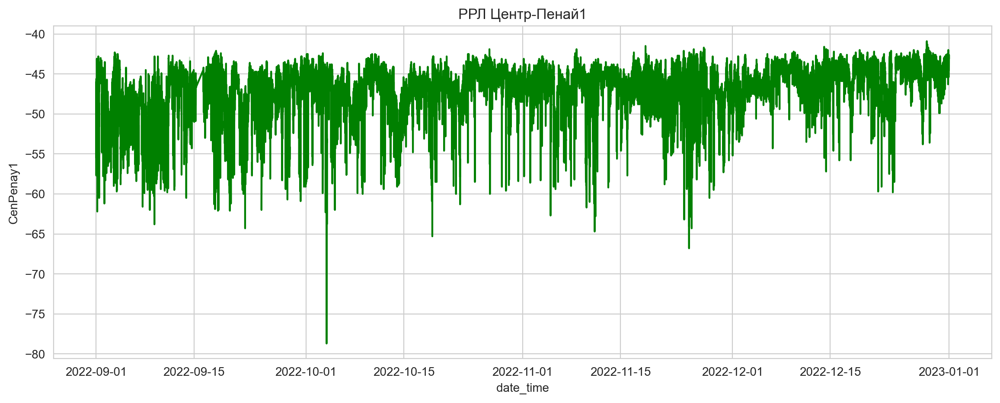

In [120]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenPenay1", data = df6 , legend = 'auto', color = 'g')\
                                                                  .set(title='РРЛ Центр-Пенай1');
plt.show()


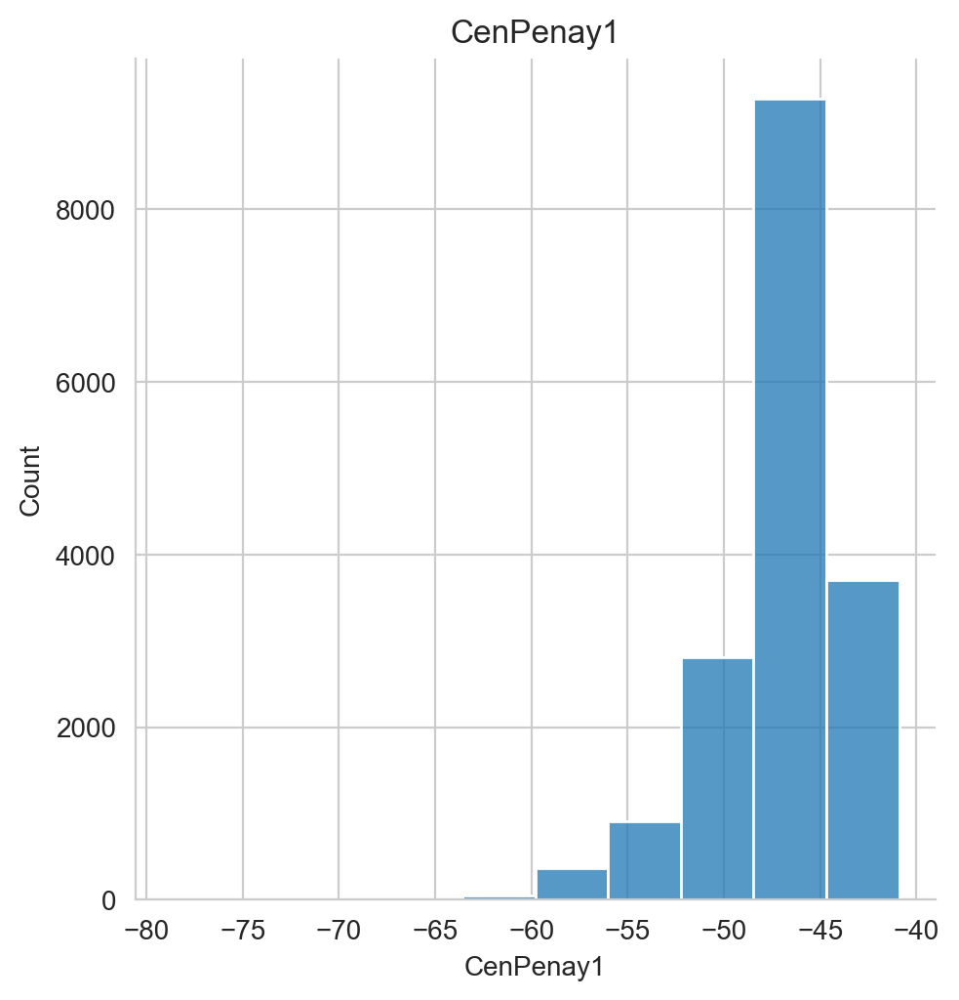

In [121]:
get_plot_dis(df=df6, n=0)

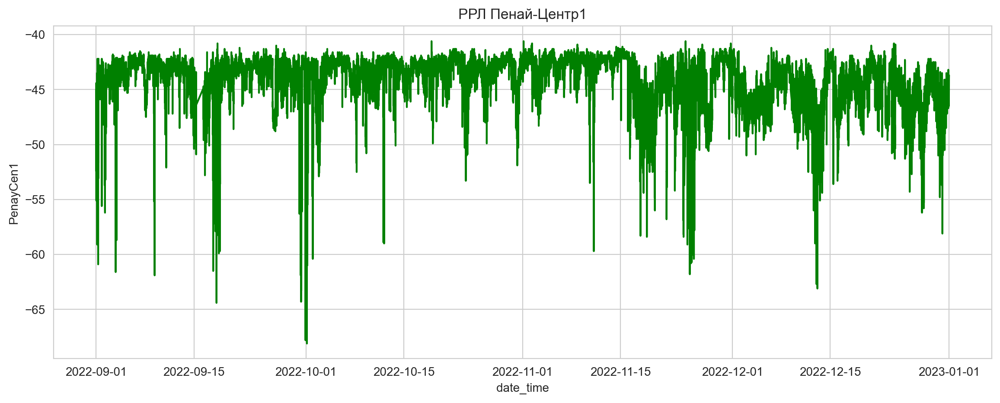

In [122]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "PenayCen1", data = df6 , legend = 'auto', color = 'g')\
                                                             .set(title='РРЛ Пенай-Центр1');
plt.show()


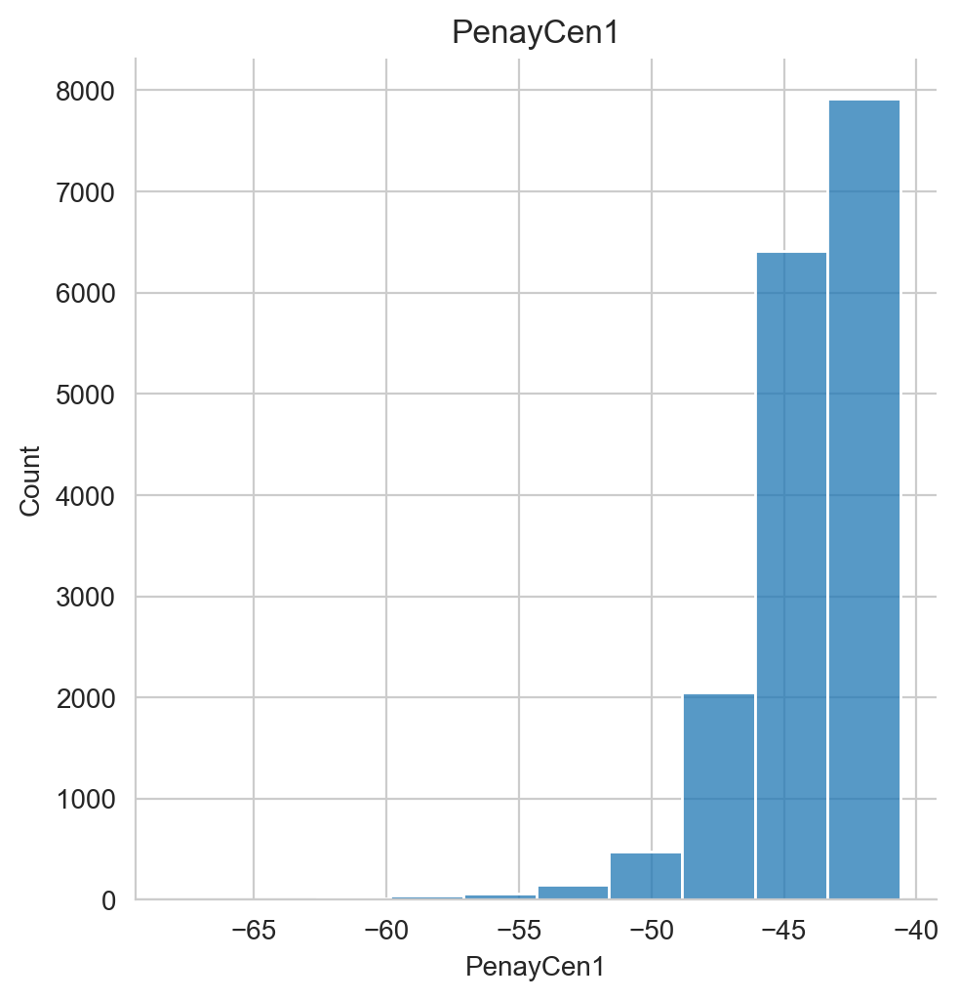

In [123]:
get_plot_dis(df=df6, n=1)

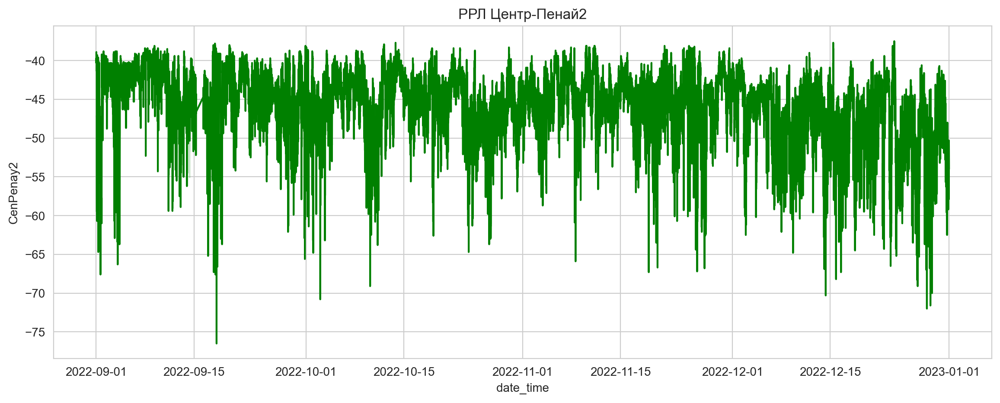

In [124]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenPenay2", data = df6 , legend = 'auto', color = 'g')\
                                                                .set(title='РРЛ Центр-Пенай2');
plt.show()


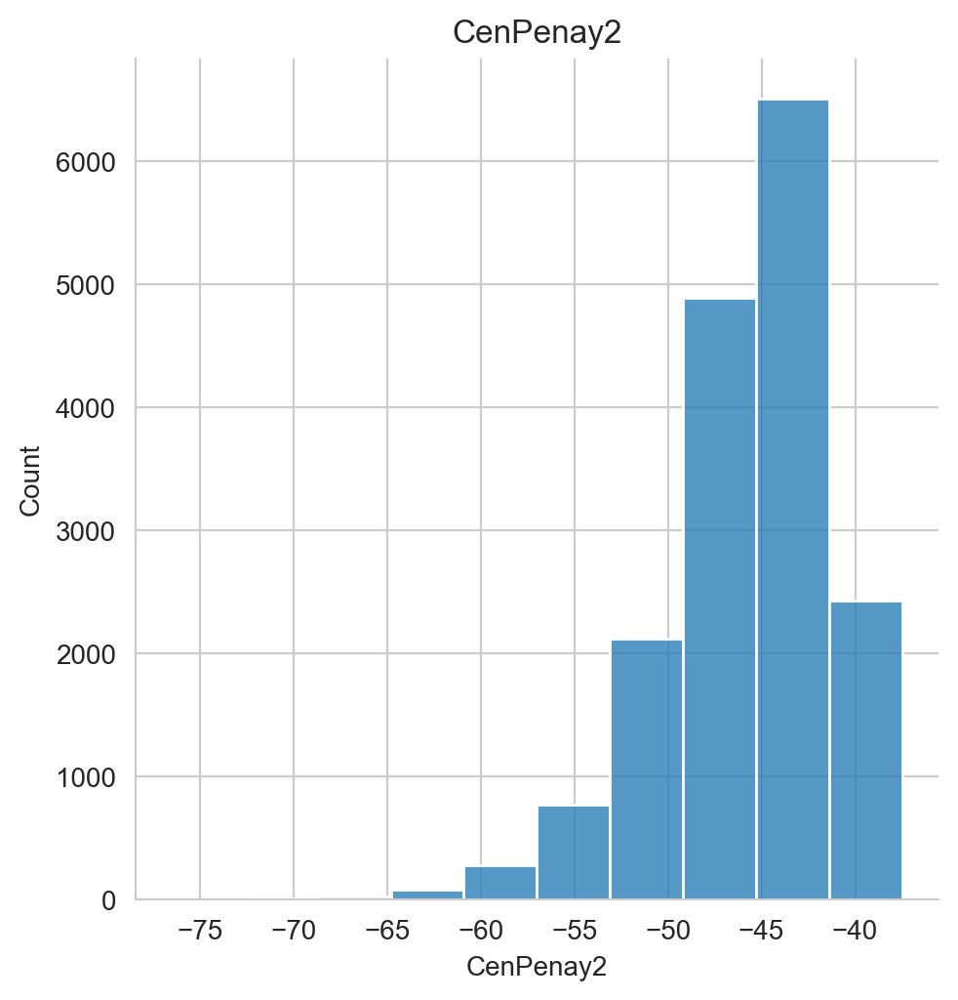

In [125]:
get_plot_dis(df=df6, n=2)

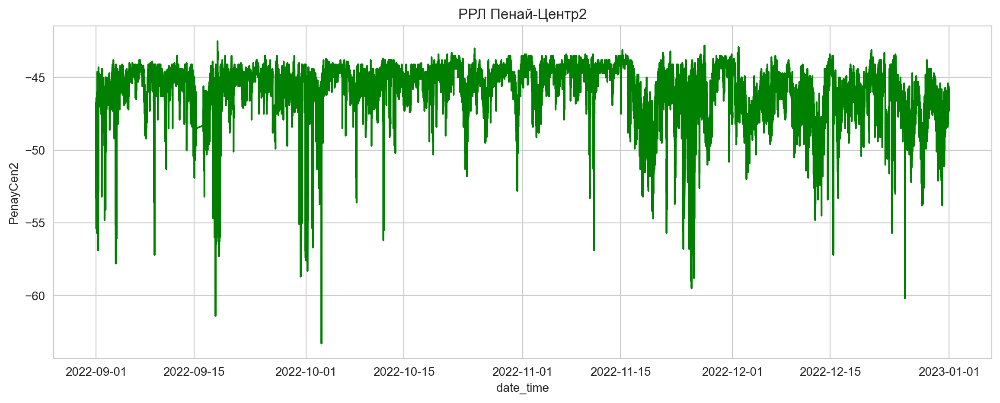

In [126]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "PenayCen2", data = df6 , legend = 'auto', color = 'g')\
                                                             .set(title='РРЛ Пенай-Центр2');
plt.show()


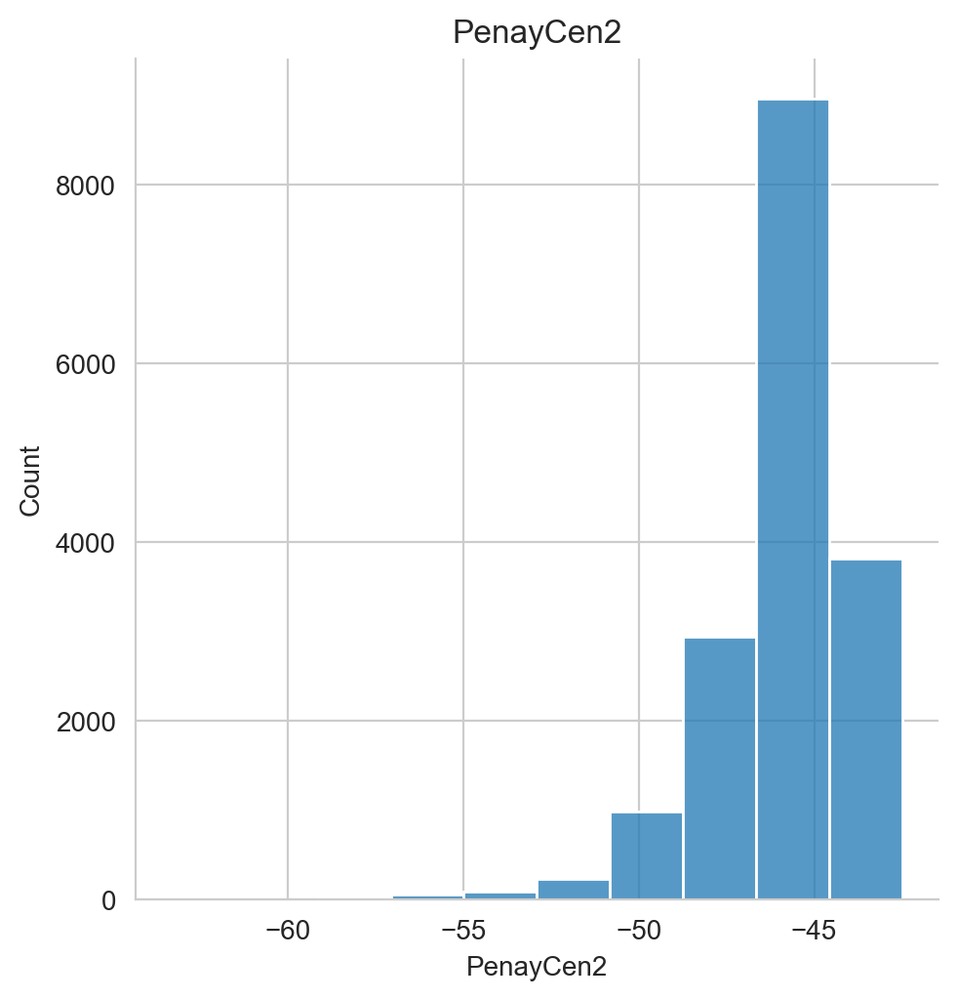

In [127]:
get_plot_dis(df=df6, n=3)

Критический уровень сигнала -58.0


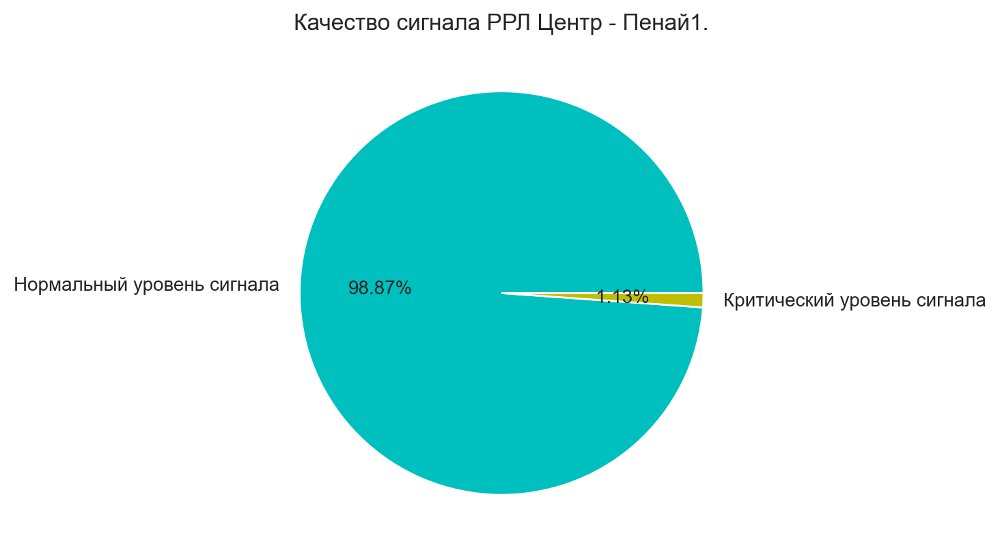

In [128]:
df6_1 = df6[df6['CenPenay1'] <= critical][['date_time','CenPenay1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df6)-len(df6_1)), len(df6_1)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Пенай1.');


Критический уровень сигнала -58.0


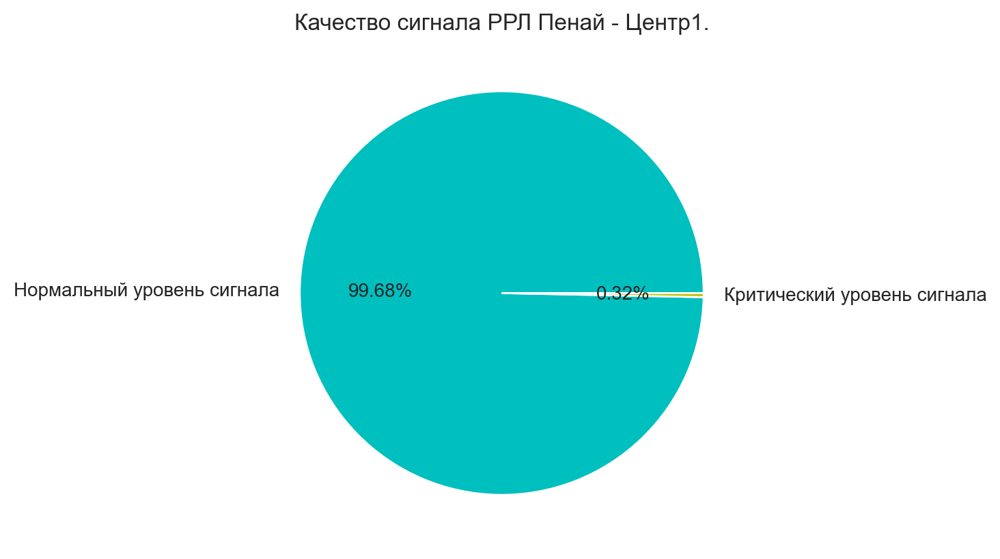

In [129]:
df6_2 = df6[df6['PenayCen1'] <= critical][['date_time','PenayCen1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df6)-len(df6_2)), len(df6_2)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Пенай - Центр1.');


Критический уровень сигнала -58.0


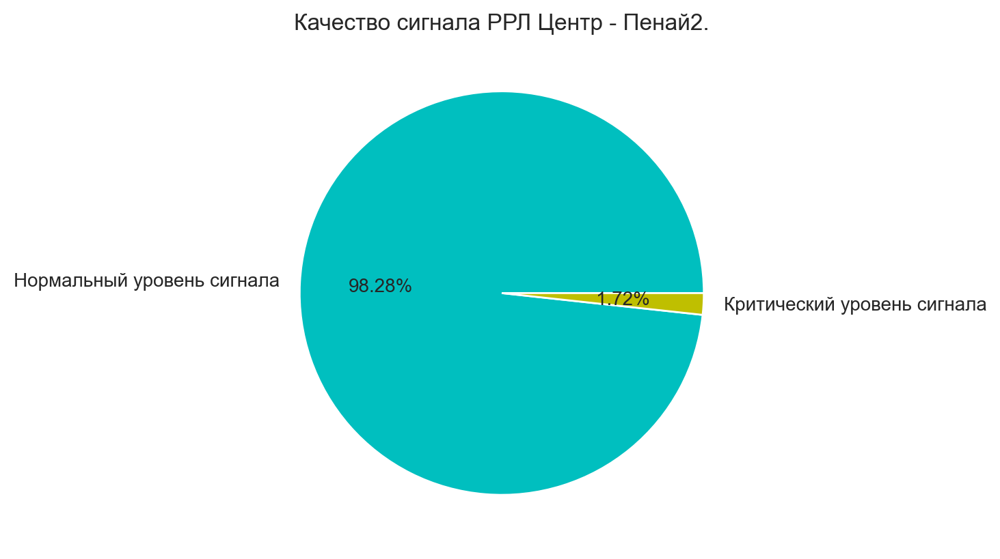

In [130]:
df6_3 = df6[df6['CenPenay2'] <= critical][['date_time','CenPenay2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df6)-len(df6_3)), len(df6_3)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Пенай2.');


Критический уровень сигнала -58.0


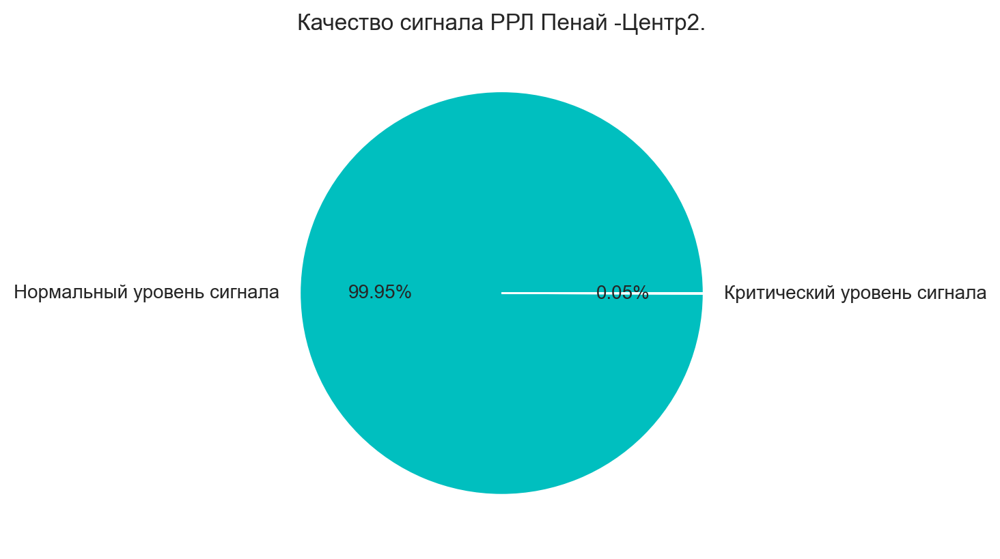

In [131]:
df6_4 = df6[df6['PenayCen2'] <= critical][['date_time','PenayCen2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df6)-len(df6_4)), len(df6_4)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Пенай -Центр2.');


## РРЛ Дооб 9, 10, 11, 12 месяцы 2022 год.

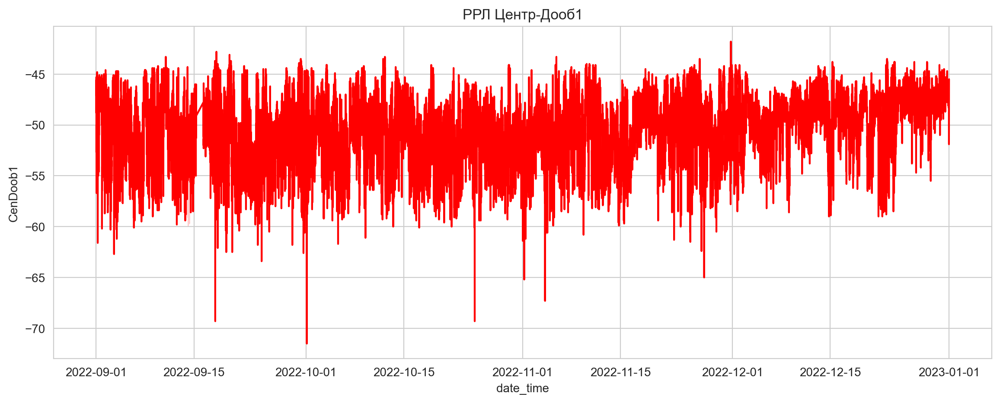

In [132]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenDoob1", data = df6 , legend = 'auto', color = 'r')\
                                                   .set(title='РРЛ Центр-Дооб1');

plt.show()


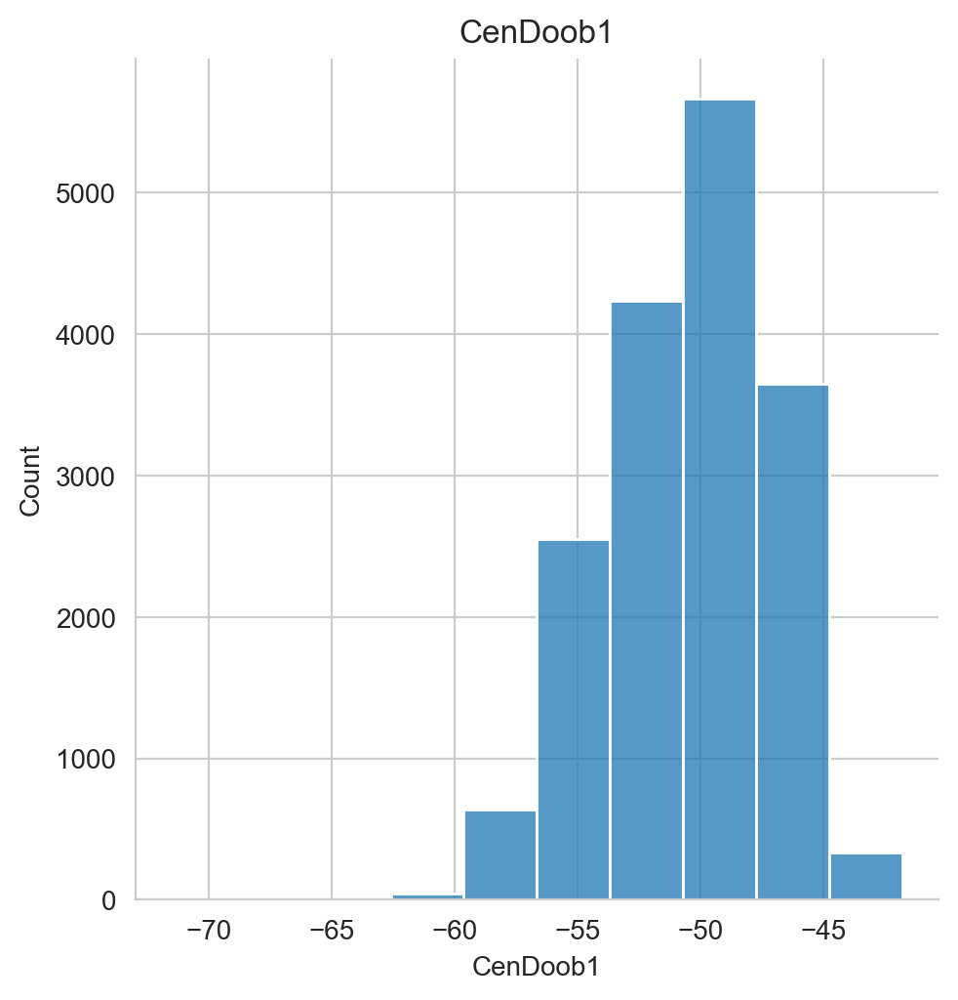

In [133]:
get_plot_dis(df=df6, n=4)

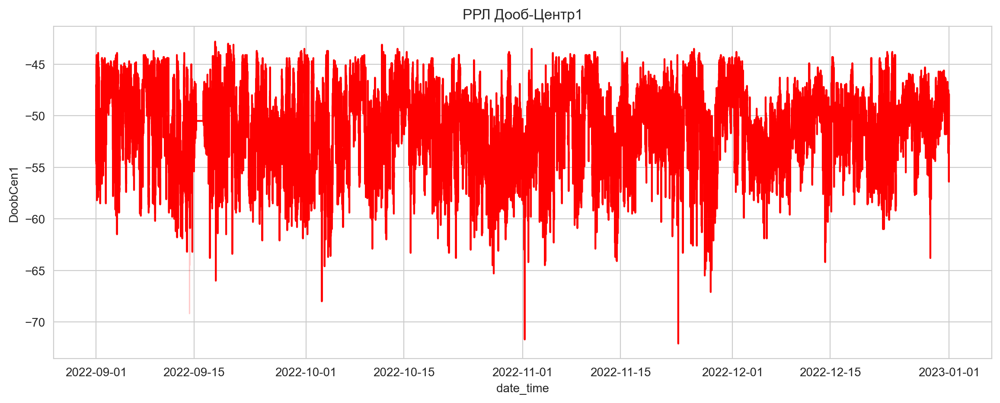

In [134]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "DoobCen1", data = df6 , legend = 'auto', color = 'r')\
                                                   .set(title='РРЛ Дооб-Центр1');
plt.show()


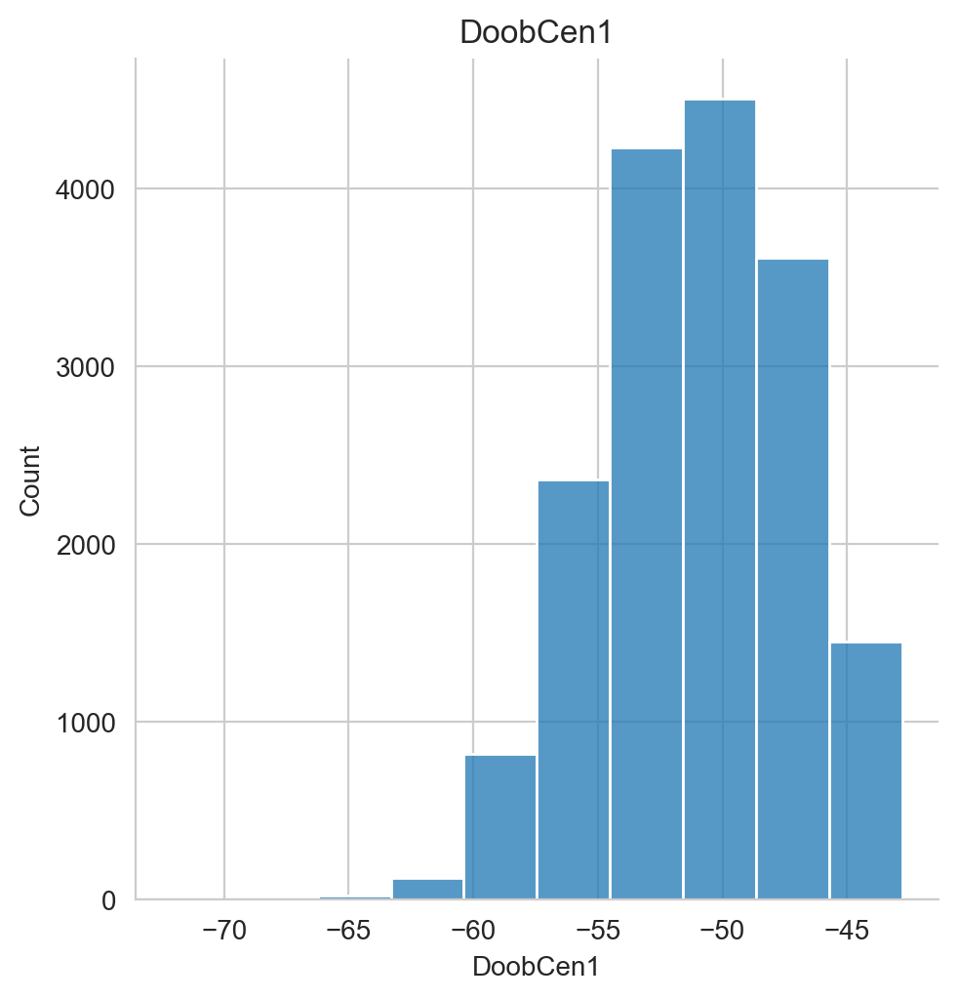

In [135]:
get_plot_dis(df=df6, n=5)

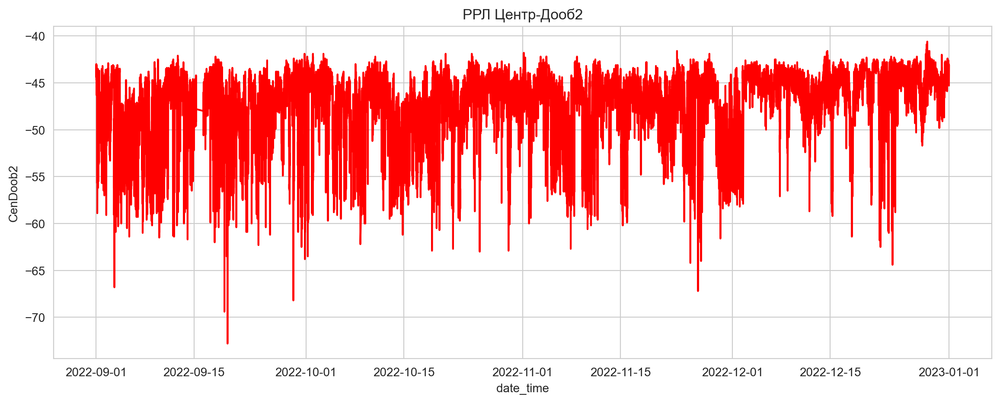

In [136]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenDoob2", data = df6 , legend = 'auto', color = 'r')\
                                                              .set(title='РРЛ Центр-Дооб2');
plt.show()


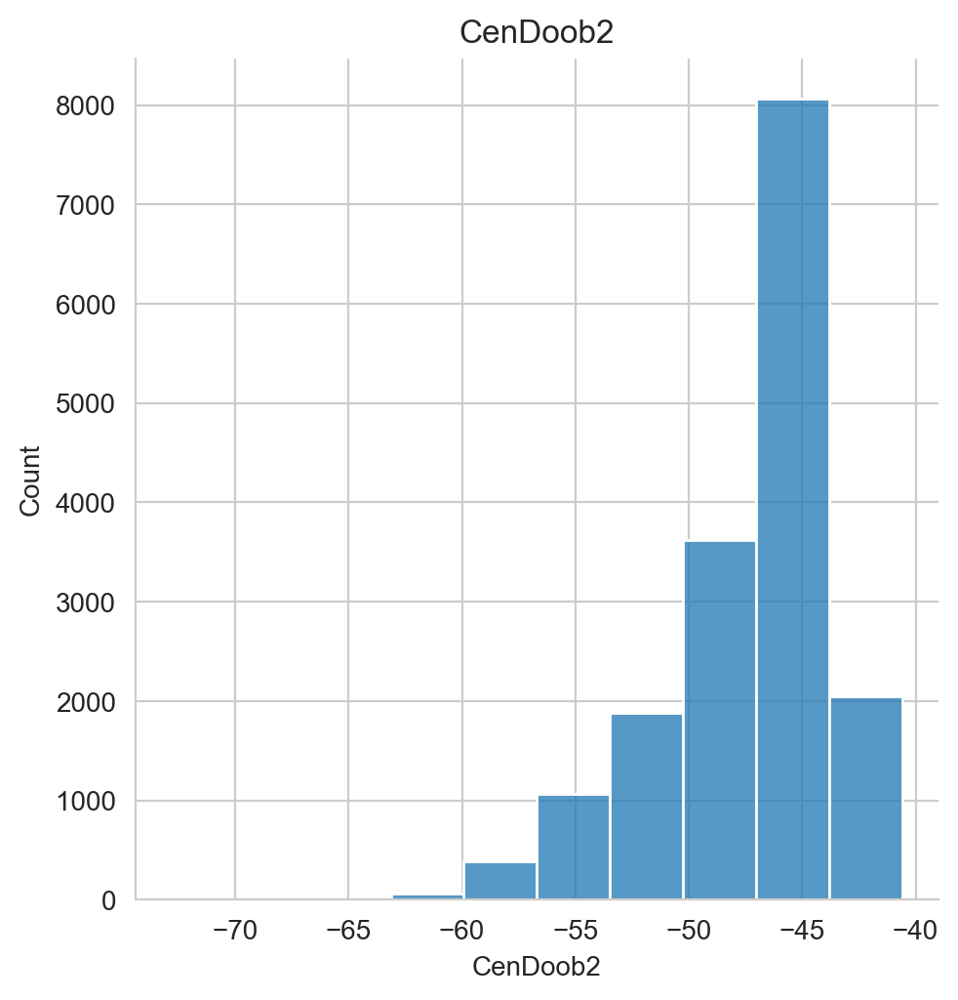

In [137]:
get_plot_dis(df=df6, n=6)

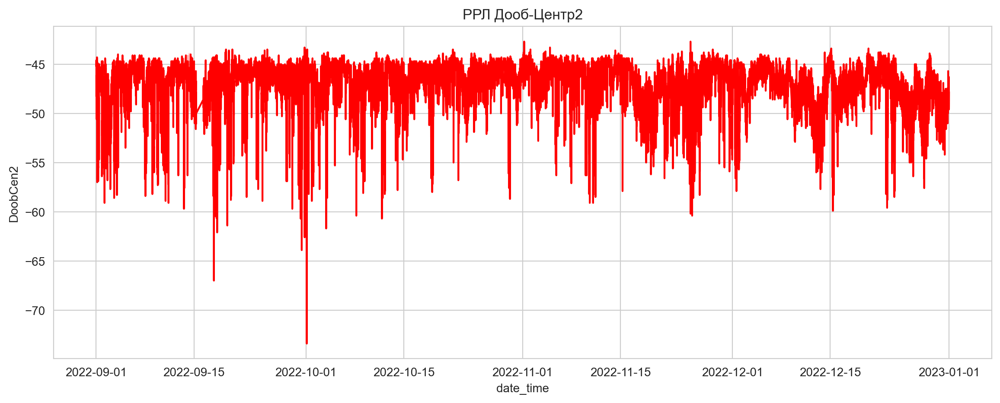

In [138]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "DoobCen2", data = df6 , legend = 'auto', color = 'r')\
                                                              .set(title='РРЛ Дооб-Центр2');
plt.show()


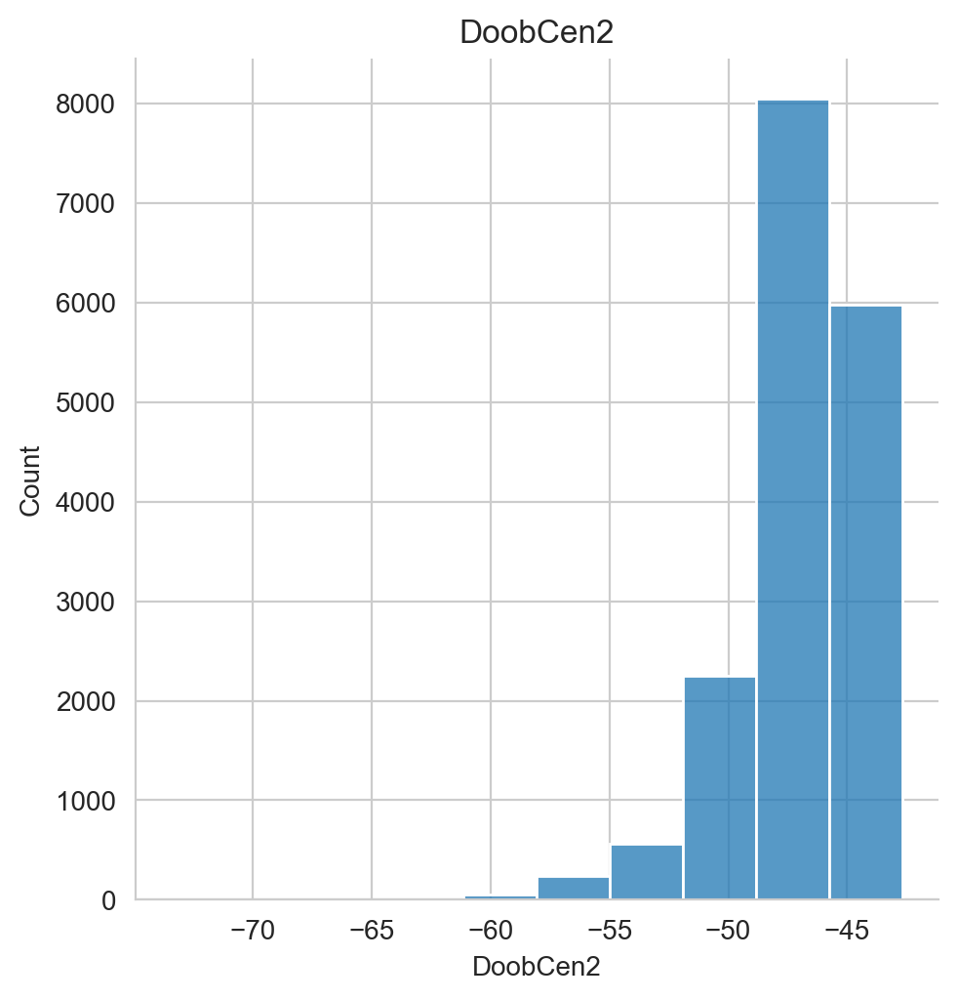

In [139]:
get_plot_dis(df=df6, n=7)

Критический уровень сигнала -58.0


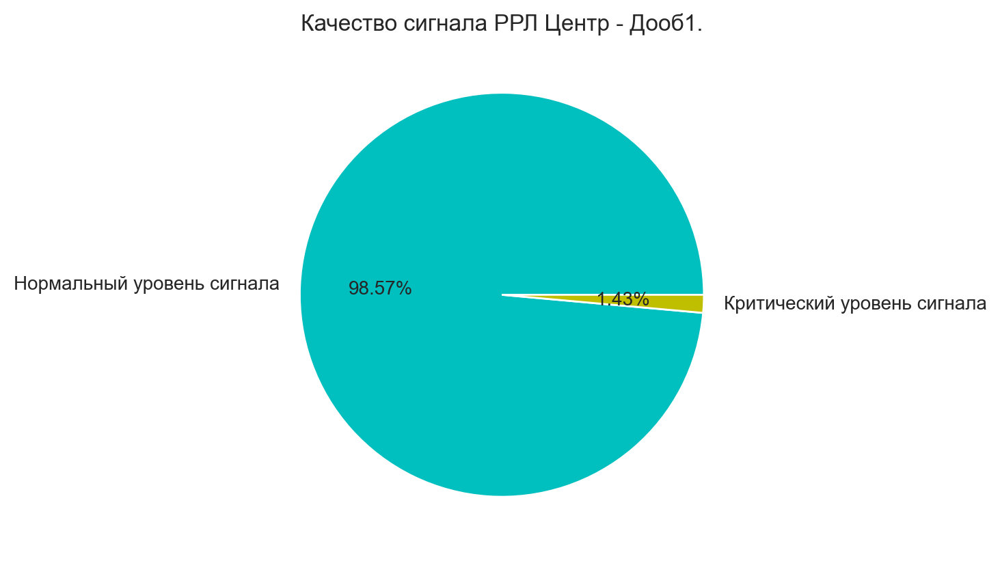

In [140]:
df6_5 = df6[df6['CenDoob1'] <= critical][['date_time','CenDoob1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df6)-len(df6_5)), len(df6_5)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Дооб1.');


Критический уровень сигнала -58.0


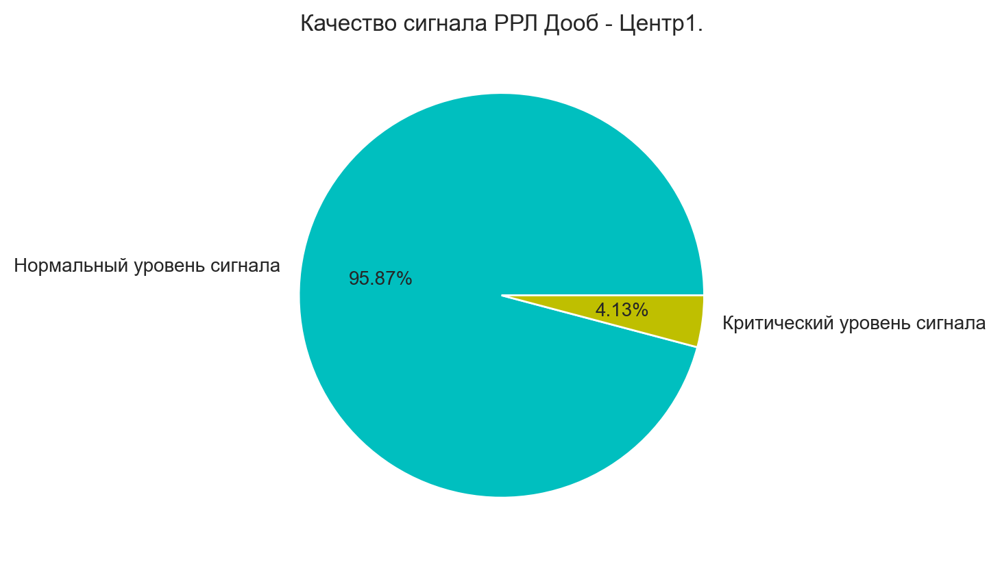

In [141]:
df6_6 = df6[df6['DoobCen1'] <= critical][['date_time','DoobCen1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df6)-len(df6_6)), len(df6_6)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Дооб - Центр1.');


Критический уровень сигнала -58.0


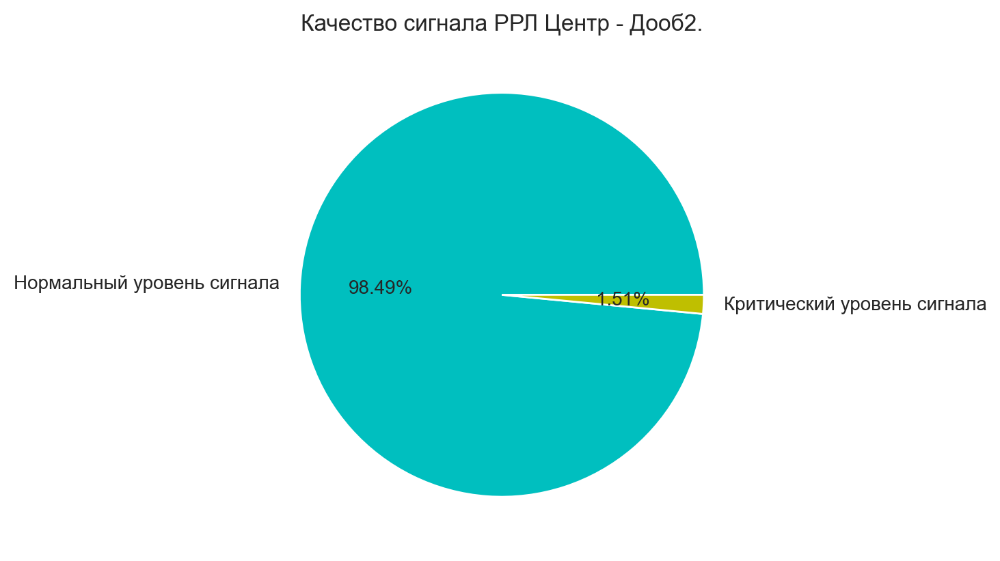

In [142]:
df6_7 = df6[df6['CenDoob2'] <= critical][['date_time','CenDoob2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df6)-len(df6_7)), len(df6_7)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Дооб2.');


Критический уровень сигнала -58.0


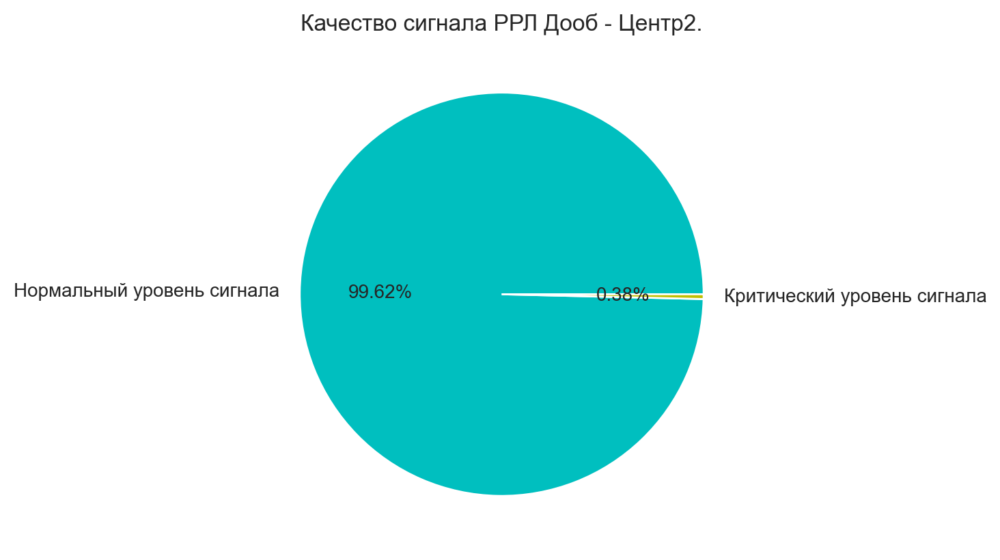

In [143]:
df6_8 = df6[df6['DoobCen2'] <= critical][['date_time','DoobCen2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df6)-len(df6_8)), len(df6_8)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Дооб - Центр2.');


## Теплое время года - 4 месяца 2022 год.

In [144]:
df5


,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2,month
112815,2022-01-01 00:05:00,-49.5,-43.3,-46.6,-49.2,-44.7,-50.8,-43.4,-46.4,1
112816,2022-01-01 00:15:00,-47.9,-43.1,-45.7,-52.1,-43.9,-57.3,-44.1,-45.6,1
112817,2022-01-01 00:25:00,-48.0,-43.4,-45.2,-52.0,-43.1,-58.6,-44.0,-46.0,1
112818,2022-01-01 00:35:00,-51.0,-43.8,-46.6,-50.3,-43.4,-55.3,-44.1,-46.2,1
112819,2022-01-01 00:45:00,-47.8,-43.5,-45.3,-51.0,-43.0,-60.4,-44.1,-46.6,1
...,...,...,...,...,...,...,...,...,...,...
163756,2022-12-31 23:15:00,-46.4,-43.4,-54.4,-47.7,-43.7,-57.9,-44.6,-47.0,12
163757,2022-12-31 23:25:00,-51.8,-45.3,-56.4,-46.3,-44.2,-50.3,-46.5,-47.3,12
163758,2022-12-31 23:35:00,-51.9,-45.0,-51.5,-49.6,-44.5,-50.9,-44.6,-46.9,12
163759,2022-12-31 23:45:00,-47.4,-43.5,-47.9,-49.1,-42.6,-53.8,-44.0,-46.3,12


In [145]:
df7 = df5[(df5['month']== 5) | 
          (df5['month']== 6) | 
          (df5['month']== 7) |
          (df5['month']== 8)][['date_time', 
                                'CenDoob1','CenDoob2',
                                'DoobCen1', 'DoobCen2',
                                'CenPenay1', 'CenPenay2',
                                'PenayCen1', 'PenayCen2']]
df7


,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2
129606,2022-05-01 00:00:00,-47.5,-54.1,-44.7,-54.1,-44.5,-48.5,-48.1,-48.4
129607,2022-05-01 00:10:00,-46.8,-53.2,-46.2,-55.5,-43.8,-45.7,-46.6,-48.6
129608,2022-05-01 00:20:00,-46.2,-53.8,-46.5,-54.5,-43.6,-47.8,-49.1,-49.0
129609,2022-05-01 00:30:00,-47.7,-48.8,-45.3,-51.0,-43.4,-47.8,-47.2,-47.9
129610,2022-05-01 00:40:00,-47.5,-52.7,-46.1,-54.7,-43.5,-50.0,-46.7,-48.4
...,...,...,...,...,...,...,...,...,...
146622,2022-08-31 23:10:00,-47.2,-58.4,-46.3,-50.2,-51.5,-41.9,-42.9,-45.3
146623,2022-08-31 23:20:00,-52.3,-53.2,-45.0,-56.5,-54.8,-40.3,-43.3,-45.0
146624,2022-08-31 23:30:00,-48.2,-58.1,-46.0,-52.9,-57.6,-40.0,-42.8,-45.6
146625,2022-08-31 23:40:00,-52.0,-53.5,-45.0,-60.2,-50.3,-38.7,-47.8,-49.4


In [146]:
df7.to_csv('MiniLink_out_2022_4_hot_month.csv', index=False) # за 2022 год


In [147]:
pd.set_option("display.precision", 1)
np.set_printoptions(precision=1)
df7.agg([np.mean, np.median, np.min, np.max])


,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2
mean,2022-07-01 05:24:02.372363520,-49.2,-48.4,-49.9,-48.5,-47.3,-47.0,-44.9,-46.6
median,2022-07-01 02:40:00.000000000,-48.1,-47.2,-49.1,-47.2,-45.6,-45.7,-44.0,-46.0
amin,2022-05-01 00:00:00.000000000,-80.0,-88.6,-70.2,-70.6,-91.7,-90.5,-77.4,-73.5
amax,2022-08-31 23:50:00.000000000,-41.6,-40.0,-42.0,-41.2,-41.3,-36.6,-39.7,-41.6


## РРЛ Пенай 5, 6, 7, 8 месяцы 2022 год.

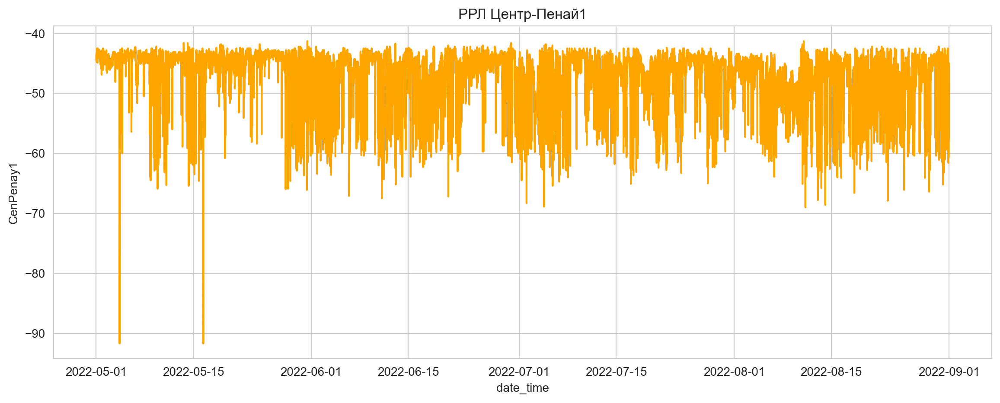

In [148]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenPenay1", data = df7 , legend = 'auto', color = '#FFA500')\
                                                                  .set(title='РРЛ Центр-Пенай1');
plt.show()


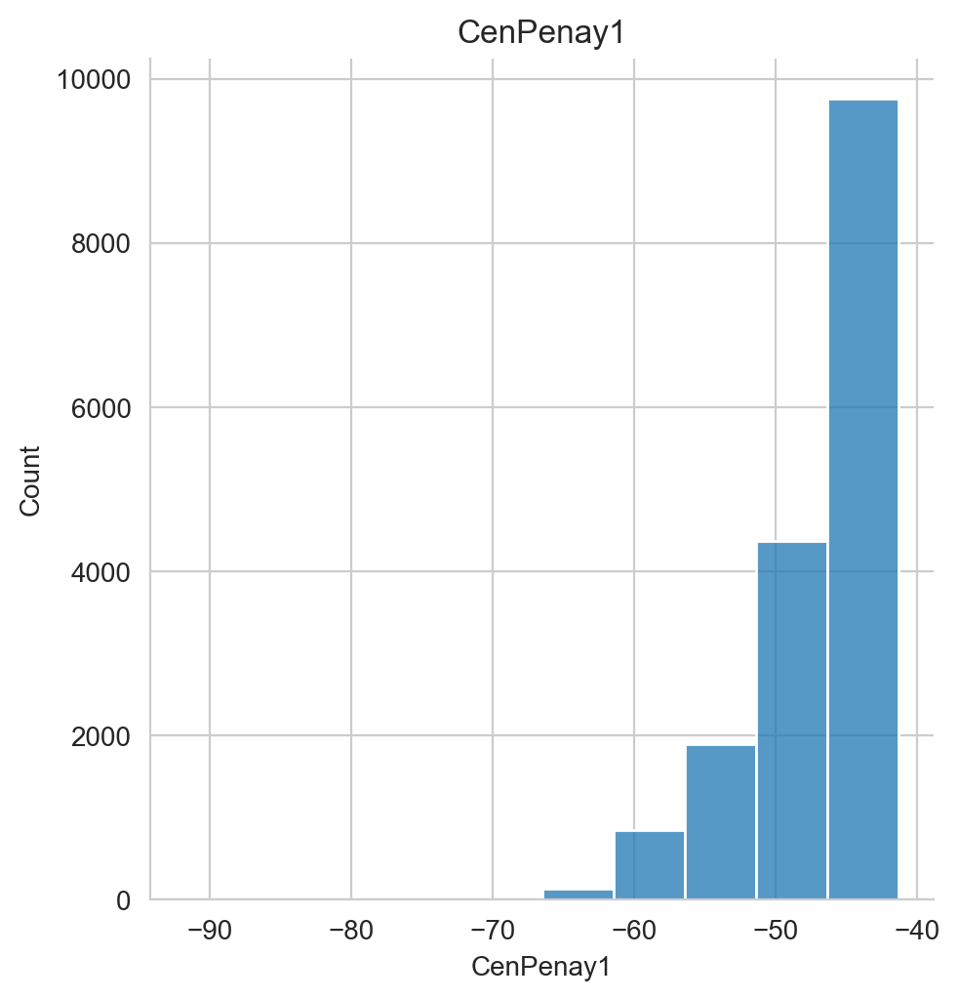

In [149]:
get_plot_dis(df=df7, n=0)

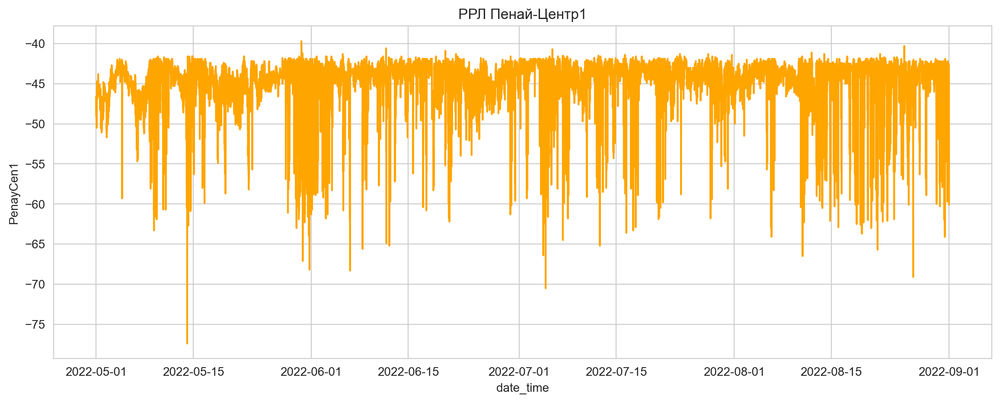

In [150]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "PenayCen1", data = df7 , legend = 'auto', color = '#FFA500')\
                                                             .set(title='РРЛ Пенай-Центр1');
plt.show()


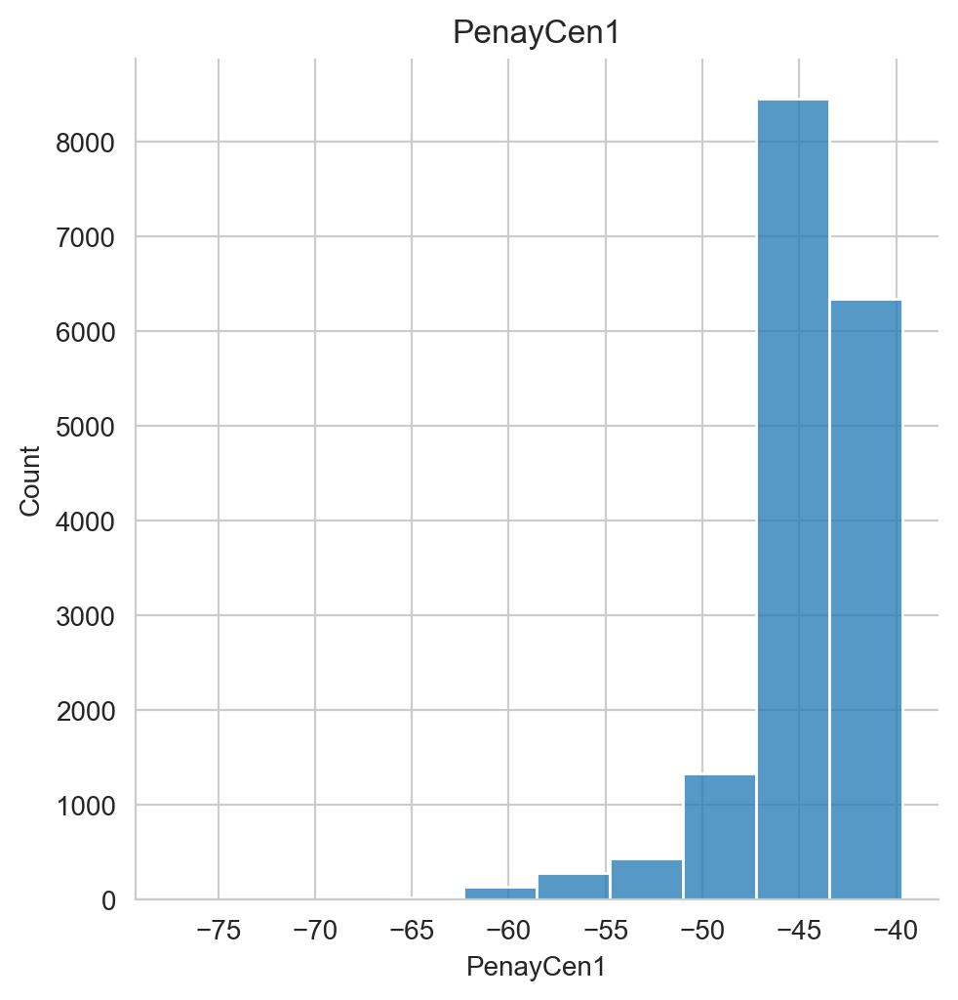

In [151]:
get_plot_dis(df=df7, n=1)

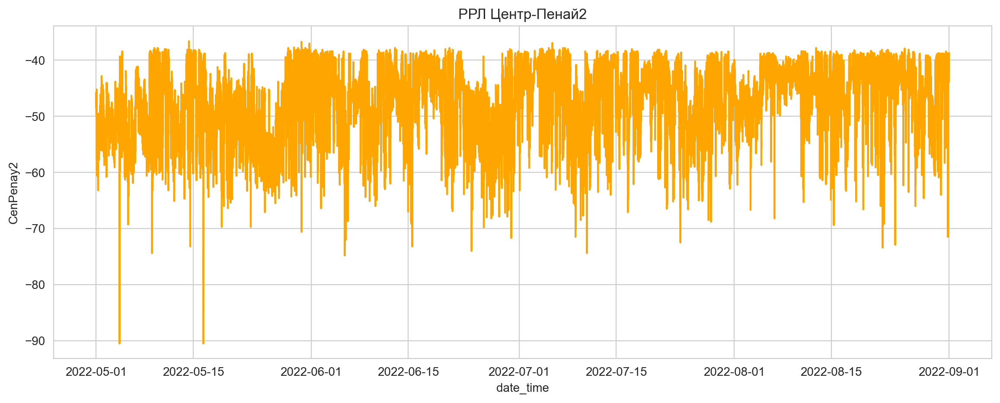

In [152]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenPenay2", data = df7 , legend = 'auto', color = '#FFA500')\
                                                                .set(title='РРЛ Центр-Пенай2');
plt.show()


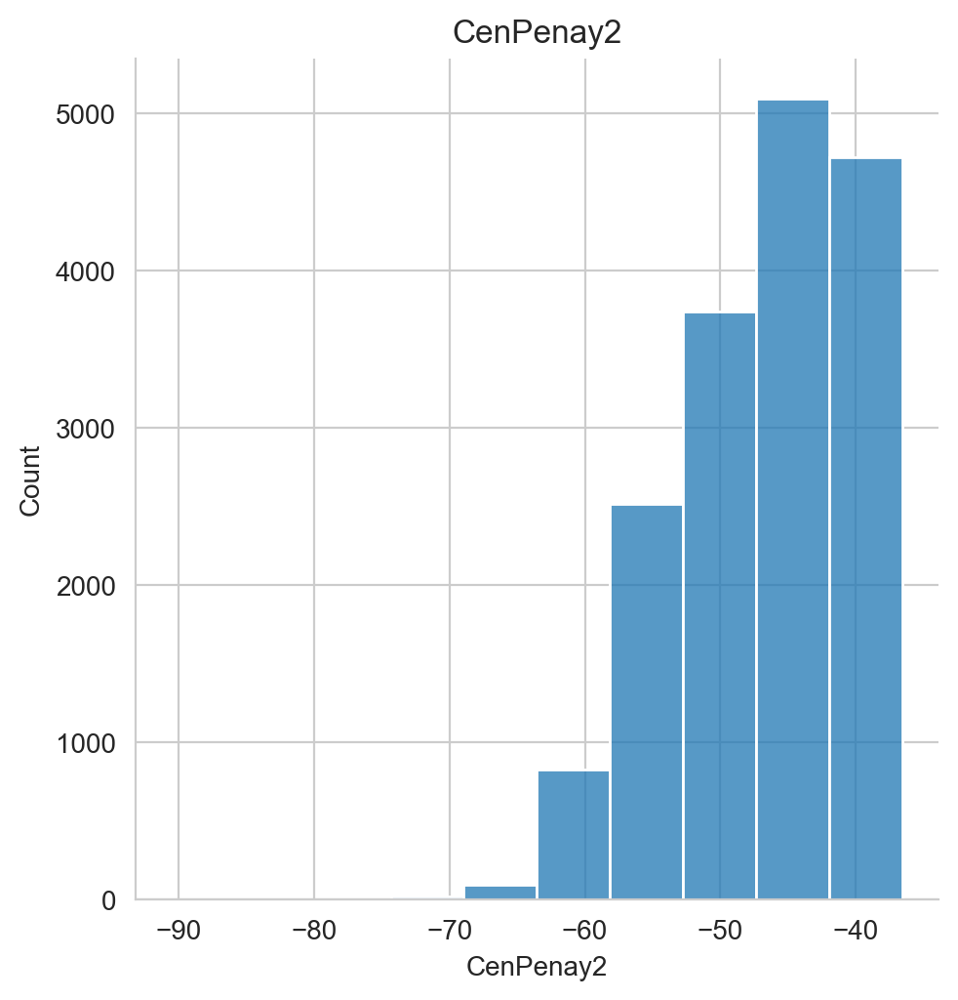

In [153]:
get_plot_dis(df=df7, n=2)

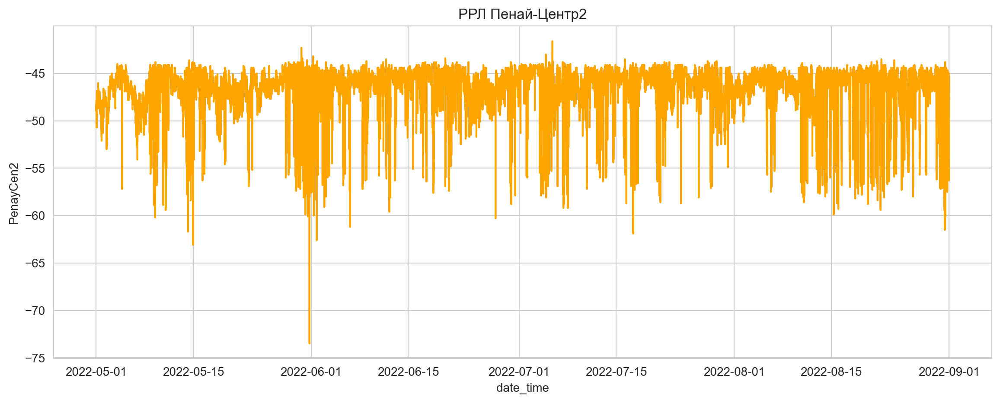

In [154]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "PenayCen2", data = df7 , legend = 'auto', color = '#FFA500')\
                                                             .set(title='РРЛ Пенай-Центр2');
plt.show()


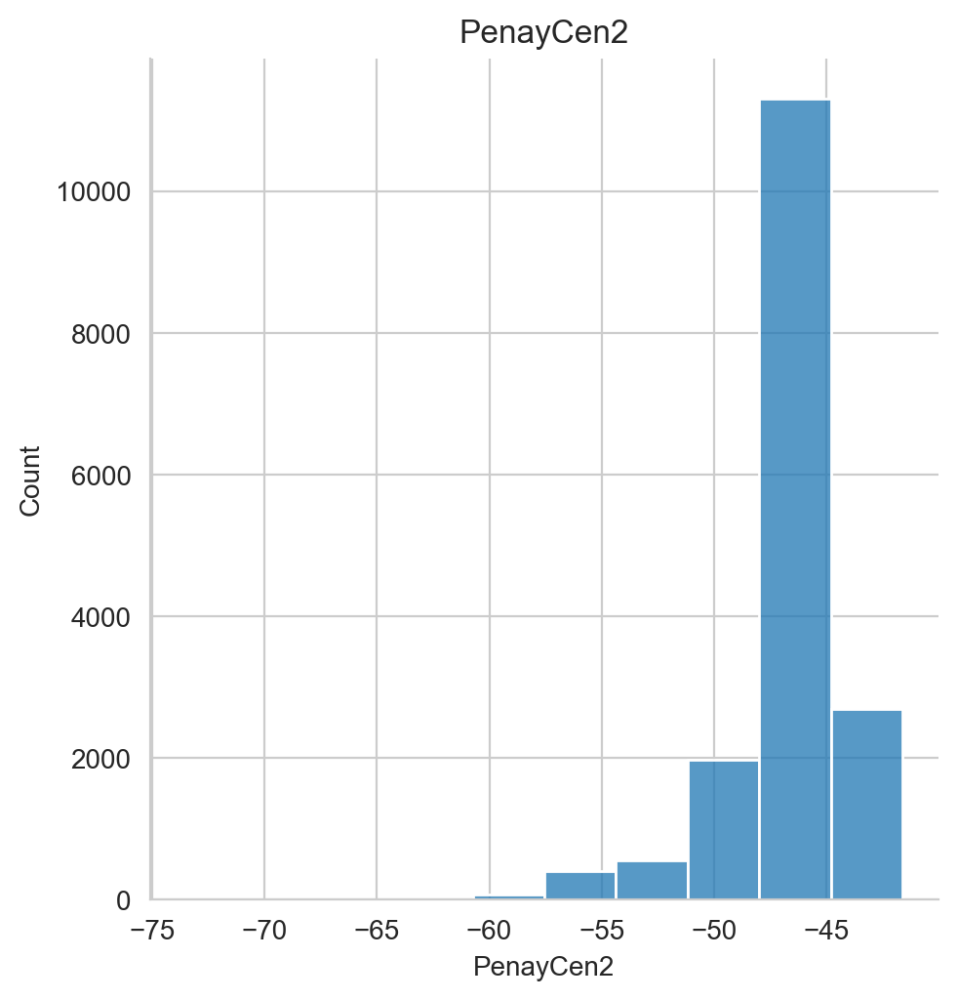

In [155]:
get_plot_dis(df=df7, n=3)

Критический уровень сигнала -58.0


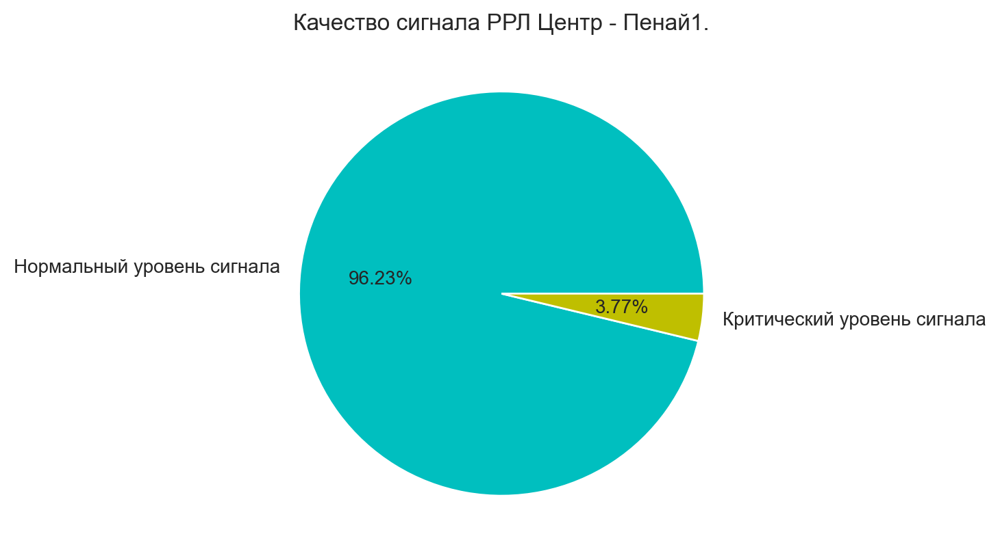

In [156]:
df7_1 = df7[df7['CenPenay1'] <= critical][['date_time','CenPenay1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df7)-len(df7_1)), len(df7_1)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Пенай1.');


Критический уровень сигнала -58.0


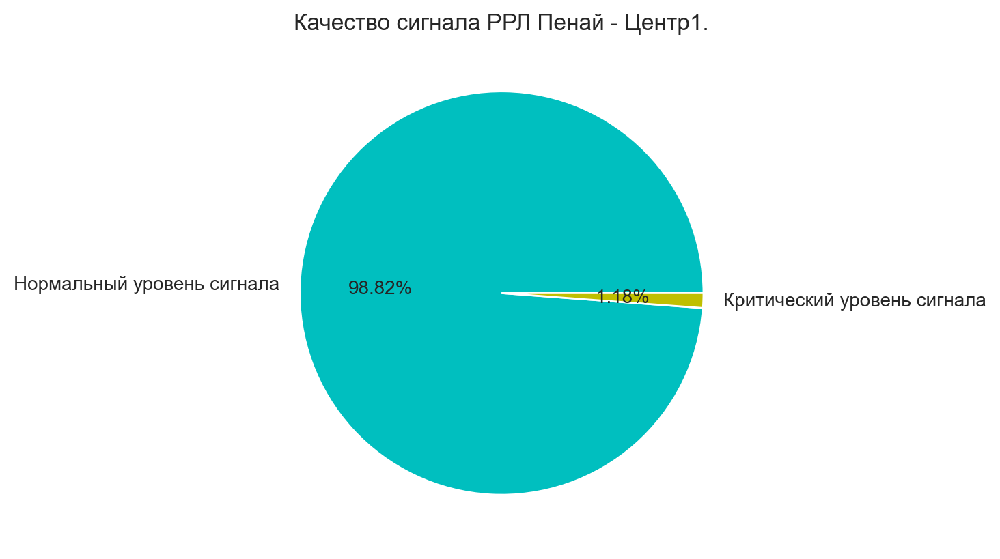

In [157]:
df7_2 = df7[df7['PenayCen1'] <= critical][['date_time','PenayCen1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df7)-len(df7_2)), len(df7_2)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Пенай - Центр1.');


Критический уровень сигнала -58.0


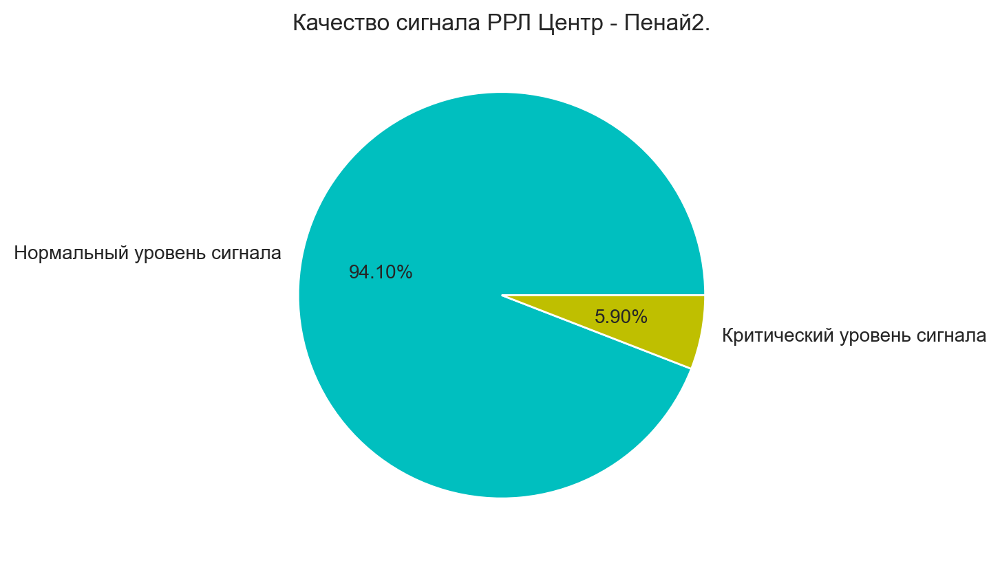

In [158]:
df7_3 = df7[df7['CenPenay2'] <= critical][['date_time','CenPenay2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df7)-len(df7_3)), len(df7_3)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Пенай2.');


Критический уровень сигнала -58.0


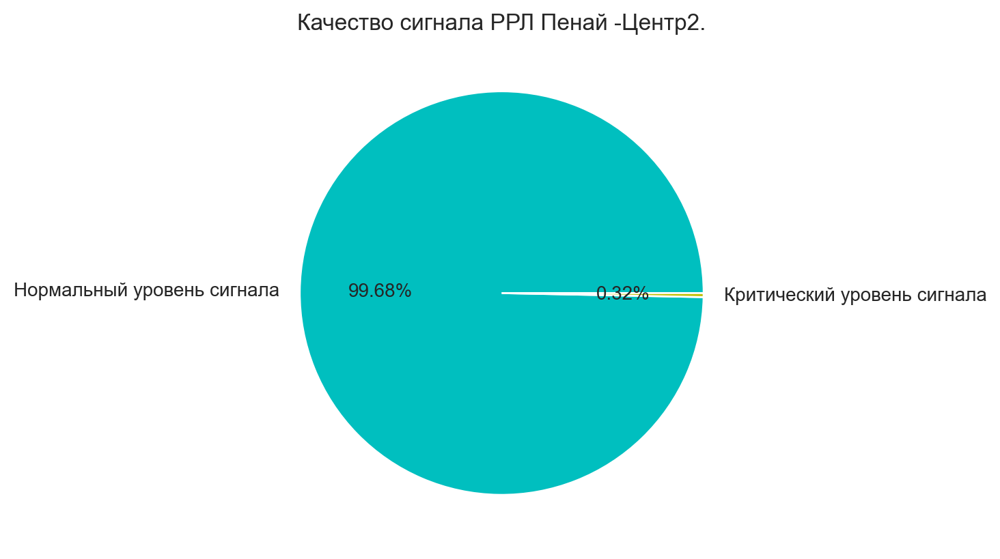

In [159]:
df7_4 = df7[df7['PenayCen2'] <= critical][['date_time','PenayCen2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df7)-len(df7_4)), len(df7_4)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Пенай -Центр2.');


## РРЛ Дооб 5, 6, 7, 8 месяцы 2022 год.

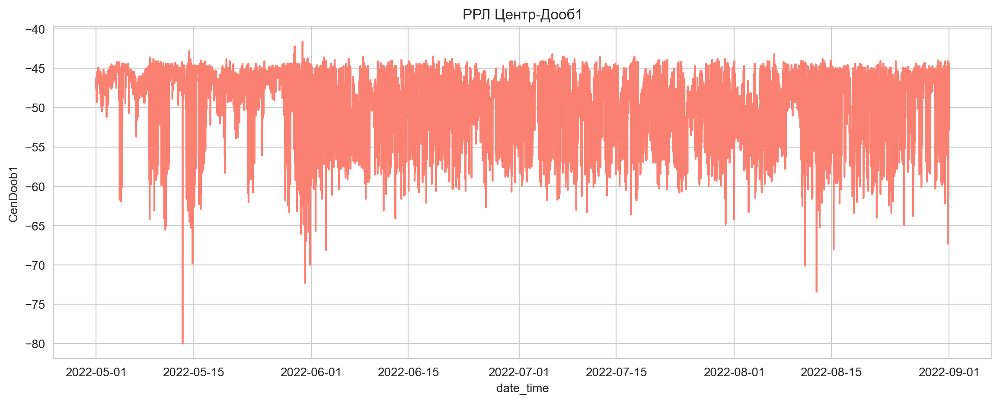

In [160]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenDoob1", data = df7 , legend = 'auto', color = 'salmon')\
                                                   .set(title='РРЛ Центр-Дооб1');

plt.show()


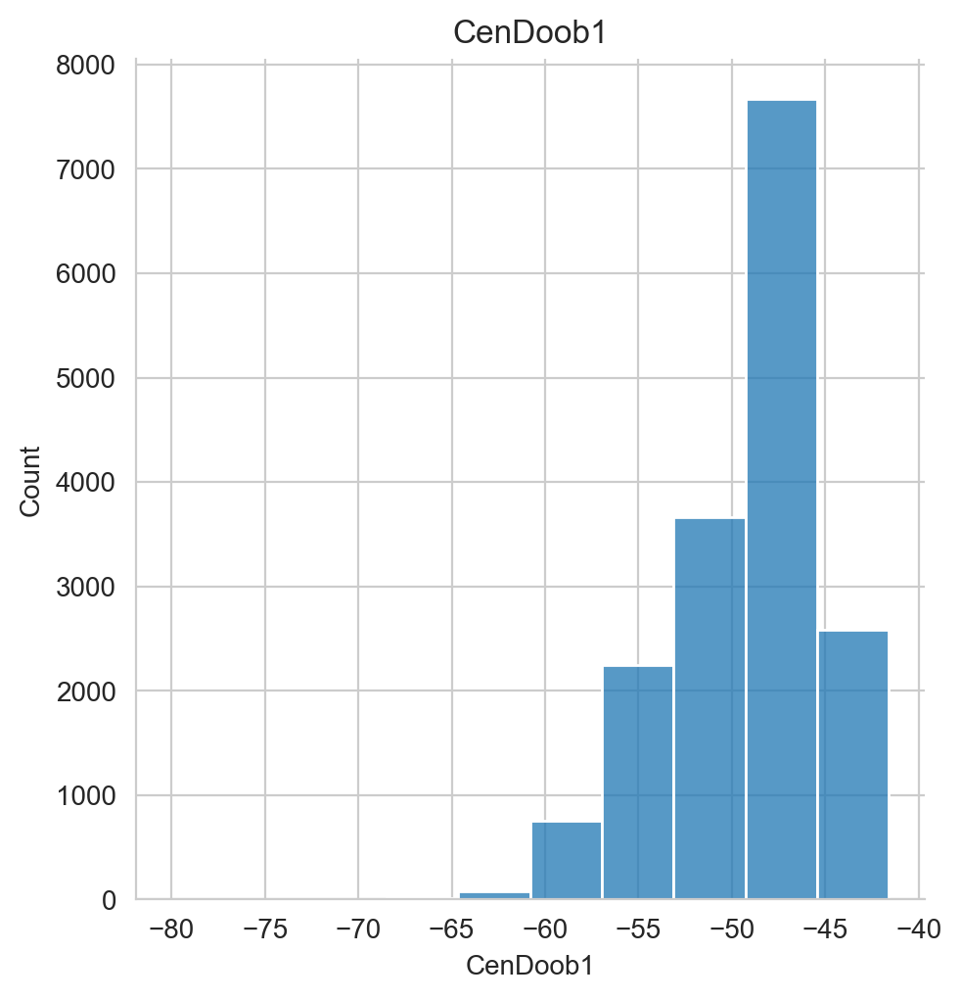

In [161]:
get_plot_dis(df=df7, n=4)

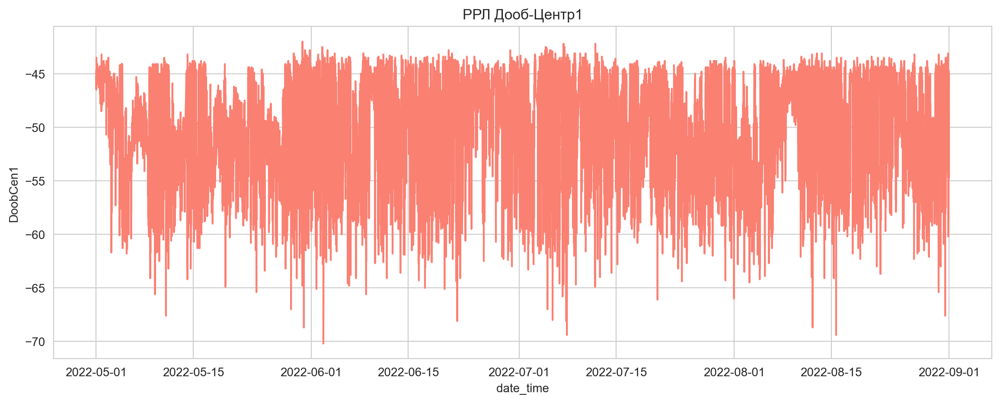

In [162]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "DoobCen1", data = df7 , legend = 'auto', color = 'salmon')\
                                                   .set(title='РРЛ Дооб-Центр1');
plt.show()


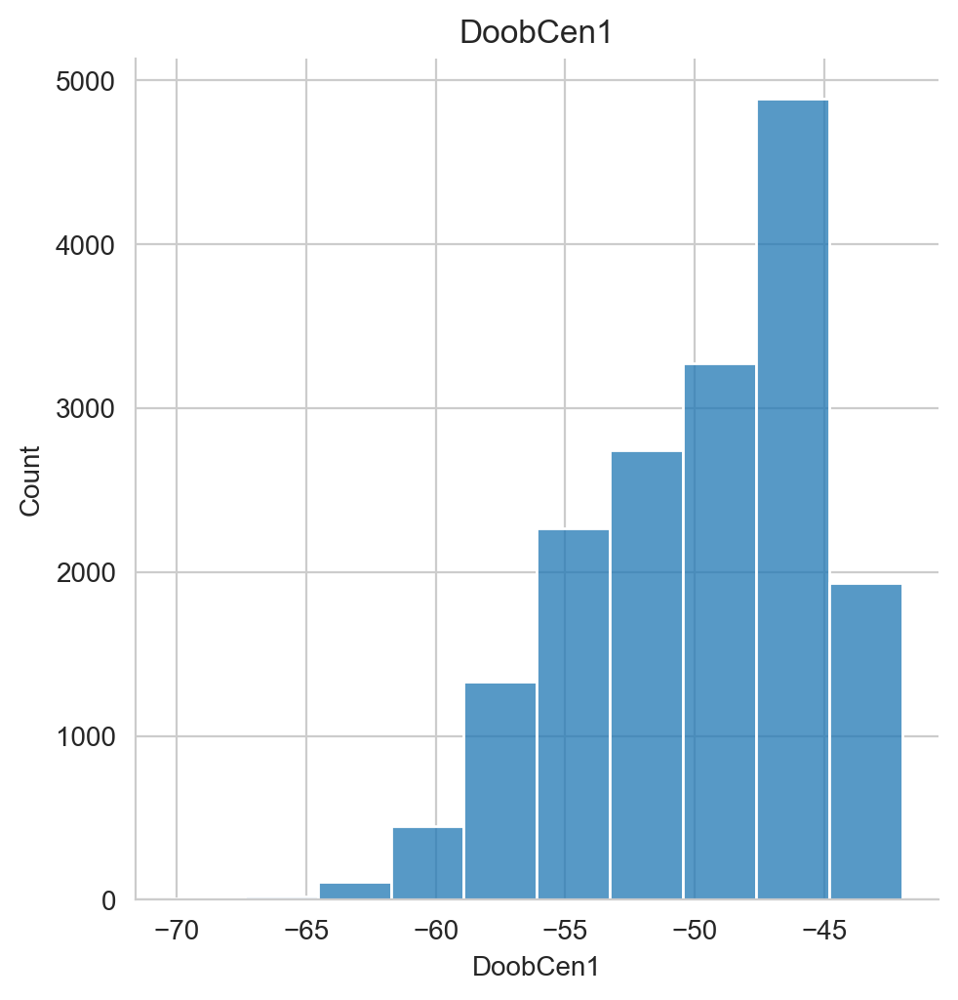

In [163]:
get_plot_dis(df=df7, n=5)

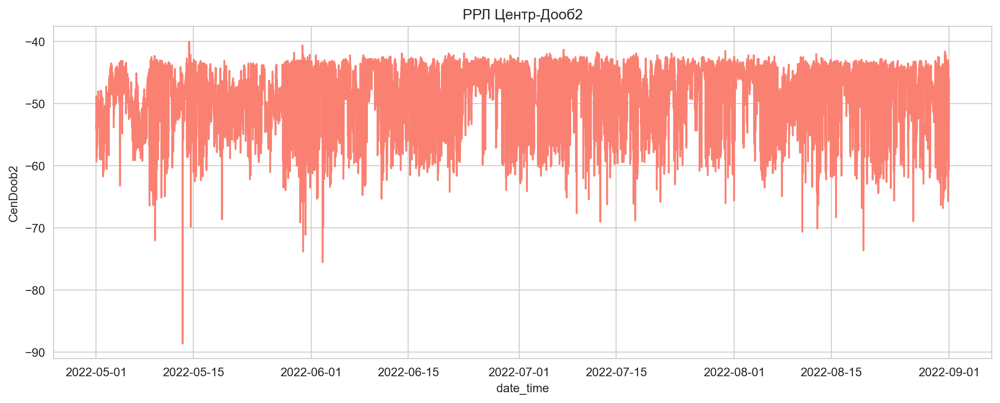

In [164]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenDoob2", data = df7 , legend = 'auto', color = 'salmon')\
                                                              .set(title='РРЛ Центр-Дооб2');
plt.show()


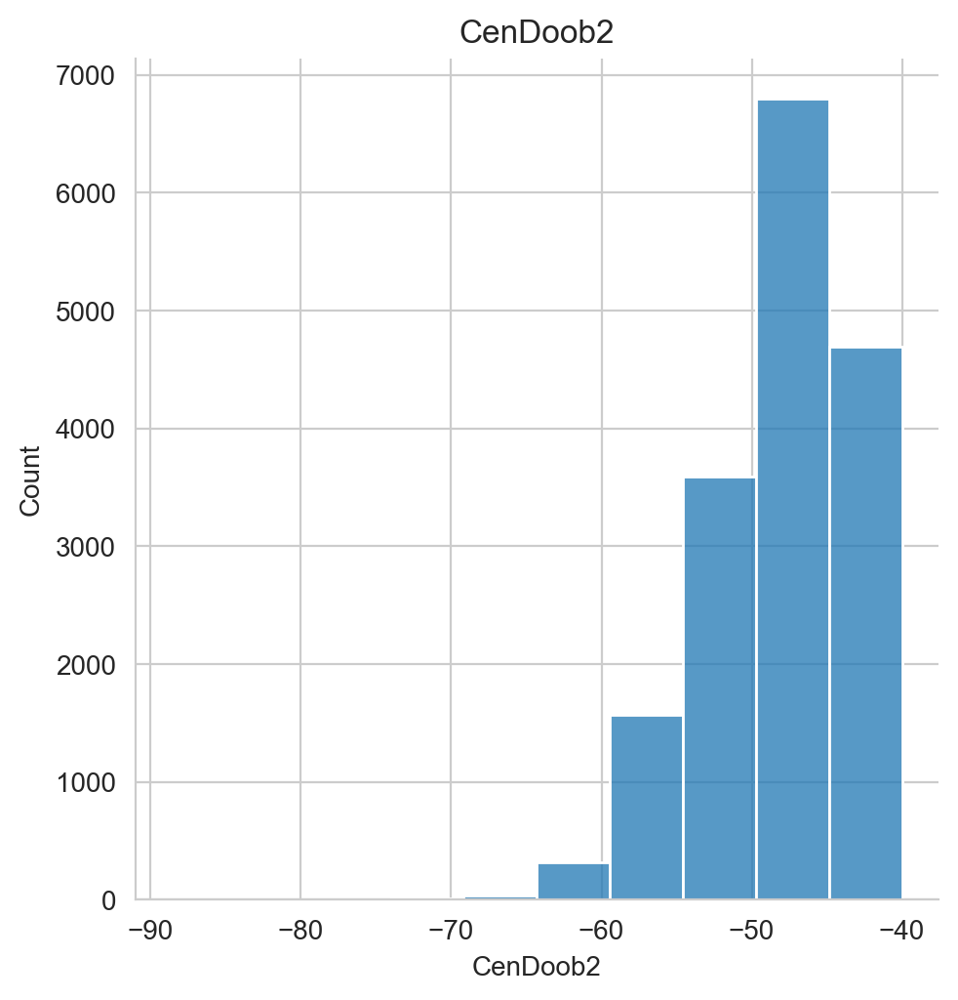

In [165]:
get_plot_dis(df=df7, n=6)

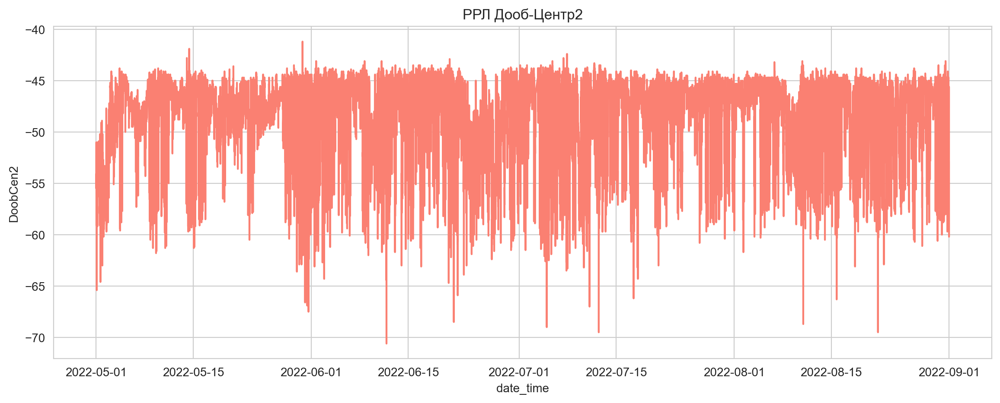

In [166]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "DoobCen2", data = df7 , legend = 'auto', color = 'salmon')\
                                                              .set(title='РРЛ Дооб-Центр2');
plt.show()


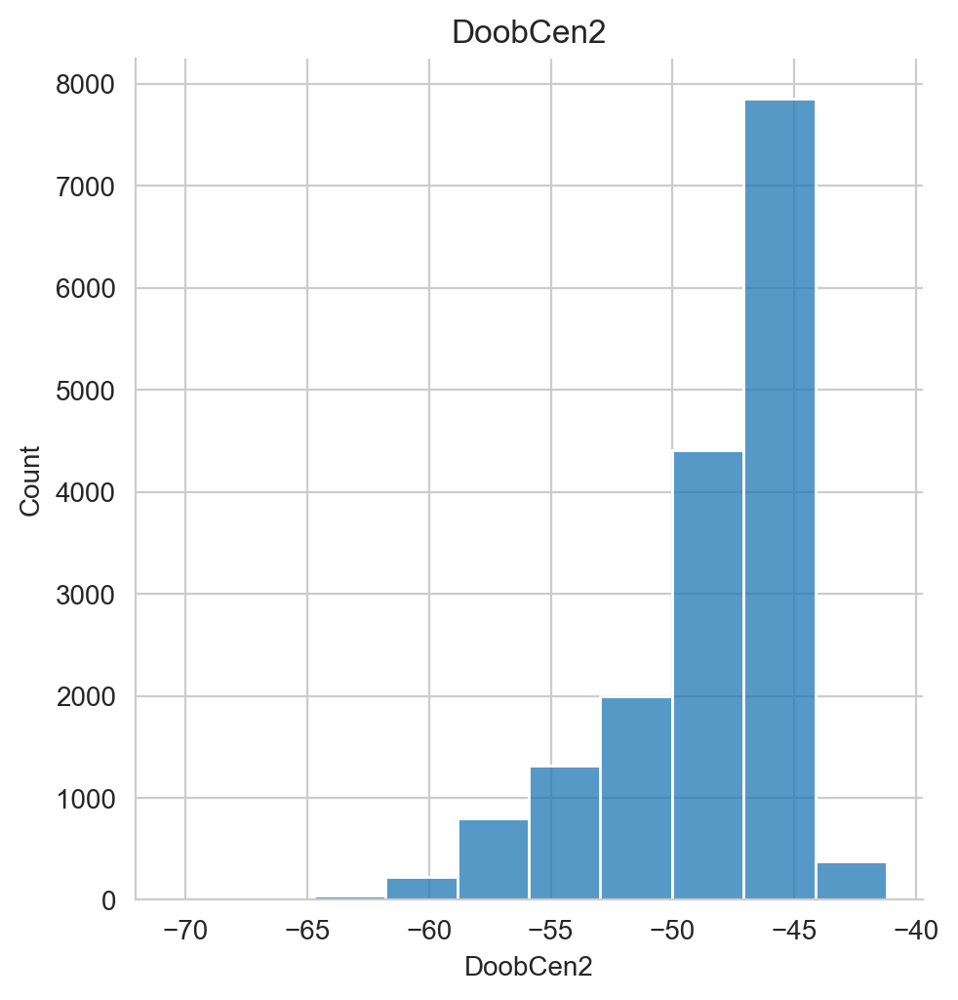

In [167]:
get_plot_dis(df=df7, n=7)

Критический уровень сигнала -58.0


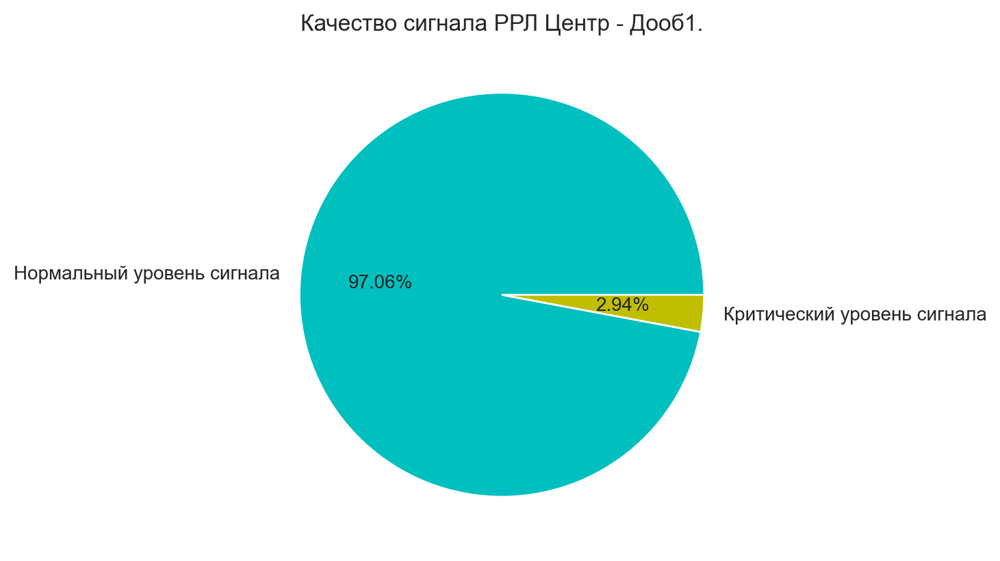

In [168]:
df7_5 = df7[df7['CenDoob1'] <= critical][['date_time','CenDoob1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df7)-len(df7_5)), len(df7_5)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Дооб1.');


Критический уровень сигнала -58.0


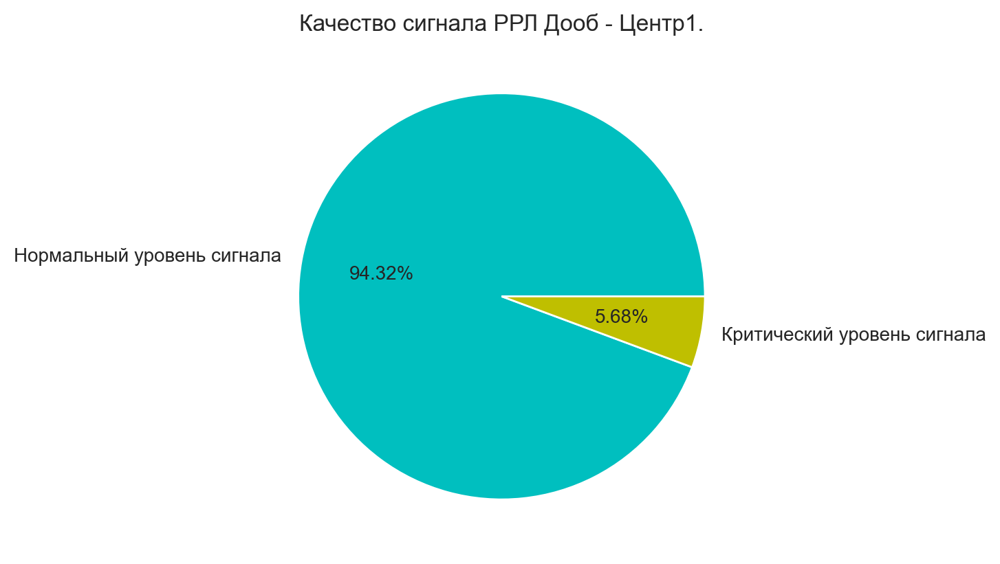

In [169]:
df7_6 = df7[df7['DoobCen1'] <= critical][['date_time','DoobCen1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df7)-len(df7_6)), len(df7_6)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Дооб - Центр1.');


Критический уровень сигнала -58.0


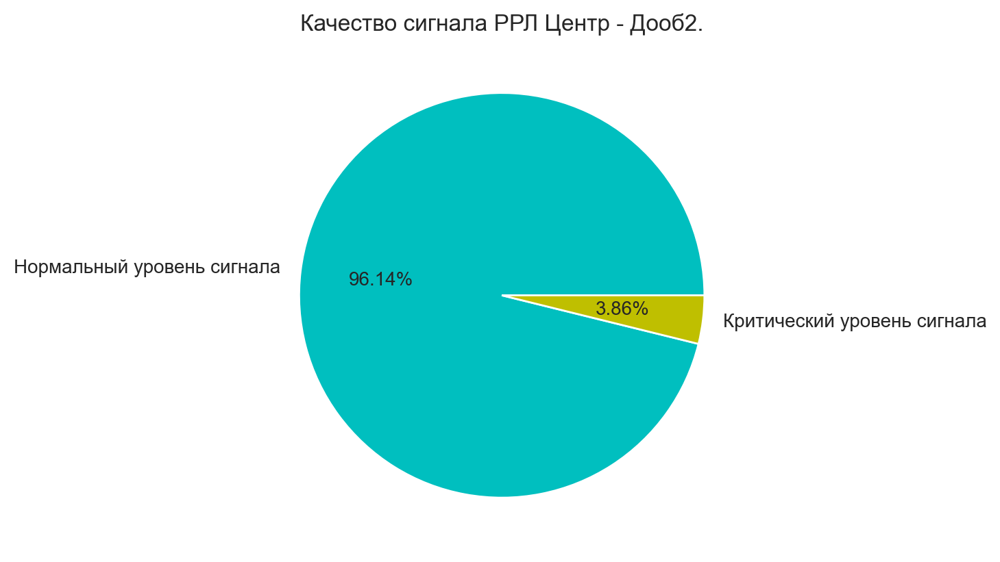

In [170]:
df7_7 = df7[df7['CenDoob2'] <= critical][['date_time','CenDoob2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df7)-len(df7_7)), len(df7_7)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Дооб2.');


Критический уровень сигнала -58.0


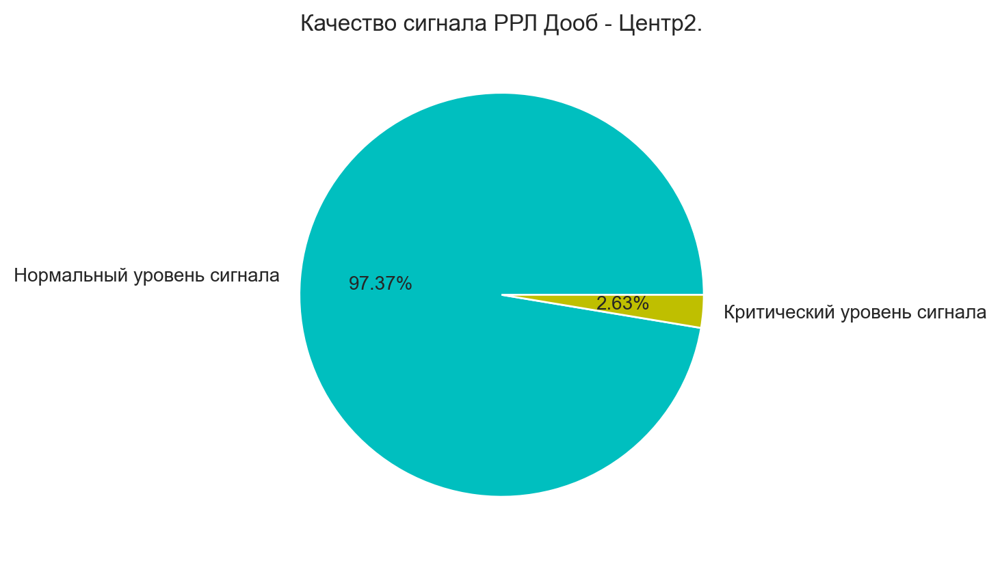

In [171]:
df7_8 = df7[df7['DoobCen2'] <= critical][['date_time','DoobCen2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df7)-len(df7_8)), len(df7_8)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Дооб - Центр2.');


### 2023 год.

In [172]:
df8 = df1[df1['year'] == 2023][['date_time', 'CenDoob1','CenDoob2',
                                                                 'DoobCen1', 'DoobCen2',
                                                                 'CenPenay1', 'CenPenay2',
                                                                 'PenayCen1', 'PenayCen2', 'month']]
df8


,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2,month
163761,2023-01-01 00:05:00,-46.2,-44.7,-51.3,-48.9,-43.2,-51.8,-45.3,-45.6,1
163762,2023-01-01 00:15:00,-49.2,-43.4,-50.6,-48.8,-43.2,-55.3,-45.0,-45.5,1
163763,2023-01-01 00:25:00,-50.9,-44.1,-51.9,-46.3,-42.9,-57.6,-45.3,-47.2,1
163764,2023-01-01 00:35:00,-47.8,-44.0,-54.9,-47.0,-42.8,-65.3,-45.3,-47.0,1
163765,2023-01-01 00:45:00,-46.9,-44.3,-49.9,-47.5,-43.5,-51.9,-44.2,-46.3,1
...,...,...,...,...,...,...,...,...,...,...
172926,2023-03-08 13:20:00,-50.7,-54.5,-47.8,-46.8,-48.6,-44.5,-44.8,-45.6,3
172927,2023-03-08 13:30:00,-49.7,-58.1,-46.6,-48.2,-45.9,-43.9,-45.4,-45.4,3
172928,2023-03-08 13:40:00,-49.6,-52.6,-48.7,-46.6,-47.5,-44.0,-45.2,-44.9,3
172929,2023-03-08 13:50:00,-49.3,-55.0,-47.9,-46.9,-52.2,-39.8,-42.8,-46.2,3


In [173]:
df8.to_csv('MiniLink_out_2023.csv', index=False) # за 2023 год


In [174]:
pd.set_option("display.precision", 1)
np.set_printoptions(precision=1)
df8.agg([np.mean, np.median, np.min, np.max])


,date_time,CenDoob1,CenDoob2,DoobCen1,DoobCen2,CenPenay1,CenPenay2,PenayCen1,PenayCen2,month
mean,2023-02-03 07:16:45.029443840,-48.5,-45.8,-50.2,-47.8,-45.8,-48.0,-45.6,-47.1,1.7
median,2023-02-03 18:10:00.000000000,-47.9,-44.8,-49.7,-47.4,-44.8,-47.3,-45.0,-46.6,2.0
amin,2023-01-01 00:05:00.000000000,-66.6,-67.5,-65.5,-73.6,-68.5,-78.2,-72.8,-58.8,1.0
amax,2023-03-08 14:00:00.000000000,-42.5,-40.3,-40.0,-42.5,-40.1,-36.6,-40.0,-41.9,3.0


## РРЛ Пенай 1, 2, 3 месяцы 2023 год.

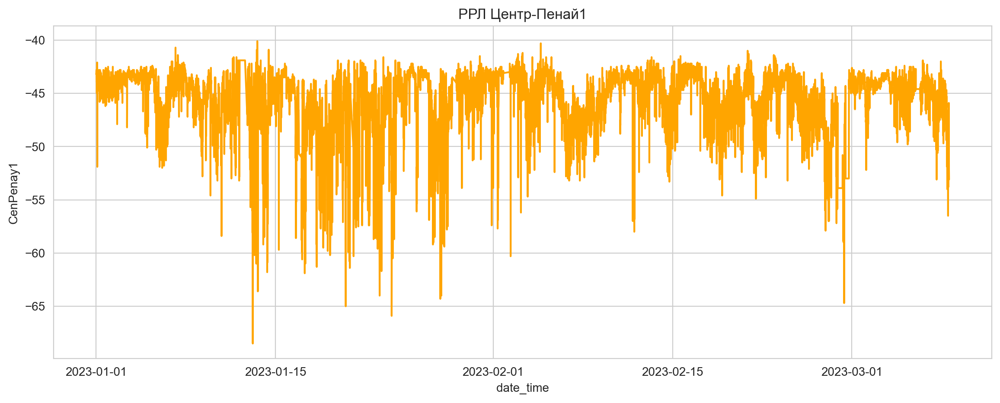

In [175]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenPenay1", data = df8 , legend = 'auto', color = '#FFA500')\
                                                                  .set(title='РРЛ Центр-Пенай1');
plt.show()


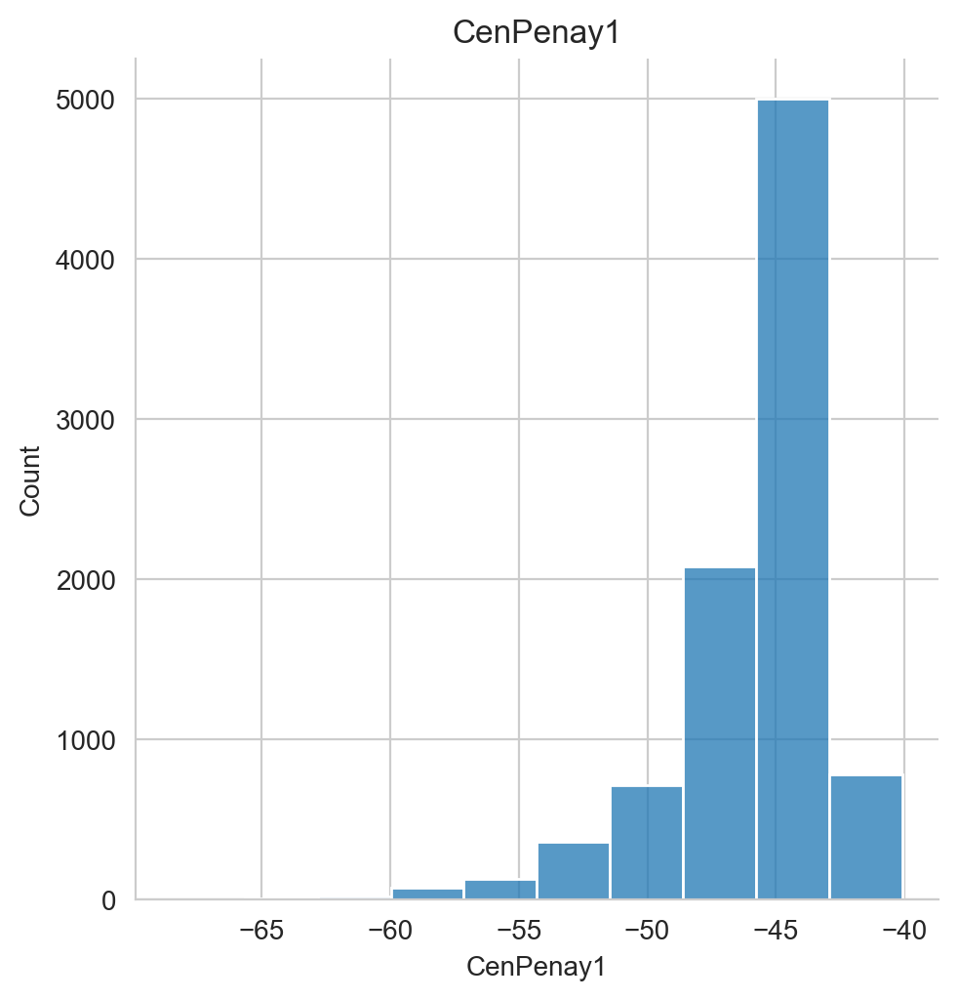

In [176]:
get_plot_dis(df=df8, n=0)

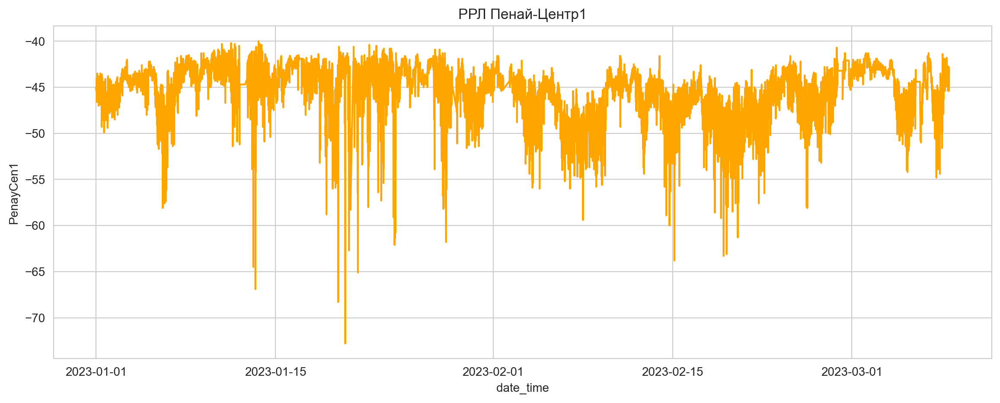

In [177]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "PenayCen1", data = df8 , legend = 'auto', color = '#FFA500')\
                                                             .set(title='РРЛ Пенай-Центр1');
plt.show()


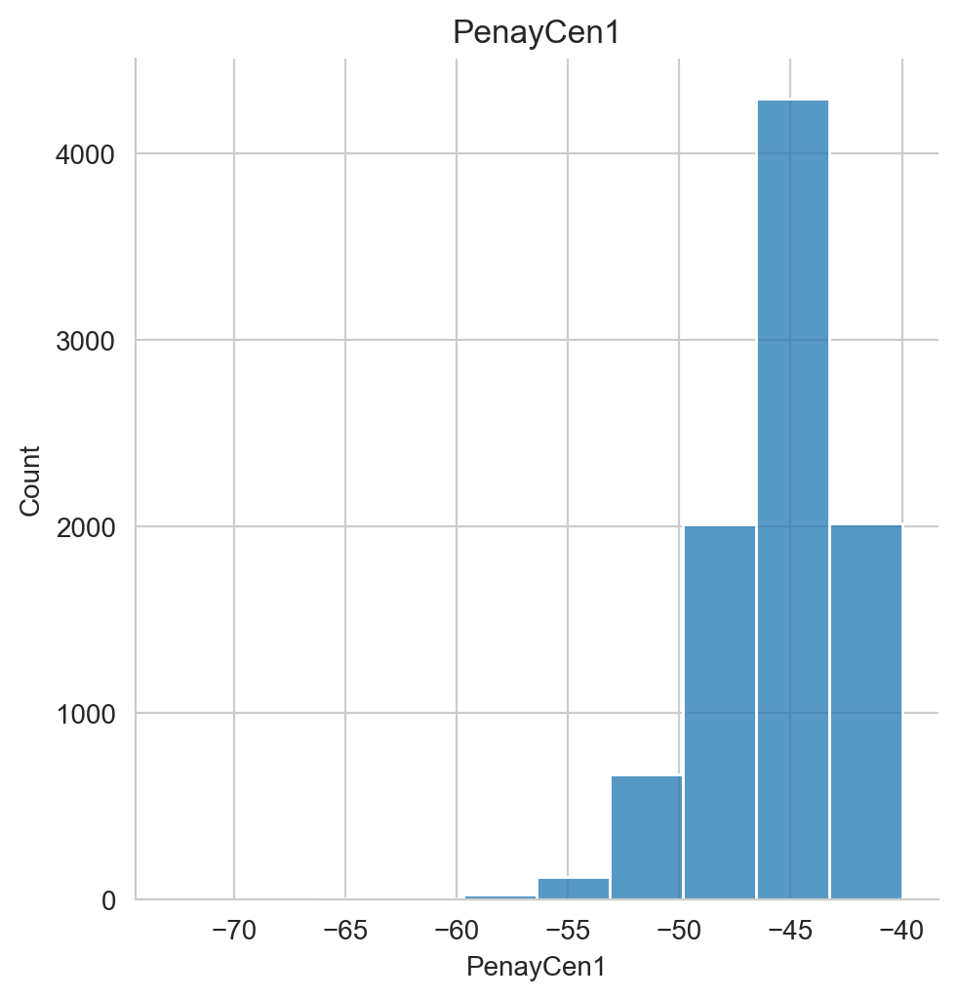

In [178]:
get_plot_dis(df=df8, n=1)

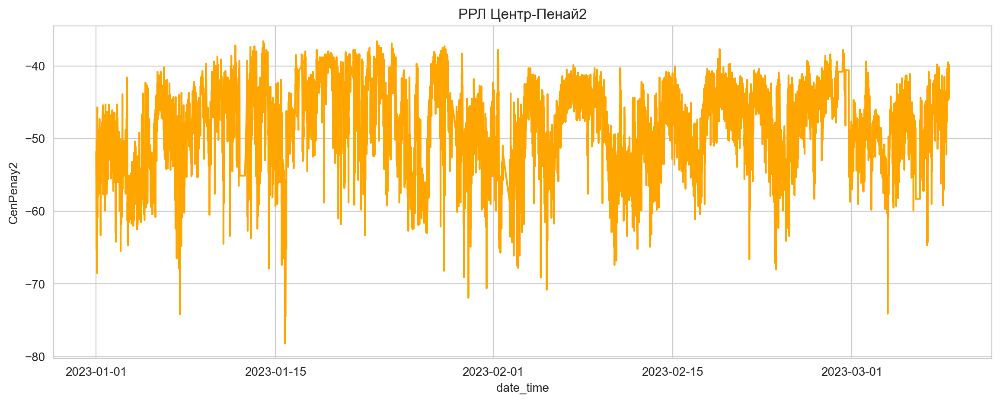

In [179]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenPenay2", data = df8 , legend = 'auto', color = '#FFA500')\
                                                                .set(title='РРЛ Центр-Пенай2');
plt.show()


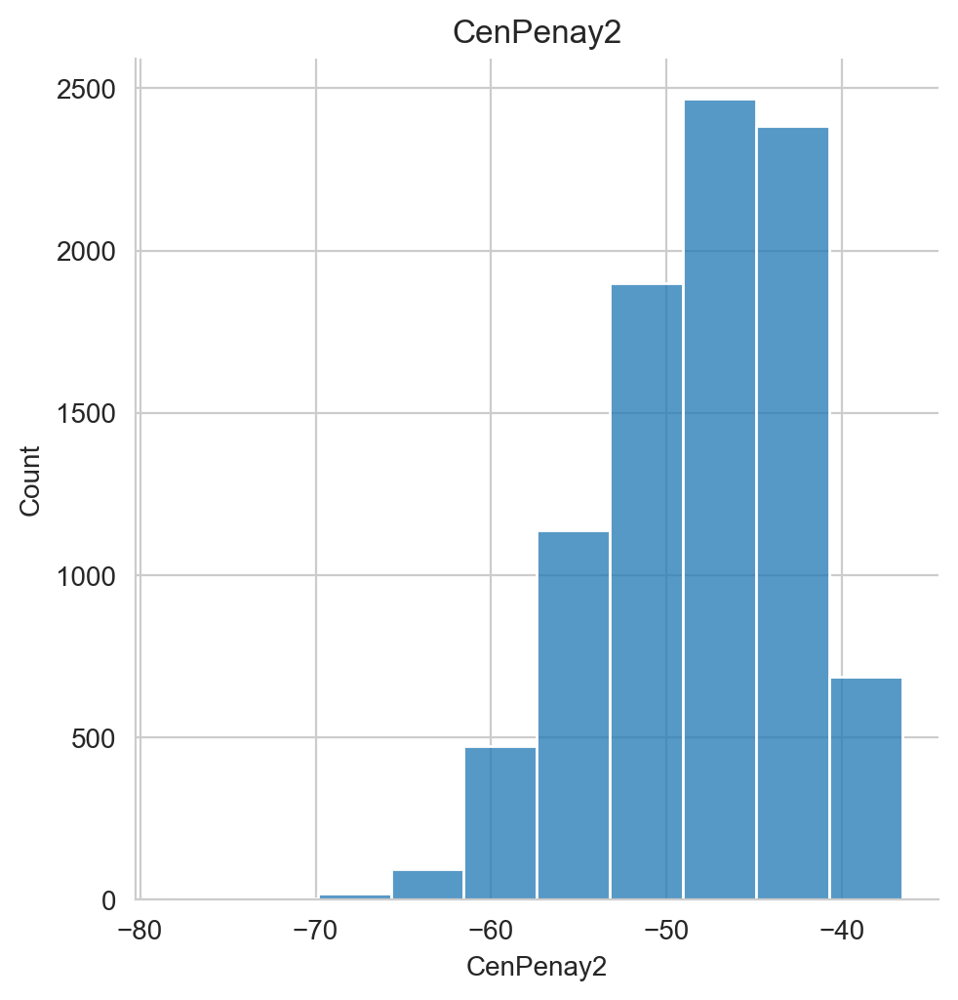

In [180]:
get_plot_dis(df=df8, n=2)

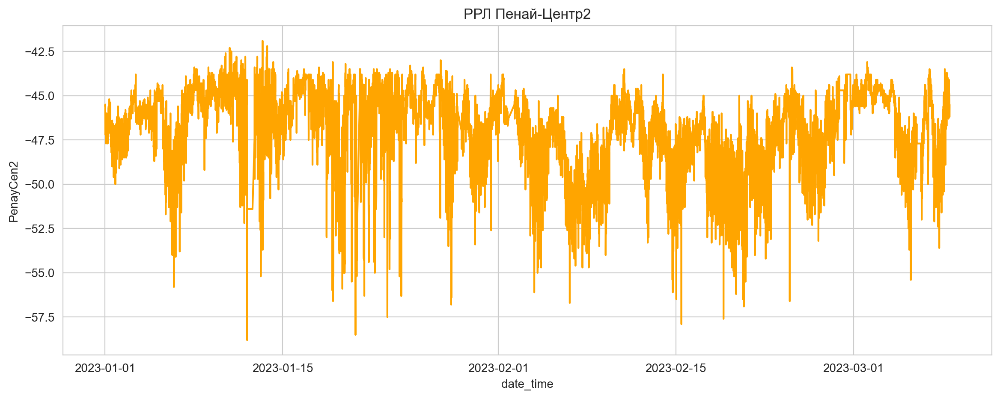

In [181]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "PenayCen2", data = df8 , legend = 'auto', color = '#FFA500')\
                                                             .set(title='РРЛ Пенай-Центр2');
plt.show()


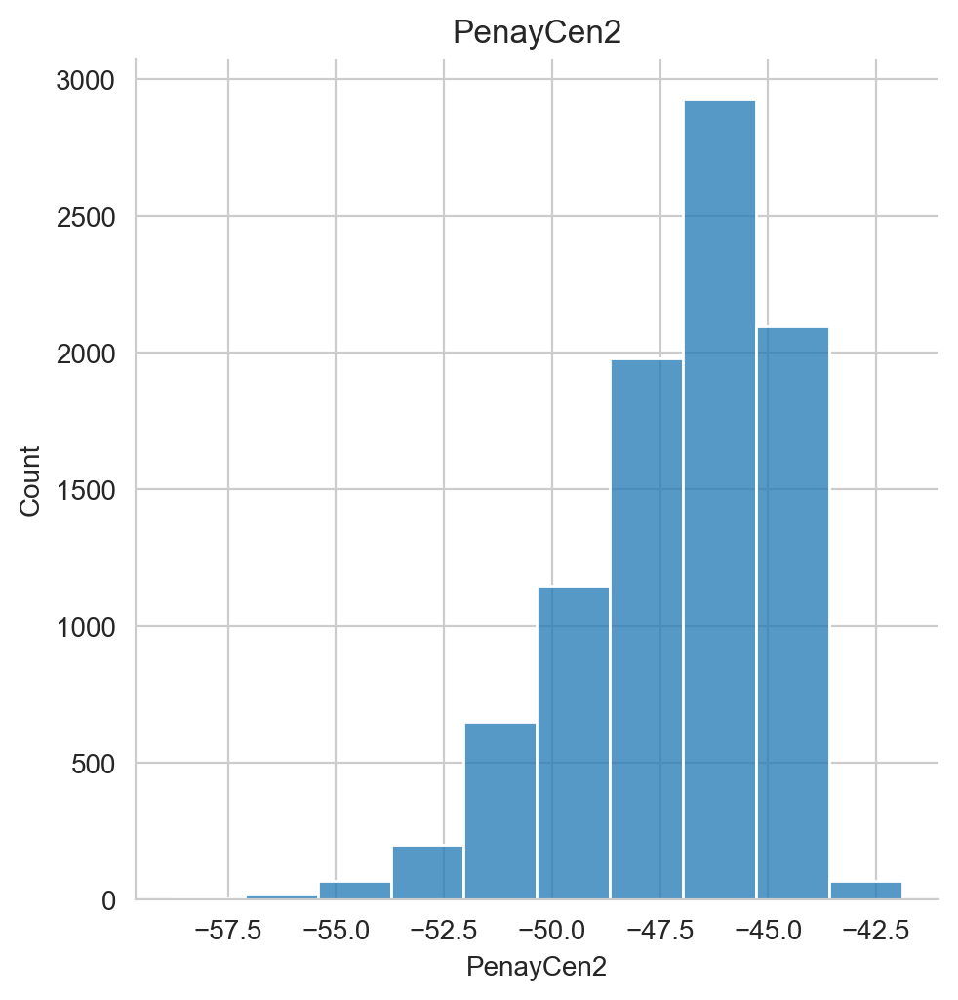

In [182]:
get_plot_dis(df=df8, n=3)

Критический уровень сигнала -58.0


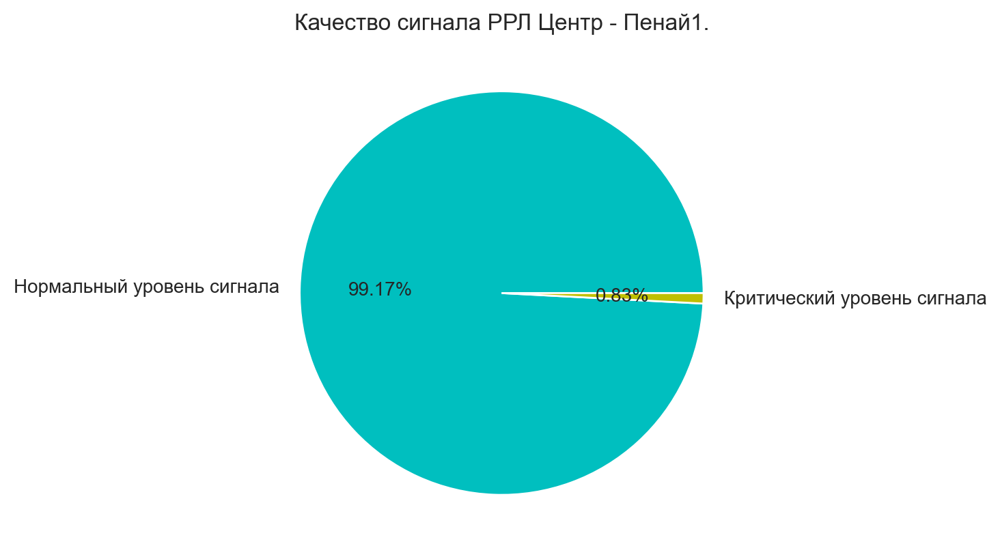

In [183]:
df8_1 = df8[df8['CenPenay1'] <= critical][['date_time','CenPenay1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df8)-len(df8_1)), len(df8_1)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Пенай1.');


Критический уровень сигнала -58.0


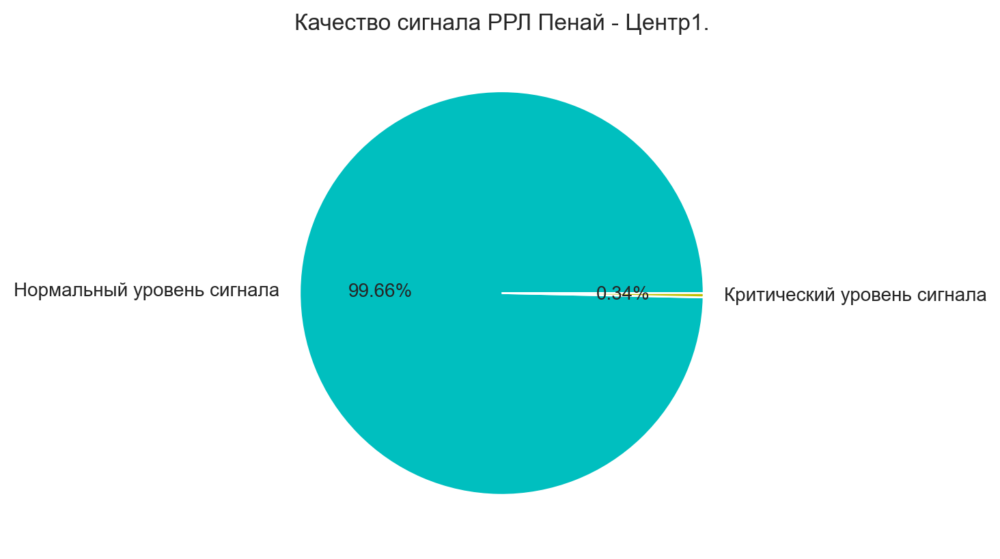

In [184]:
df8_2 = df8[df8['PenayCen1'] <= critical][['date_time','PenayCen1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df8)-len(df8_2)), len(df8_2)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Пенай - Центр1.');


Критический уровень сигнала -58.0


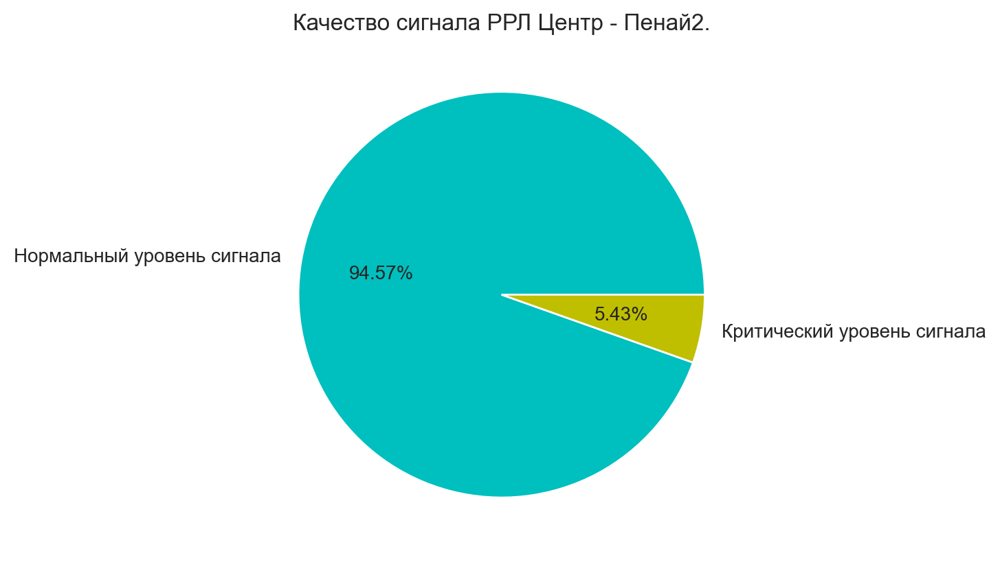

In [185]:
df8_3 = df8[df8['CenPenay2'] <= critical][['date_time','CenPenay2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df8)-len(df8_3)), len(df8_3)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Пенай2.');


Критический уровень сигнала -58.0


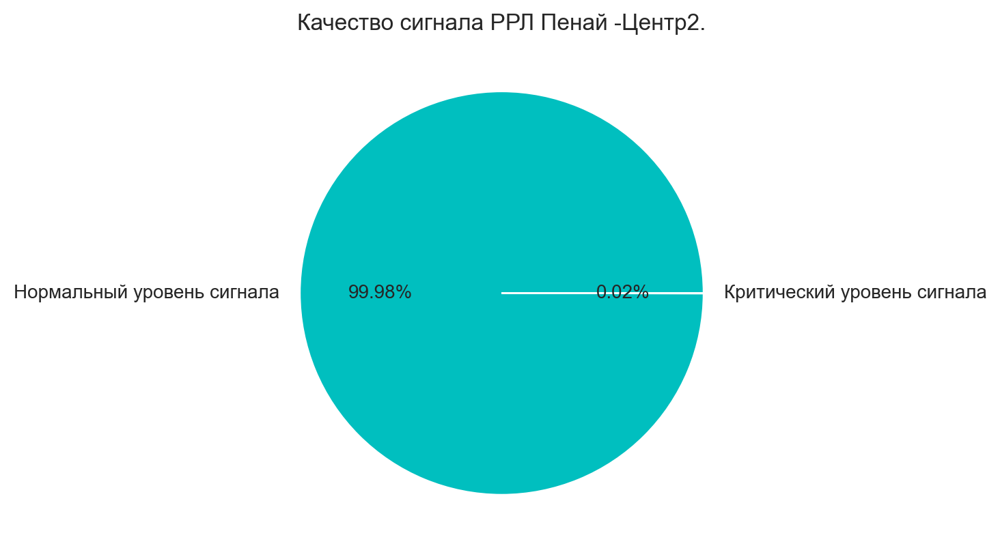

In [186]:
df8_4 = df8[df8['PenayCen2'] <= critical][['date_time','PenayCen2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df8)-len(df8_4)), len(df8_4)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Пенай -Центр2.');


## РРЛ Дооб 1, 2, 3 месяцы 2023 год.

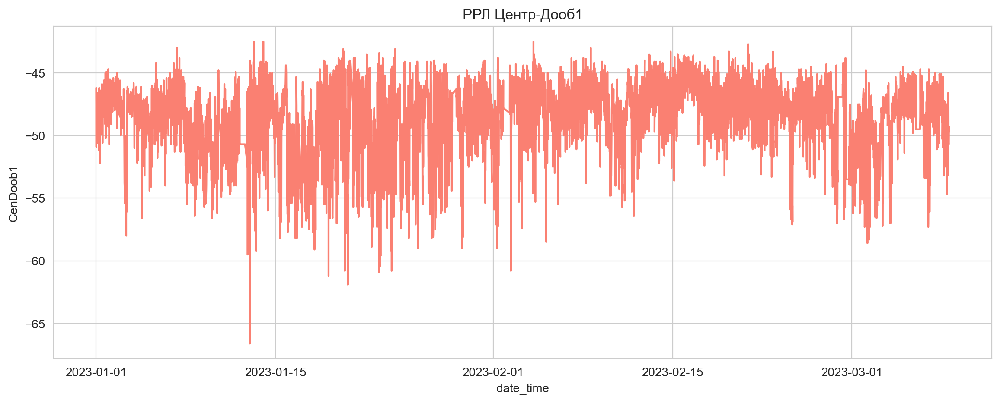

In [187]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenDoob1", data = df8 , legend = 'auto', color = 'salmon')\
                                                   .set(title='РРЛ Центр-Дооб1');

plt.show()


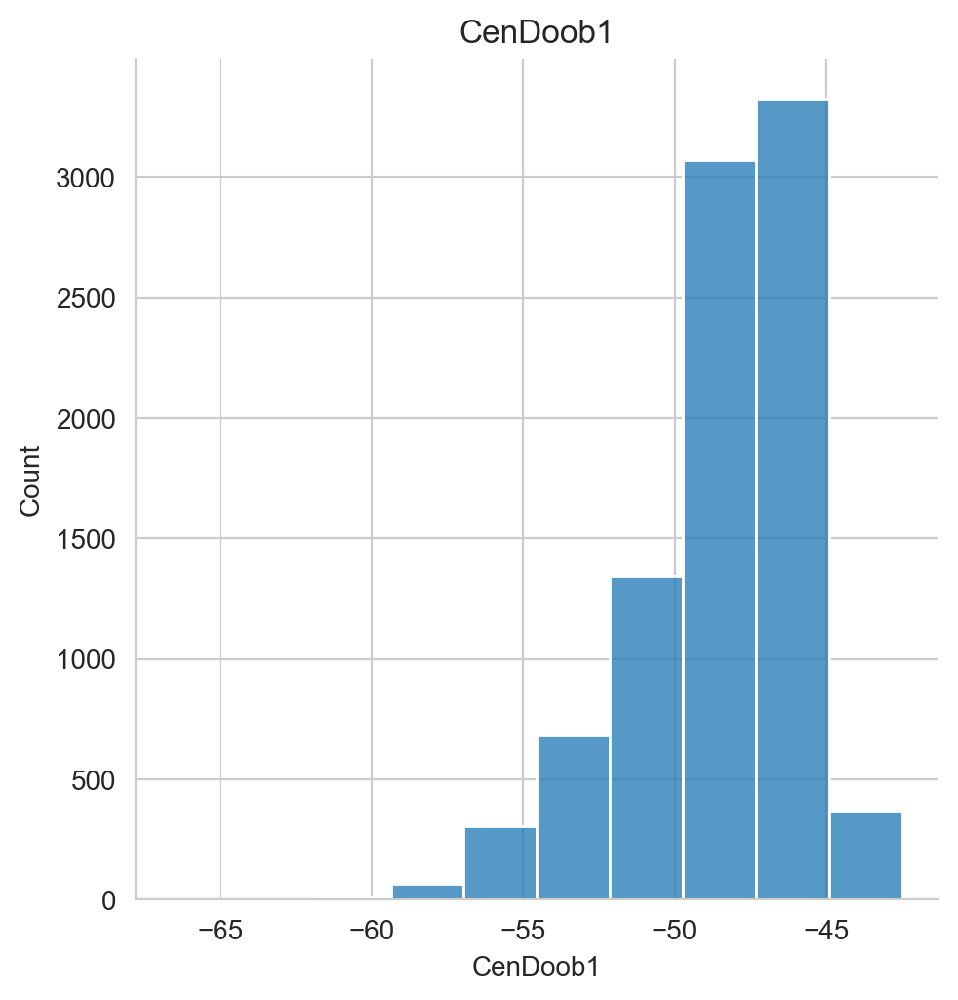

In [188]:
get_plot_dis(df=df8, n=4)

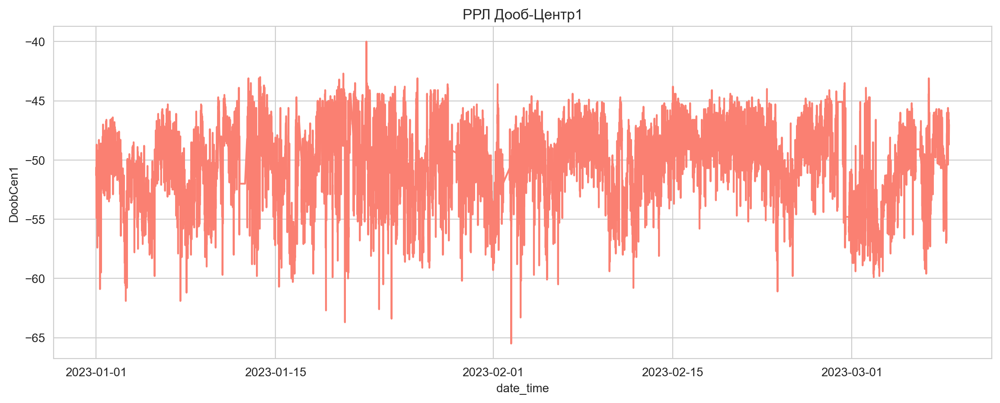

In [189]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "DoobCen1", data = df8 , legend = 'auto', color = 'salmon')\
                                                   .set(title='РРЛ Дооб-Центр1');
plt.show()


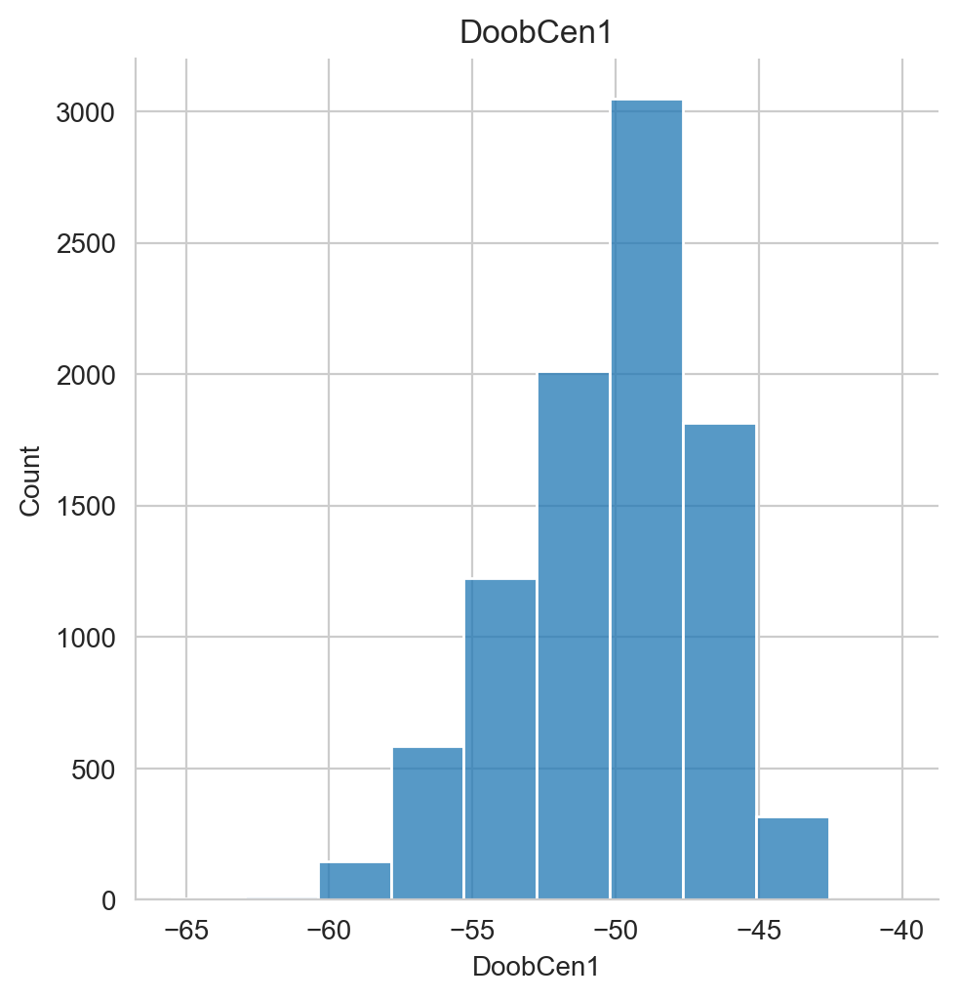

In [190]:
get_plot_dis(df=df8, n=5)

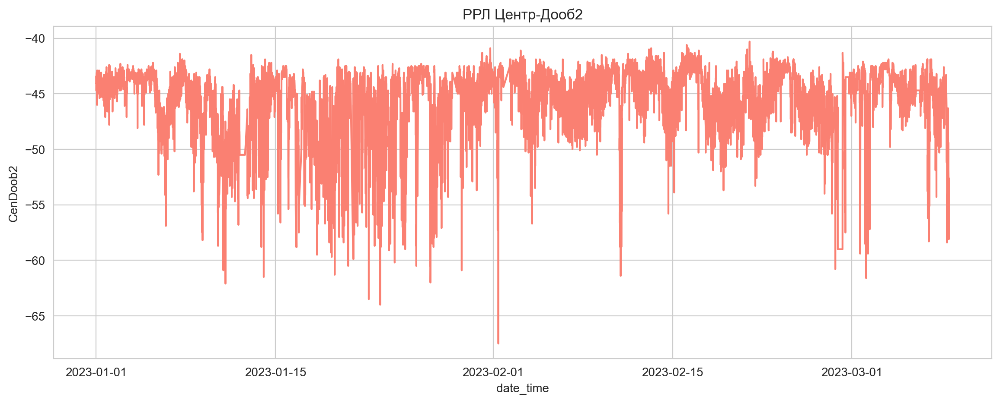

In [191]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "CenDoob2", data = df8 , legend = 'auto', color = 'salmon')\
                                                              .set(title='РРЛ Центр-Дооб2');
plt.show()


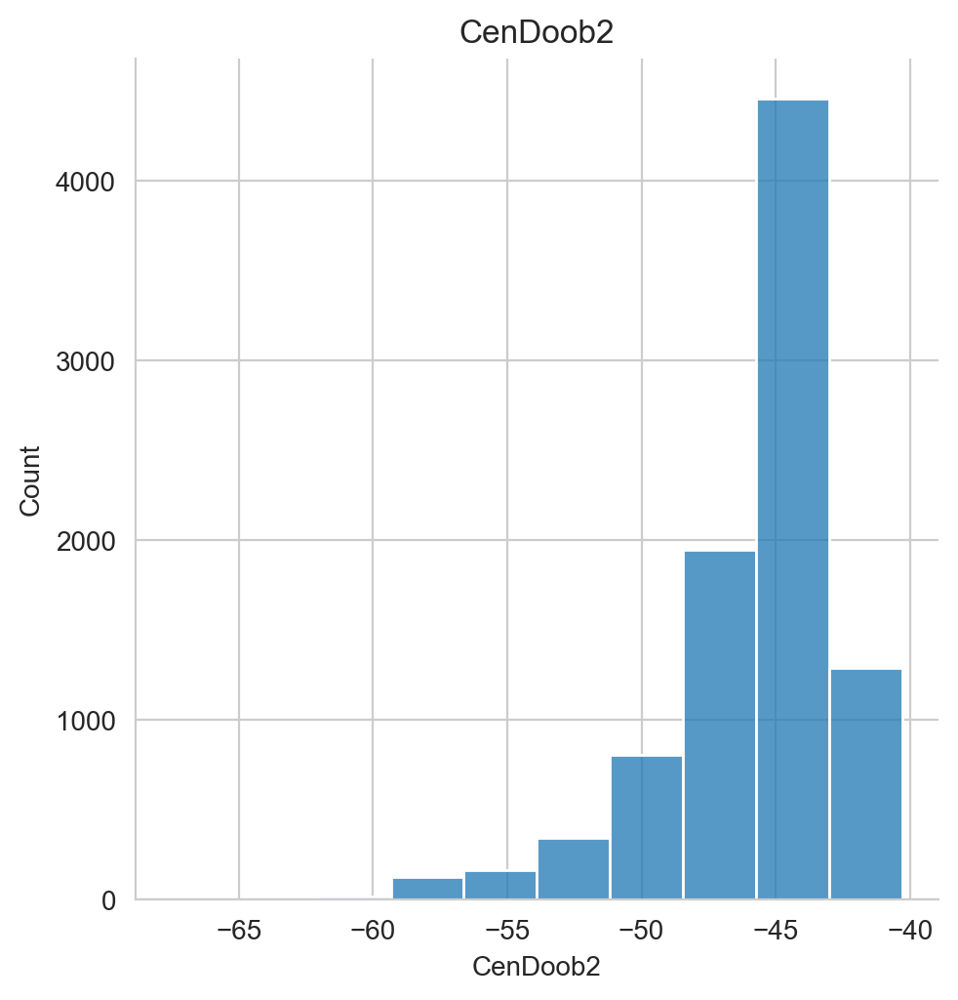

In [192]:
get_plot_dis(df=df8, n=6)

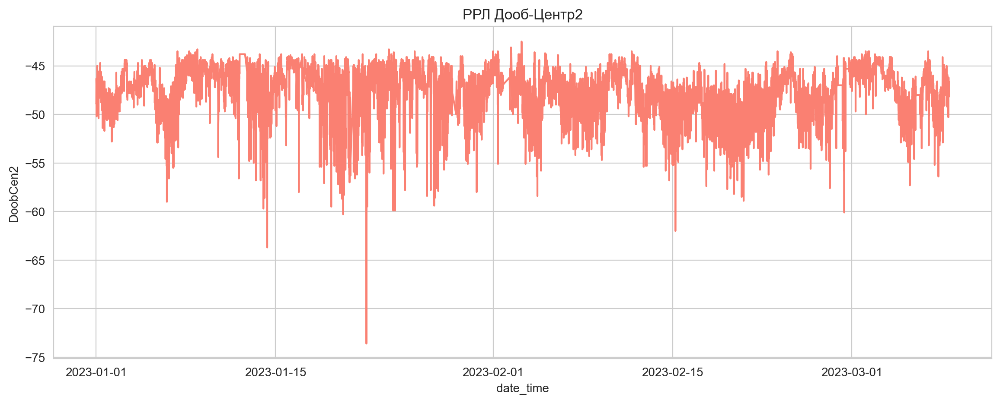

In [193]:
plt.figure(figsize=(14, 5))
sns.lineplot(x = "date_time", y = "DoobCen2", data = df8 , legend = 'auto', color = 'salmon')\
                                                              .set(title='РРЛ Дооб-Центр2');
plt.show()


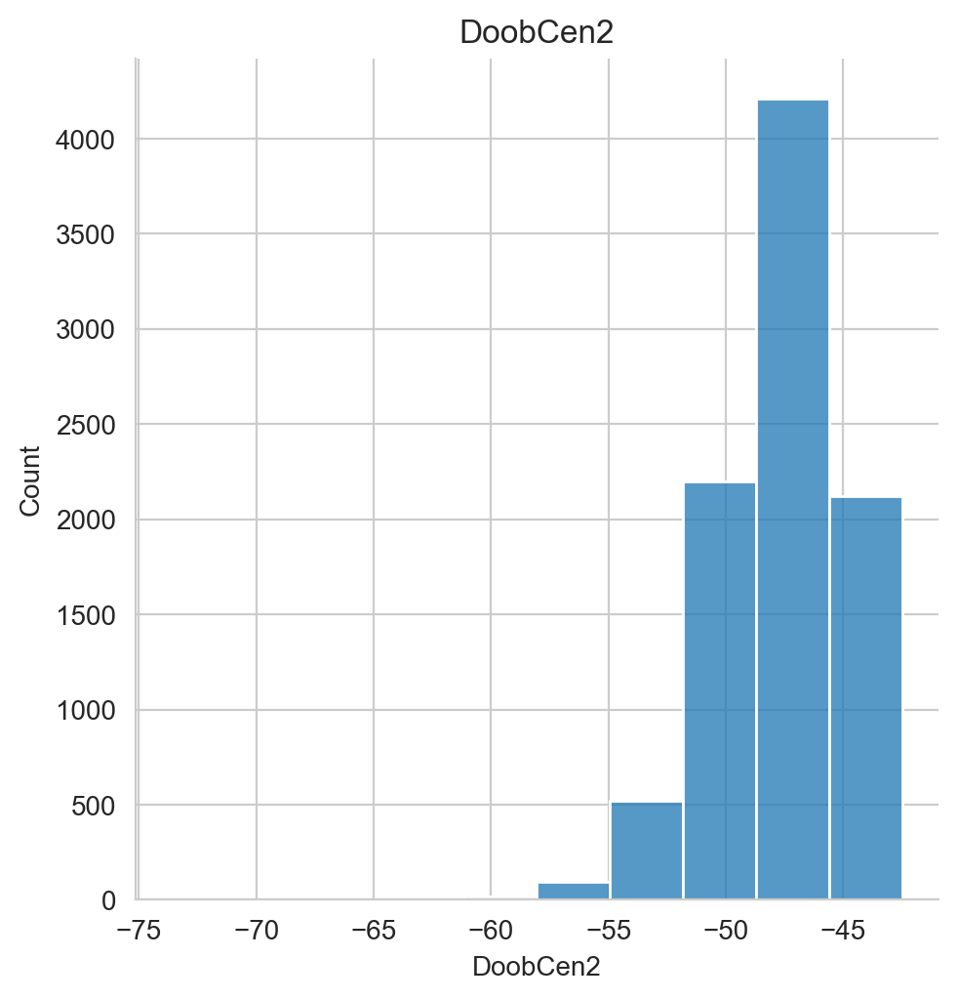

In [194]:
get_plot_dis(df=df8, n=7)

Критический уровень сигнала -58.0


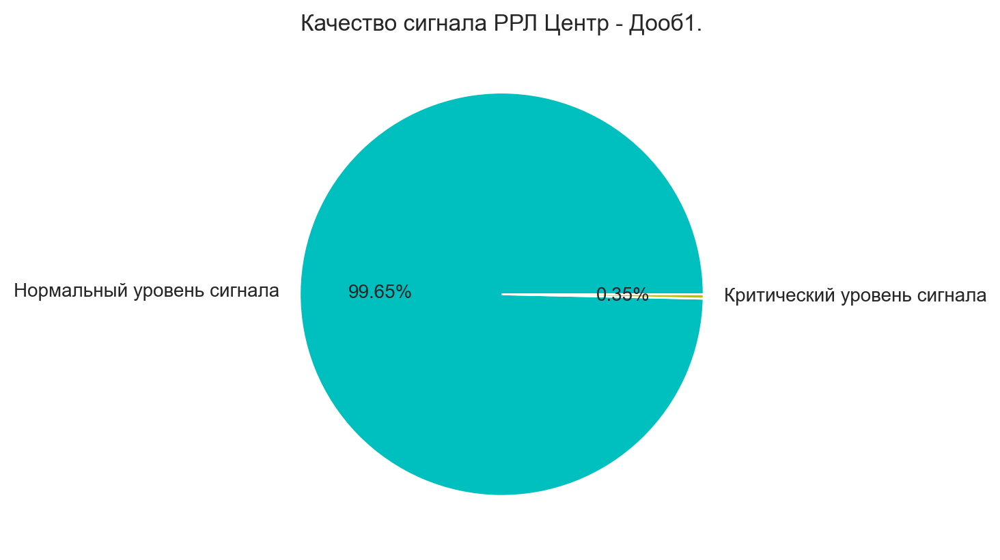

In [195]:
df8_5 = df8[df8['CenDoob1'] <= critical][['date_time','CenDoob1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df8)-len(df8_5)), len(df8_5)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Дооб1.');


Критический уровень сигнала -58.0


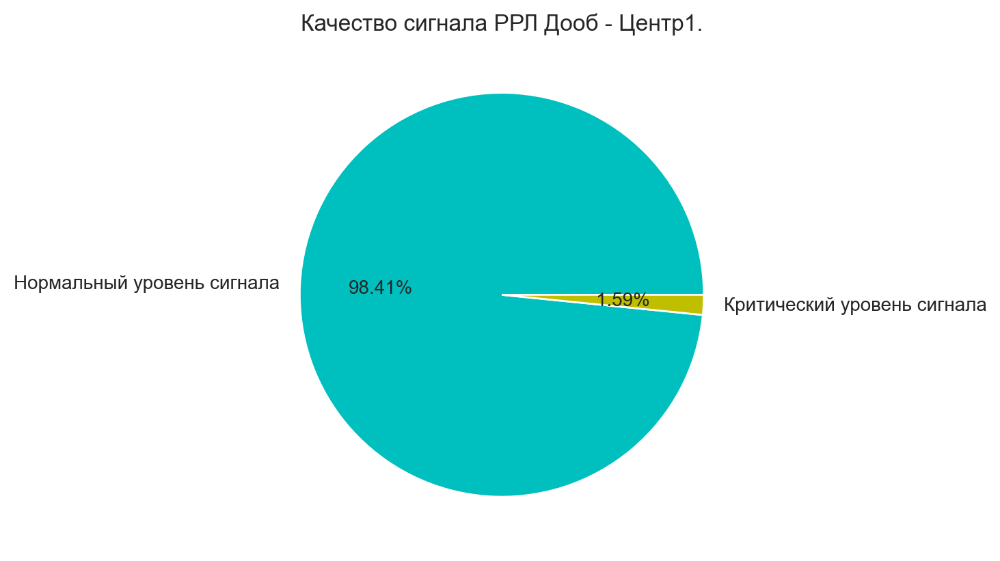

In [196]:
df8_6 = df8[df8['DoobCen1'] <= critical][['date_time','DoobCen1']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df8)-len(df8_6)), len(df8_6)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Дооб - Центр1.');


Критический уровень сигнала -58.0


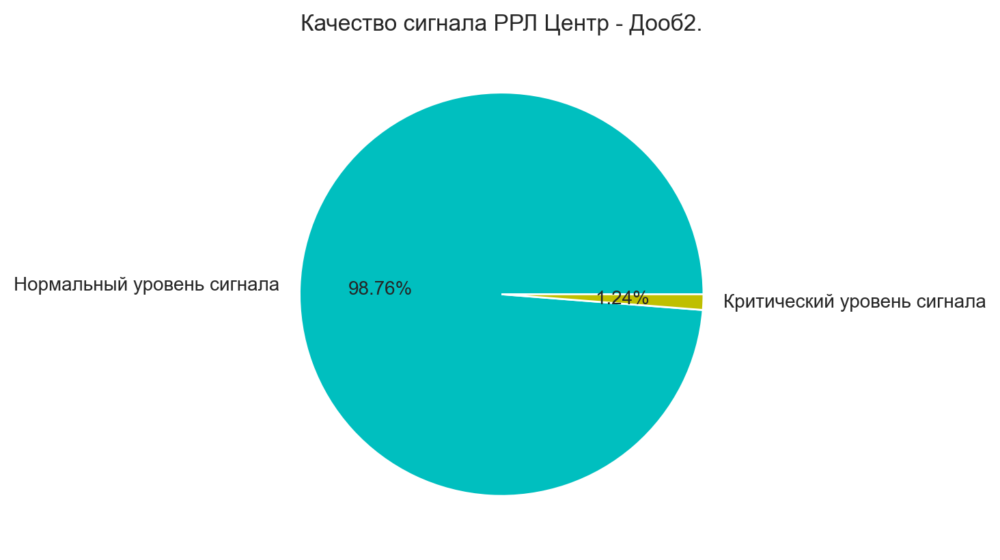

In [197]:
df8_7 = df8[df8['CenDoob2'] <= critical][['date_time','CenDoob2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df8)-len(df8_7)), len(df8_7)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Центр - Дооб2.');


Критический уровень сигнала -58.0


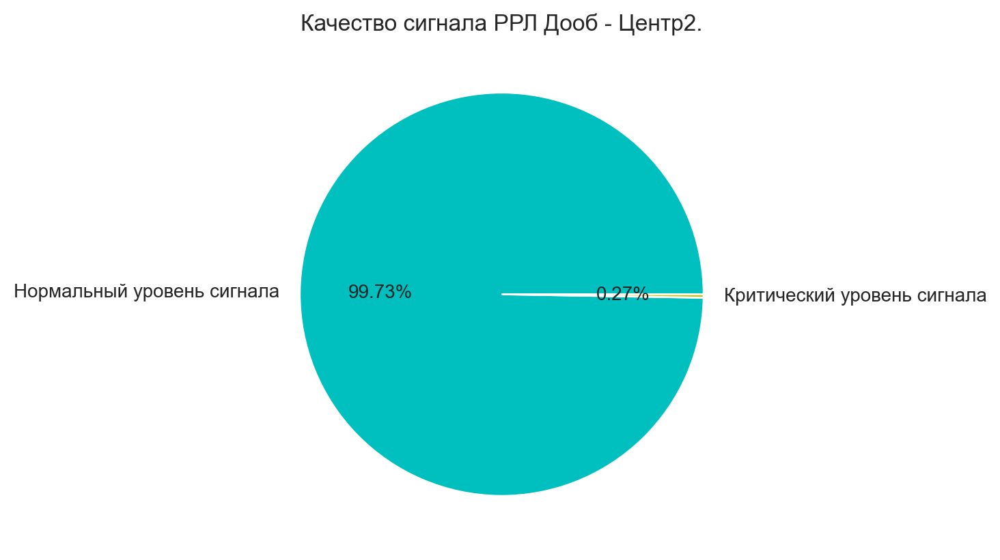

In [198]:
df8_8 = df8[df8['DoobCen2'] <= critical][['date_time','DoobCen2']]
print('\033[1m' + "Критический уровень сигнала" + '\033[0m', critical)
plt.pie([(len(df8)-len(df8_8)), len(df8_8)], \
        labels = ['Нормальный уровень сигнала', 'Критический уровень сигнала'], 
        colors = ['c','y'], autopct='%1.2f%%');
plt.title('Качество сигнала РРЛ Дооб - Центр2.');


## Вывод: 

**Учитывать будем данные после апреля 2020 года (производился перенос РРЛ антенн на новое место и соответствующая настройка). Повышенный процент значений ниже критического уровня сигнала наблюдается в теплое время года, что обычное явление для радио-релейных линий связи. Но на пролете РРЛ Центр - Пенай2 процент повышенный и в холодное время года. Предположительно необходимо настроить направление зеркал антенн.**  
